# 画图

In [2]:
%matplotlib notebook
import imp, time
from collections import Counter, OrderedDict, defaultdict, deque, namedtuple
import matplotlib.pyplot as plt
import numpy as np, sympy as sy
from sklearn.cluster import KMeans
from scipy import constants as const, signal
from scipy.fftpack import fft, hilbert, ifft
from scipy.optimize import curve_fit
from scipy.optimize import least_squares as ls, curve_fit, basinhopping as bh
from sympy import diff, symbols
import pandas as pd, seaborn as sns
from numba import jit
import qulab.optimize, scipy
from qulab import waveform_new, data2imag, measureroutine_population, computewave_wave, dataTools
from qulab.storage.utils import save

mrw = imp.reload(measureroutine_population)
op = imp.reload(qulab.optimize)
wn = imp.reload(waveform_new)
di = imp.reload(data2imag)
cww = imp.reload(computewave_wave)
dt = imp.reload(dataTools)
read = di.read
write = di.write

In [362]:
help(signal.deconvolve)

Help on function deconvolve in module scipy.signal.signaltools:

deconvolve(signal, divisor)
    Deconvolves ``divisor`` out of ``signal`` using inverse filtering.
    
    Returns the quotient and remainder such that
    ``signal = convolve(divisor, quotient) + remainder``
    
    Parameters
    ----------
    signal : array_like
        Signal data, typically a recorded signal
    divisor : array_like
        Divisor data, typically an impulse response or filter that was
        applied to the original signal
    
    Returns
    -------
    quotient : ndarray
        Quotient, typically the recovered original signal
    remainder : ndarray
        Remainder
    
    Examples
    --------
    Deconvolve a signal that's been filtered:
    
    >>> from scipy import signal
    >>> original = [0, 1, 0, 0, 1, 1, 0, 0]
    >>> impulse_response = [2, 1]
    >>> recorded = signal.convolve(impulse_response, original)
    >>> recorded
    array([0, 2, 1, 0, 2, 3, 1, 0, 0])
    >>> recovered,

In [3]:
x = Record.objects(title='S21vsFlux').order_by('-finished_time')[0]
x

Record(title=S21vsFlux, finished_time=2020-08-05 17:05:19.470959, tags=['q1'])

In [4]:
data, ID, comment, tags, name, finishtime = read(title='S21vsFlux_awgoffset',which=0)
np.shape(data[2])

(21, 201, 10)

## 保存qubit工作点

In [391]:
qstate = []
def tuple2dict(q):
    for i in q:
        qstate.append(i.asdict())
    return qstate

bit = [q1,q2,q3,q4,q5,q6,q7,q8,q9,q10]
filepath = save('QubitState','qubitstate',state = tuple2dict(bit),base_path=r'D:\skzhao\file_name\wave')
with open(r'D:\skzhao\file_name\qubit_state_wave.txt', mode='a') as filename:
    filename.write(str(filepath))
    filename.write('\n')
print(filepath)

D:\skzhao\file_name\wave\2020\1124\QubitState\qubitstate_20201124184823.npz


In [516]:
q3.asdict()

{'q_name': 'q3',
 'inst': {'z_awg': 'awg132',
  'z_ch': [5],
  'ex_awg': 'awg134',
  'ex_ch': [3, 7],
  'ex_lo': 'psg_ex1',
  'com': 'com3'},
 'T_bias': [2.703, 0.16],
 'T_z': [1.676, 0.114],
 'specinterp': [array([4.14410001, 4.14410758, 4.14411515, ..., 5.29363958, 5.29364151,
         5.29364345]),
  array([-0.5       , -0.49999856, -0.49999712, ..., -0.14000288,
         -0.14000144, -0.14      ])],
 'specfunc': 5.34571620457854*(0.298571282705535*tan(1.87215319822776*x - 0.190959626219232)**2 + 1)**(1/4)*sqrt(Abs(cos(1.87215319822776*x - 0.190959626219232))) - 0.684380714178389,
 'specfuncz': [5.74709235817411*(6.80189049502004e-6*tan(1.81609274332375*x - 0.0016853551657154)**2 + 1)**(1/4)*sqrt(Abs(cos(1.81609274332375*x - 0.0016853551657154))) - 0.359072266966759,
  0.10202114460312545,
  1.7298635574305334,
  11.49805819466171,
  0.35907226696675903,
  -0.002608043422763517],
 'specfunc_cavity': sqrt((5.34571620457854*(0.298571282705535*tan(1.87215319822776*x - 0.190959626219232

## 提取qubit工作点

In [295]:
fl = np.loadtxt(r'D:\skzhao\file_name\qubit_state_wave.txt',dtype='str')
f = str(fl[-1])
data = np.load(f,allow_pickle=True)
def dict2tuple(q):
    for i,k in enumerate(q):
        attr = {}
        for j in mrw.qubit().asdict():
            if j in k:
                attr[j] = k[j]
            else:
                attr[j] = None
        globals()[k['q_name']] = mrw.qubit(**attr)

dict2tuple(data['state'])
print(f)

D:\skzhao\file_name\wave\2020\1124\QubitState\qubitstate_20201124003343.npz


# 查看图形

<IPython.core.display.Javascript object>


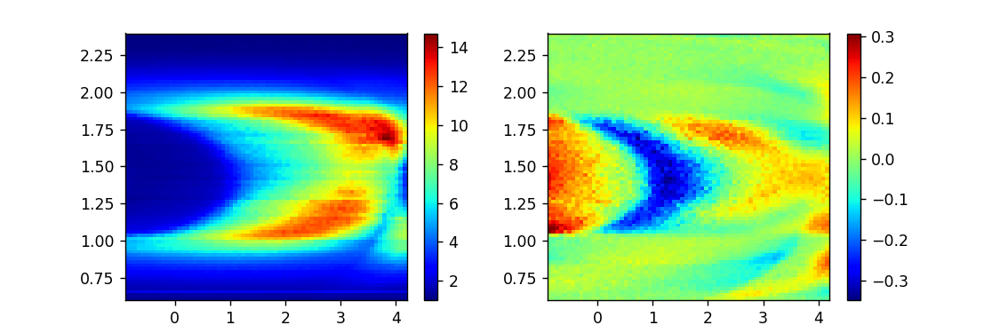

['bluefors_jpa_xue', 'fcenter=6780000000.0'] 2020-10-25 09:33:21.160021


In [32]:
value,num,tags,finishtime = write(title='BiasvsPump',height=3,which=15,phase='phase',peak=11200,dePhase=True)
print(tags,finishtime)

<IPython.core.display.Javascript object>


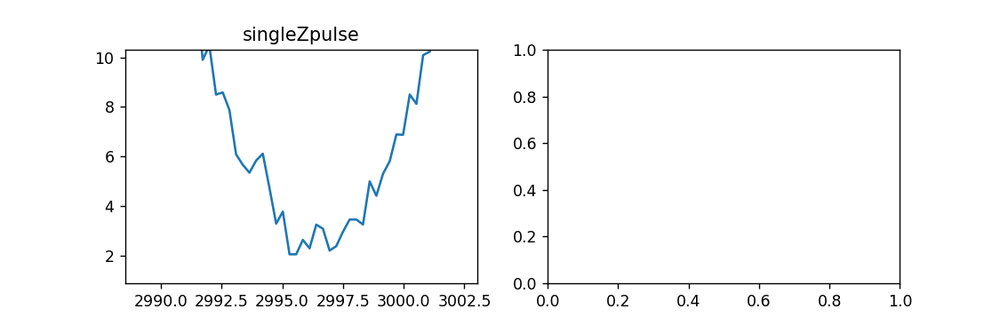

['q10'] 2020-11-24 00:27:59.959080


In [239]:
value,num,tags,finishtime = write(height=3,which=0,peak=11200)
print(tags,finishtime)

In [355]:
np.shape(value)

(10, 2, 1701)

In [356]:
(4.236-4.13)*2

0.21199999999999974

In [127]:
f = (value[0][0])

<IPython.core.display.Javascript object>


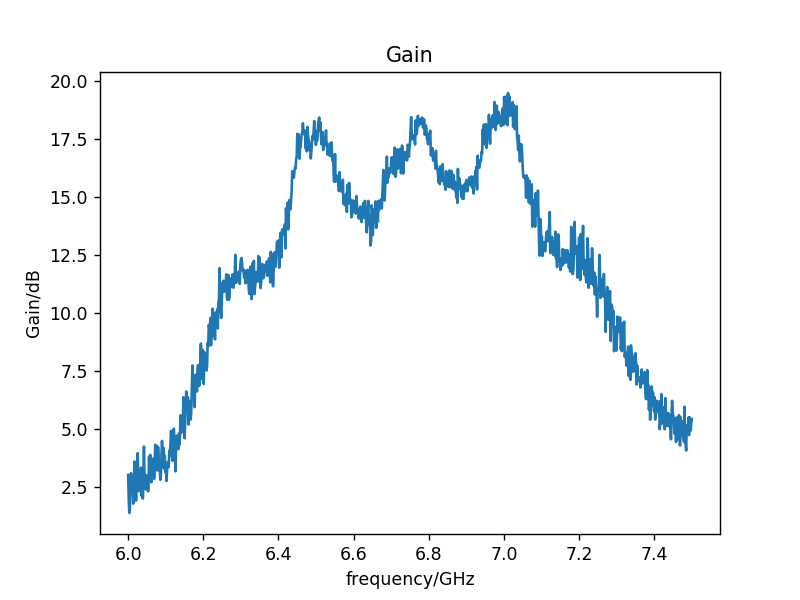

Text(0, 0.5, 'Gain/dB')

In [143]:
plt.figure()
# plt.plot(f,abs(d_on))
# plt.plot(f,abs(d_off))
plt.plot(f,20*np.log10(abs(d_on))-20*np.log10(abs(d_off)))
plt.title('Gain')
plt.xlabel('frequency/GHz')
plt.ylabel('Gain/dB')
# plt.legend('NF')

In [112]:
np.savez('jpa_off_1111',data = value)

In [402]:
flux, power, sf = value[0][0], value[0][1], value[0][2]
index = np.argwhere(np.abs(sf)==np.max(np.abs(sf)))[0]
p_op, c_op = power[index[1]], flux[index[0]]
print('current=%f, power=%f'%(c_op,p_op))

current=-1.250000, power=4.700000


In [147]:
(4.844-4.714)*2

0.2599999999999998

<IPython.core.display.Javascript object>


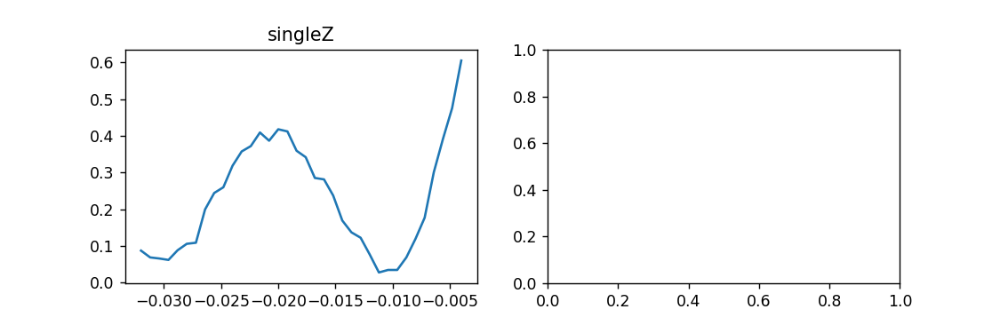

[] 2020-11-11 11:35:07.117446


In [150]:
value,num,tags,finishtime = write(height=3,which=0,peak=11200)
print(tags,finishtime)

<IPython.core.display.Javascript object>


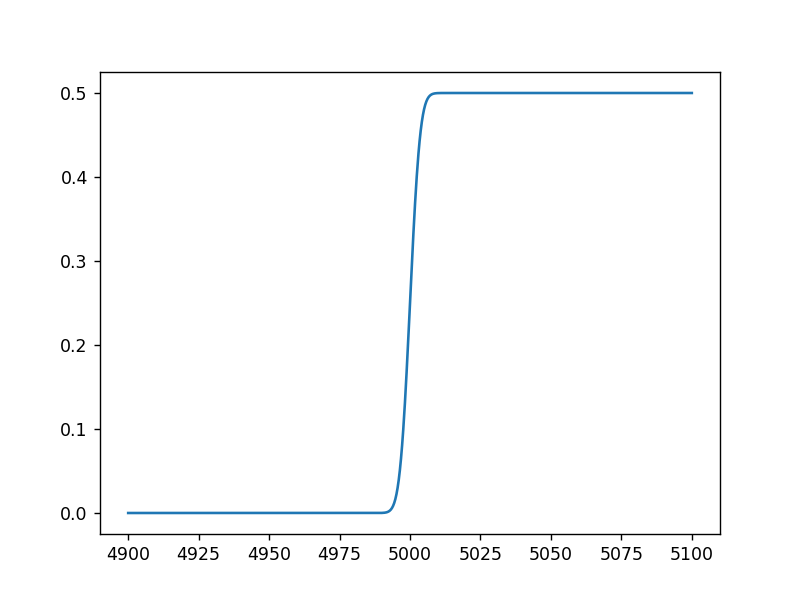

In [145]:
func = lambda t: (scipy.special.erf((t-5000)/4)+1)/2*0.5
t = np.linspace(4900,5100,1001)
plt.figure()
plt.plot(t,func(t))

<IPython.core.display.Javascript object>


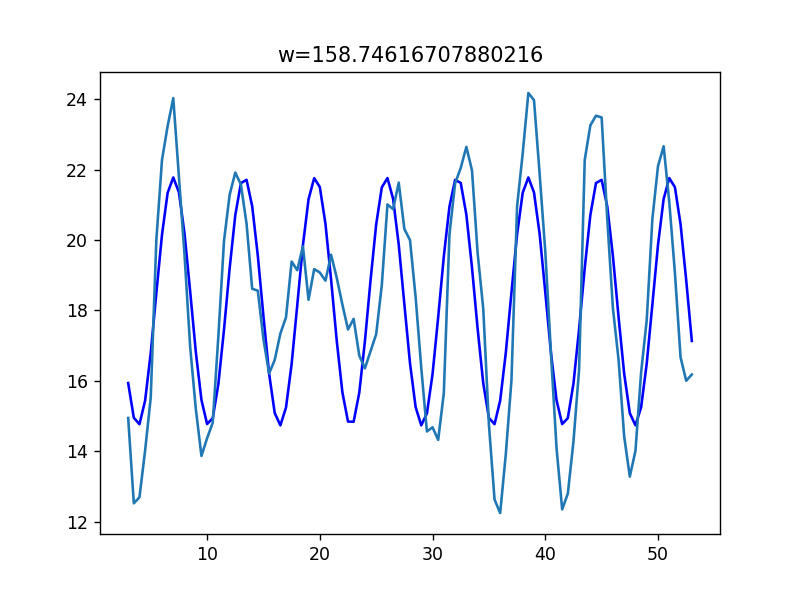

Text(0.5, 1.0, 'w=158.74616707880216')

In [524]:
x, y = value[1][0], np.abs(value[1][1])
A, C, W, phi = op.Cos_Fit().fitCos(x,y)
y1 = A*np.cos(2*np.pi*W*x+phi)
plt.figure()
plt.plot(x,y1+C,'b-')
plt.plot(x,y)
plt.title(f'w={W*1e3}MHz')

In [523]:
W

0.1587462809771947

In [318]:
value[0]

(array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08]),
 array([0.6662234 , 0.67054521, 0.68151596, 0.69514628, 0.70611702,
        0.72074468, 0.73271277, 0.7400266 , 0.7450133 ]))

In [319]:
data, ID, comment, tags, name, finishtime = read(title='singleVrabi',which=0)
print(finishtime)

2020-11-07 17:02:36.581156


In [2415]:
(4.419-4.314)*2

0.20999999999999908

<IPython.core.display.Javascript object>


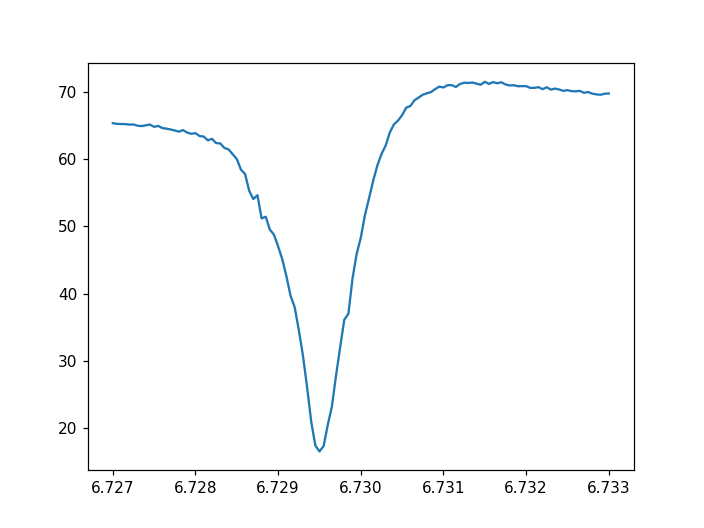

In [703]:
plt.figure()
plt.plot(value[0][1],np.abs(value[0][2][7]))
plt.show()

<IPython.core.display.Javascript object>


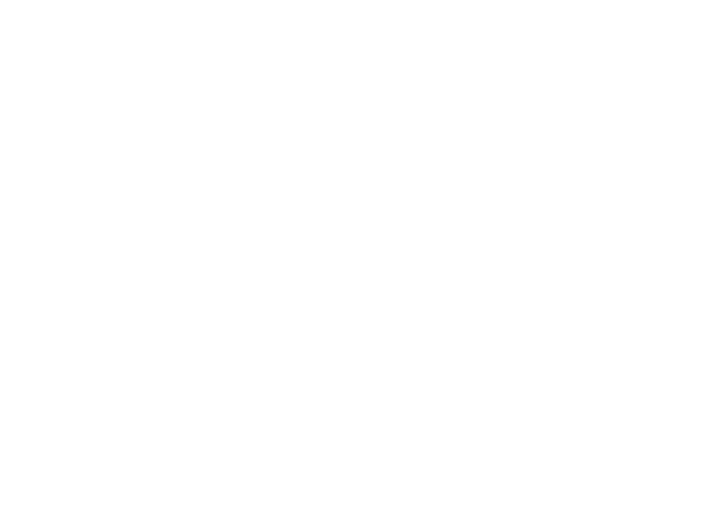

In [113]:
x,y,z = value[0][0], value[0][1], np.abs(value[0][2])
plt.figure()
plt.pcolor(z)

<IPython.core.display.Javascript object>


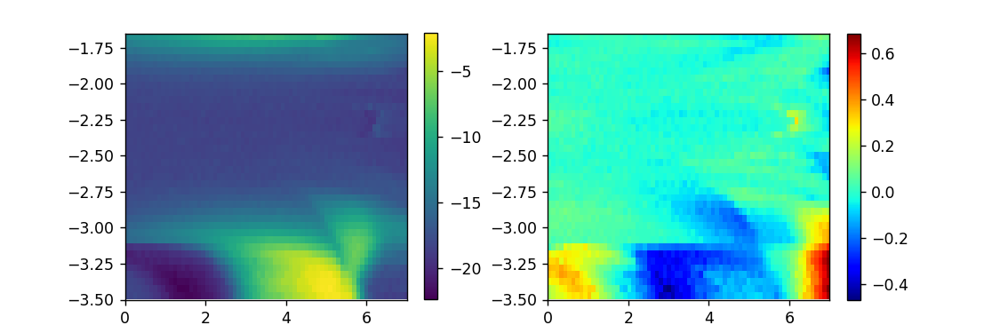

['bluefors_jpa_xue', 'fcenter=6750000000.0'] 2020-09-30 18:40:26.858460


In [36]:
value,num,tags,finishtime = write(title='BiasvsPump',height=3,which=0,peak=1120,phase='phase',dePhase=True,dB=True)
print(tags,finishtime)

# 拟合谱

In [105]:
data, ID, comment, tags, name, finishtime = read(title='singlespec',which=10)
num = len(data[0].T)
print(finishtime)
f_ss, s_ss = np.array(data)[0,:,:], np.array(data)[1,:,:]
index = np.abs(s_ss).argmax(axis=0)
x,y,z,band= f_ss/1e9, s_ss,[],[]
for i in range(np.shape(s_ss)[1]):

    res, e = op.Lorentz_Fit().fitLorentz(x[:,i],np.abs(y[:,i]))
    a,b,c,d = res.x
    z.append(a/(1.0+c*(x[:,i]-b)**2)+d)
    band.append((b,e))
z = np.array(z).T
f_rabi = np.array([x[:,i][j] for i, j in enumerate(index)])
n = num // 2 + num % 2
fig, axes = plt.subplots(ncols=2,nrows=n,figsize=(9,2*n))
fig.subplots_adjust(top=0.85,bottom=0.15,hspace=0.5)
for i in range(num): 
    if n != 1:
        axes[i//2][i%2].plot(x[:,i],np.abs(y[:,i]),'-o',markersize=2)
        axes[i//2][i%2].plot(x[:,i],z[:,i],alpha=1)
    else:
        axes[i].plot(x[:,i],np.abs(y[:,i]),'-o',markersize=2)
        axes[i].plot(x[:,i],z[:,i],alpha=1)
plt.show()

2020-11-16 09:32:59.449937


ValueError: not enough values to unpack (expected 2, got 1)

<IPython.core.display.Javascript object>


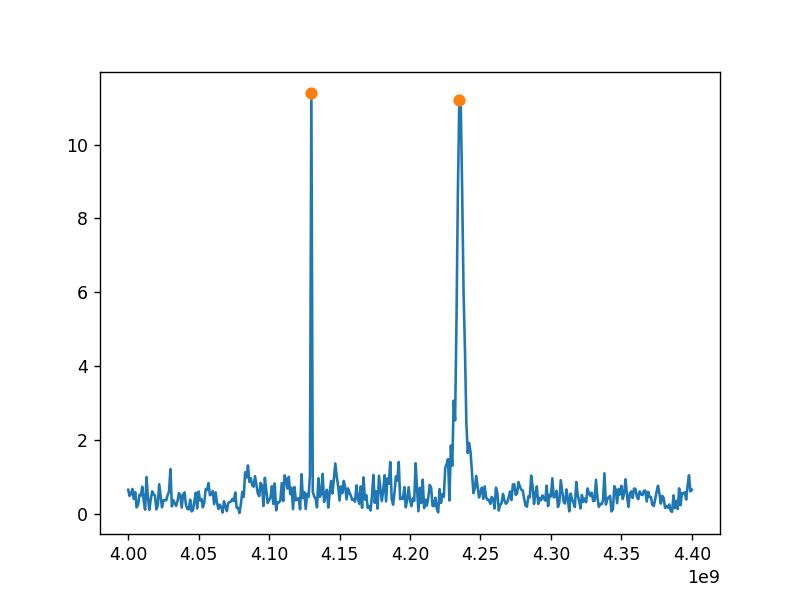

In [101]:
data, ID, comment, tags, name, finishtime = read(title='singlespec',which=0)
x, y = data[0][:,0], np.abs(data[1][:,0])
index, prominences, widths = op.RowToRipe().findPeaks(y)
plt.figure()
plt.plot(x,np.abs(y))
plt.plot(x[index],y[index],'o')

In [85]:
index = scipy.signal.argrelmax(y,order=10)
x[index]

array([4.013e+09, 4.030e+09, 4.057e+09, 4.085e+09, 4.111e+09, 4.130e+09,
       4.147e+09, 4.174e+09, 4.192e+09, 4.204e+09, 4.235e+09, 4.286e+09,
       4.301e+09, 4.318e+09, 4.338e+09, 4.353e+09, 4.376e+09, 4.398e+09])

In [100]:
res.x

array([ 1.15350494e+01,  4.23559053e+00,  2.13419643e+05,  4.94112431e-01,
        1.62760663e+08,  1.67731089e+07, -6.40473390e+06])

In [92]:
np.shape(y)

(401, 1)

# 拟合Q值

In [882]:
data, ID, comment, tags, name, finishtime = read(title='S21',which=1698)
print(finishtime,tags)

2020-09-13 09:36:39.788534 ['jpa']


<IPython.core.display.Javascript object>


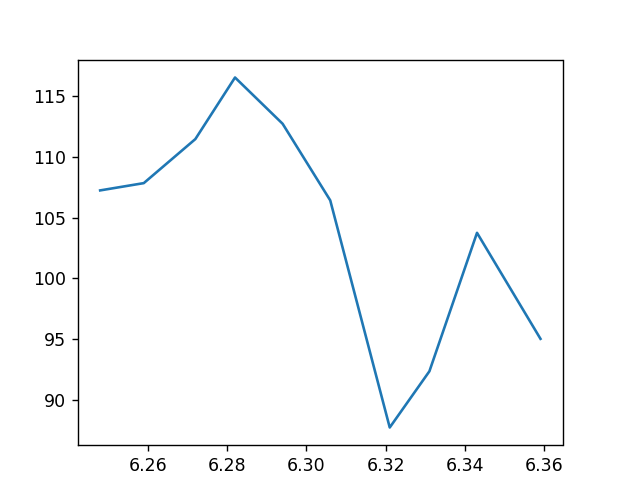

In [884]:
f, s21 = data[0][:,0]/1e9, data[1][:,0]
# f0, Qi, Qe, QL, phi, f, s = op.Cavity_fit().fitCavity(f,s21)
plt.figure(figsize=(5,4))
plt.plot(f,np.abs(s21))
# plt.title(f'Low Power_ATS_q1, Qi={int(Qi)},Qe={int(Qe)},QL={int(QL)}')
# plt.plot(f,1/np.abs(op.Cavity_fit().invS21(f, f0, Qi, Qe, phi)))
plt.show()

In [ ]:
from qulab import getplotlydat
gpd = imp.reload(getplotlydat)
path = r'D:\step1\14Q1changePwr.html'
x, y, z = gpd.gethtmldata(path,flag='x'), gpd.gethtmldata(path,flag='y'), gpd.gethtmldata(path,flag='z')


In [818]:
data = np.load(r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang\2020\0824\S21\q6_20200824171301.npz')

In [820]:
f, s21 = data['ffrr'], data['dataGhz']
# f0, Qi, Qe, QL, phi, f, s = op.Cavity_fit().fitCavity(f,s21)
plt.figure(figsize=(5,4))
plt.plot(f,np.abs(s))
plt.title(f'Low Power_wangzhan, Qi={int(Qi)},Qe={int(Qe)},QL={int(QL)}')
# plt.plot(f,1/np.abs(op.Cavity_fit().invS21(f, f0, Qi, Qe, phi)))
plt.show()

KeyError: 'ffrr is not a file in the archive'

In [333]:
tag = ''
for i in tags:
    tag += i
save('S21',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=data[0],col=data[1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/S21/q6_20200824171301.npz')

In [43]:
x, y = value[0][0], value[0][1]
fig = plt.gcf()
ax = plt.getp(fig,'axes')
w,yt,amp = op.RowToRipe().fourier(x,np.abs(y))
ax[1].plot(yt[yt!=0],np.abs(amp[yt!=0]))
ax[1].set_title('$W=%.3fMHz$'%(w*1000))
plt.show()

# 移动偏置看谱

<IPython.core.display.Javascript object>


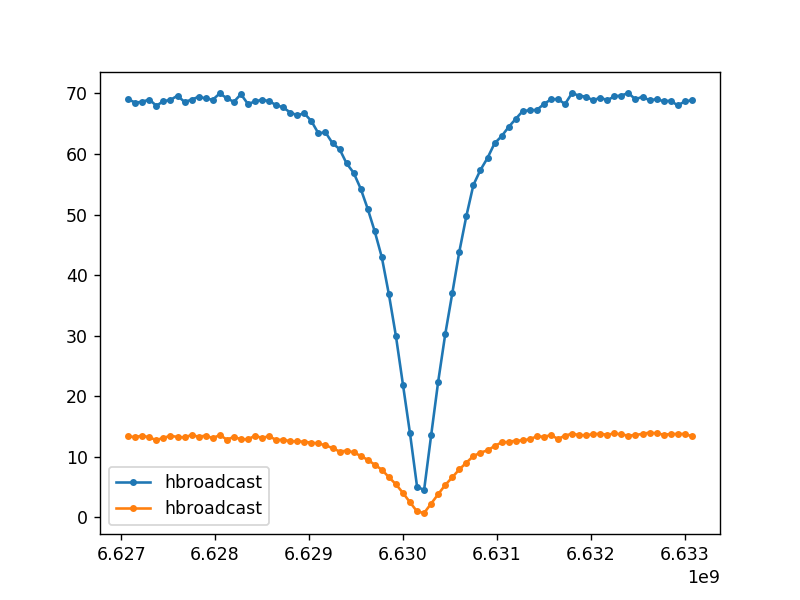

In [205]:
fig = plt.figure(num='specvsbias')

In [179]:
5.189-5.063

0.12600000000000033

In [208]:
data, ID, comment, tags, name, finishtime = read(title='S21',which=0)
print(finishtime)

2020-11-23 21:19:01.461081


In [209]:
plt.figure(num='specvsbias')
plt.plot(data[0],np.abs(data[1]),'-o',markersize=3,label='hbroadcast',alpha=1)
plt.legend(loc='best')
plt.show()

In [60]:
data, ID, comment, tags, name, finishtime = read(title='spec2d',which=5)
print(finishtime)
data[1][:-1]

2020-11-05 15:00:46.936593


array([array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array(

In [78]:
tag = ''
for i in tags:
    tag += i
save('singlespec',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=data[0],col=data[1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0831/singlespec/Nbq6_20200831094455.npz')

# 读出点

In [343]:
data, ID, comment, tags, name, finishtime = read(title='readOp',which=0)
print(tags, finishtime)

['q10'] 2020-11-24 00:29:34.049082


<IPython.core.display.Javascript object>


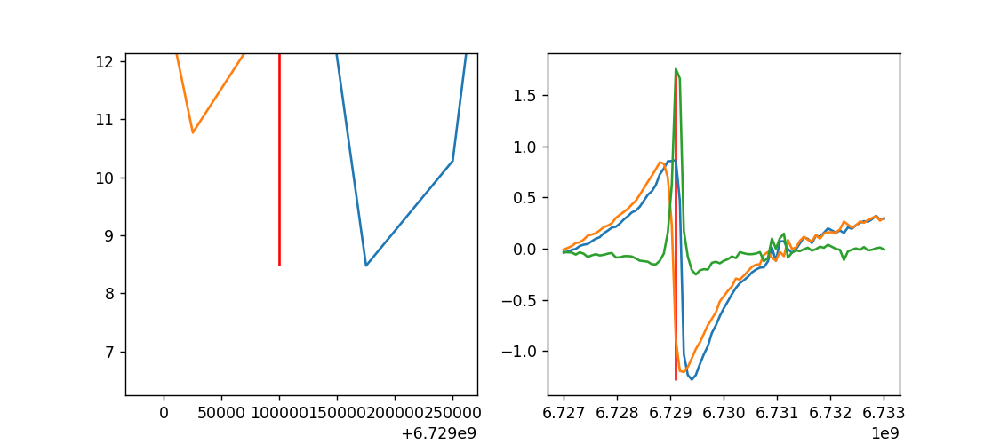

In [344]:
f_lo = []
f_op, s_op = data[1], data[2]
fig, axes = plt.subplots(ncols=2,nrows=1,figsize=(9,4))
for i in range(np.shape(data[1])[2]):
    f, s_off, s_on = f_op[0,:,i], s_op[0,:,i], s_op[1,:,i]
    f_lo1 = (f[np.argmin(np.abs(s_off))] + f[np.argmin(np.abs(s_on))])/2
    x_off, y_off = op.RowToRipe().deductPhase(f,s_off)
    x_on, y_on = op.RowToRipe().deductPhase(f,s_on)
    anglediff = (np.angle(y_off[0])-np.angle(y_on[0]))
    index = np.abs(anglediff).argmax(axis=0)
    #index = np.abs(s_off).argmin(axis=0)
    f_lo.append(f[index] if np.abs(f[index]-f_lo1)<0.1e6 else f_lo1)
    axes[0].plot(f_op[:,:,i].T,np.abs(s_op[:,:,i].T))
    axes[0].vlines(f_lo,np.max(np.abs(s_op[:,:,i].T)),np.min(np.abs(s_op[:,:,i].T)),'r')
    axes[1].plot(x_off,np.angle(y_off[0]))
    axes[1].plot(x_on,np.angle(y_on[0]))
    axes[1].plot(x_off,anglediff)
    axes[1].vlines(f_lo,np.max(anglediff),np.min(np.angle(y_off[0])),'r')
plt.show()

In [335]:
np.sqrt(1.16/2*1.7669*1e-3)

0.03720514852709336

In [346]:
6.7292-4.734

1.9951999999999996

In [351]:
delta = 1998
k = 0.9/2
kappa = 228
np.sqrt(k*delta*(1+delta/kappa))

93.69127634501461

In [368]:
tag = ''
for i in tags:
    tag += i
save('readOp',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=data[1],col=data[1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/readOp/q6_20200824172750.npz')

# OPTweight

In [408]:
data, ID, comment, tags, name, finishtime = read(title='readOpweight',which=0)
np.shape(data)

(1, 2, 1088)

<IPython.core.display.Javascript object>


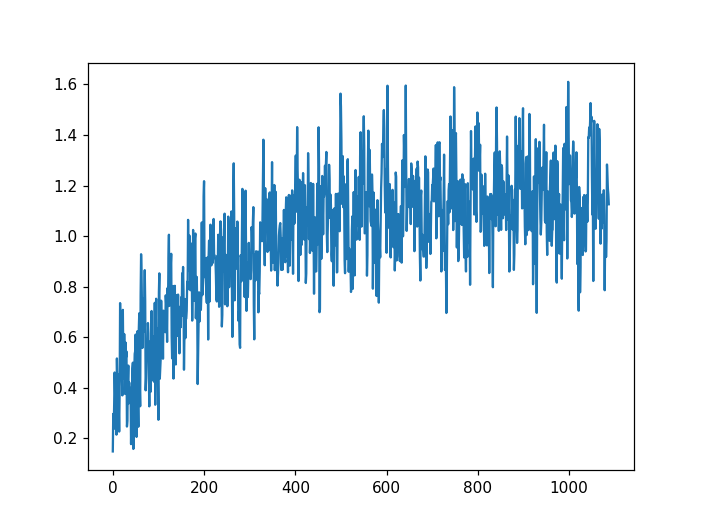

In [369]:
amp_off, amp_on = data[0][0,:], data[0][1,:]
ampdiff = np.abs(amp_on-amp_off)
weight = ampdiff/np.mean(ampdiff)
plt.figure()
# plt.plot(np.abs(amp_off))
# plt.plot(np.abs(amp_on))
# plt.plot(ampdiff)
plt.plot(weight)

In [370]:
weight

array([0.14818184, 0.29686572, 0.23693768, ..., 1.18676457, 1.16506066,
       1.1258274 ])

# AC-Stark

<IPython.core.display.Javascript object>


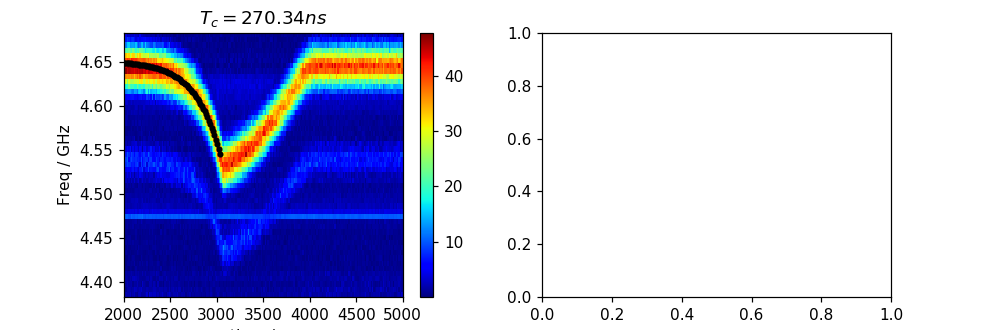

['q1'] 2020-10-09 21:28:18.750503


In [828]:
value,num,tags,finished_time = write(title='acStark',height=3,which=0,peak=1000)
print(tags,finished_time)

<IPython.core.display.Javascript object>


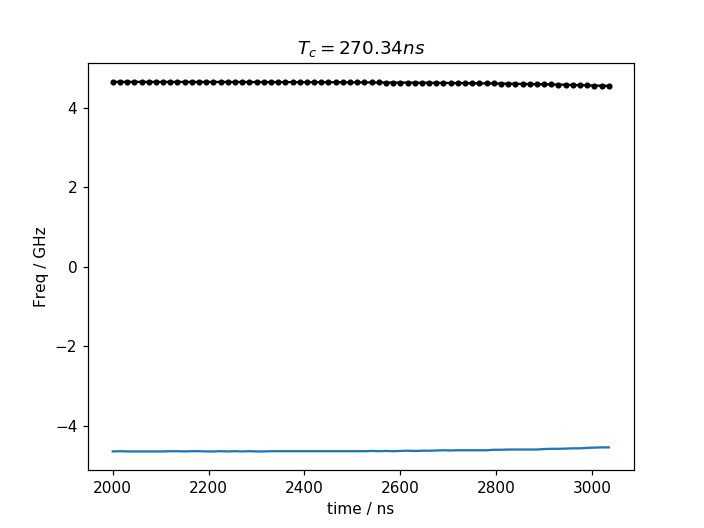

In [829]:
v, f, s = value[0][0], value[0][1], np.abs(value[0][2])
peak = (np.max(s) + np.min(s)) / 2
v, f = op.RowToRipe().profile(v,f,s,peak,axis=0)
plt.figure()
plt.plot(f[:70],-v[:70])

In [831]:
x, y = f[:70],-v[:70]
A, B, T1 = op.Exp_Fit().fitExp(x,y)
z = A * np.exp(-x*T1) + B
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,-z,'k-o',markersize=3)
ax[0].set_title('$T_{c}=%.2fns$'%(abs(1/T1)))
ax[0].set_xlabel('time / ns')
ax[0].set_ylabel('Freq / GHz')
plt.show()

# 腔内光子数

<IPython.core.display.Javascript object>


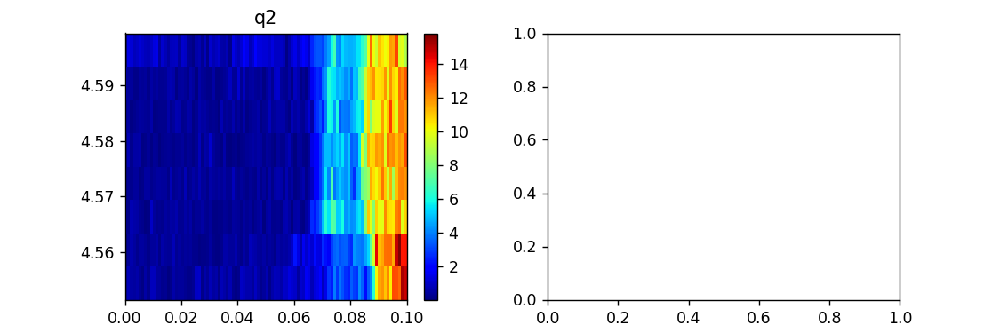

['q2'] 2020-10-27 22:55:26.616300


In [576]:
value,num,tags,finished_time = write(title='photonNum',height=3,which=0,peak=1000)
print(tags,finished_time)

<IPython.core.display.Javascript object>


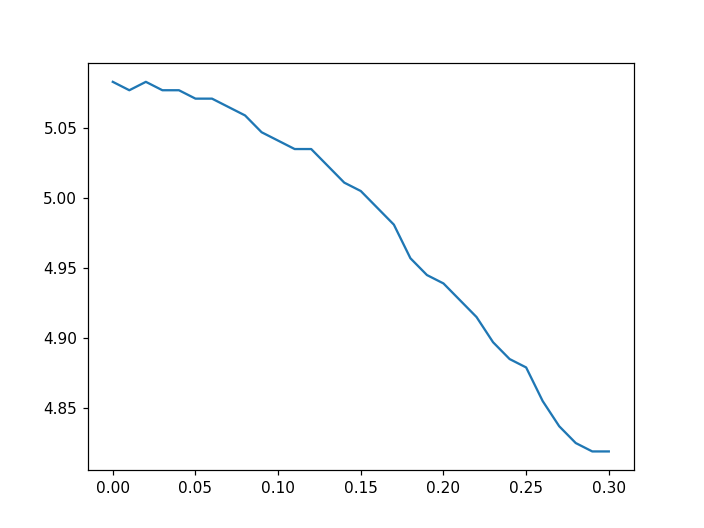

In [833]:
v, f, s = value[0][0], value[0][1][:40], np.abs(value[0][2])[:,:40]
peak = (np.max(s) + np.min(s)) / 2
v, f = op.RowToRipe().profile(v,f,s,peak,axis=0)
plt.figure()
plt.plot(f,v)

In [834]:
x, y = f,v
res, func = op.Exp_Fit().poly(x,y,2)
z = func(x)
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,z,'k-o',markersize=3)
# ax[0].set_title('$T_{c}=%.2fns$'%(abs(1/T1)))
ax[0].set_xlabel('time / ns')
ax[0].set_ylabel('Freq / GHz')
plt.show()

In [837]:
x = sy.Symbol('x',real=True)
k = 0.2 ###MHz
photonnum_func = res[0]*x**2/k/(-2)
photonnum_func

6.21144706239264*x**2

In [836]:
res

array([-2.48457882, -0.227207  ,  5.08864457])

In [779]:
np.float(photonnum_func.evalf(subs={x:0.3}))

0.5590302356153374

In [128]:
import inspect, logging
LOG_FORMAT = "%(asctime)s - %(levelname)s - %(message)s"
logging.basicConfig(filename='D:\skzhao\log\qubit.log', level=logging.DEBUG, format=LOG_FORMAT,filemode='a')
def test():
    print(1)
    logging.info("This is a info log.")
test()
# logging.basicConfig(level=logging.DEBUG)

# logging.debug("This is a debug log.")
# logging.info("This is a info log.")
# logging.warning("This is a warning log.")
# logging.error("This is a error log.")
# logging.critical("This is a critical log.")

1


W1116 23:25:17.484698  9928 <ipython-input-128-f99e1a096955>:6] This is a info log.


In [384]:
import logging
from logging import handlers

class Logger(object):
    level_relations = {
        'debug':logging.DEBUG,
        'info':logging.INFO,
        'warning':logging.WARNING,
        'error':logging.ERROR,
        'crit':logging.CRITICAL
    }     #日志关系映射

    def __init__(self,filename,level='info',backCount=10,fmt='%(asctime)s - %(pathname)s[line:%(lineno)d] - %(levelname)s: %(message)s'):
        self.logger = logging.getLogger(filename)
#         self.logger.propagate = False
        format_str = logging.Formatter(fmt)                  #设置日志格式
        self.logger.setLevel(self.level_relations.get(level))#设置日志级别
        
#         sh = logging.StreamHandler()  #往屏幕上输出
#         sh.setFormatter(format_str)   #设置屏幕上显示的格式
#         self.logger.addHandler(sh)    #把对象加到logger里
        
        fh = handlers.RotatingFileHandler(filename=filename,maxBytes=10485760,backupCount=backCount)   # 按照文件大小分割日志文件
        fh.setLevel(self.level_relations.get(level))
        fh.setFormatter(format_str)   #设置文件里写入的格式
        self.logger.addHandler(fh)
        
if __name__ == '__main__':
    log = Logger(r'D:\skzhao\log\qubit.log',level='debug')
    log.logger.debug('------0. it is a debug ------')
    log.logger.info('------ 1. it is a test ------')
    log.logger.warning('------ 2. it is a warning ------')
    log.logger.error('------ 3. it is an error ------')
    log.logger.critical('------ 4. serious problem ------')

2020-11-17 20:18:43,977 - <ipython-input-384-6c418ba4c7ab>[line:30] - DEBUG: ------0. it is a debug ------
2020-11-17 20:18:43,977 - <ipython-input-384-6c418ba4c7ab>[line:30] - DEBUG: ------0. it is a debug ------
2020-11-17 20:18:43,981 - <ipython-input-384-6c418ba4c7ab>[line:31] - INFO: ------ 1. it is a test ------
2020-11-17 20:18:43,981 - <ipython-input-384-6c418ba4c7ab>[line:31] - INFO: ------ 1. it is a test ------
2020-11-17 20:18:43,983 - <ipython-input-384-6c418ba4c7ab>[line:32] - WARNING: ------ 2. it is a warning ------
2020-11-17 20:18:43,983 - <ipython-input-384-6c418ba4c7ab>[line:32] - WARNING: ------ 2. it is a warning ------
2020-11-17 20:18:43,985 - <ipython-input-384-6c418ba4c7ab>[line:33] - ERROR: ------ 3. it is an error ------
2020-11-17 20:18:43,985 - <ipython-input-384-6c418ba4c7ab>[line:33] - ERROR: ------ 3. it is an error ------
2020-11-17 20:18:43,988 - <ipython-input-384-6c418ba4c7ab>[line:34] - CRITICAL: ------ 4. serious problem ------
2020-11-17 20:18:43

In [157]:
help(signal.butter)

Help on function butter in module scipy.signal.filter_design:

butter(N, Wn, btype='low', analog=False, output='ba', fs=None)
    Butterworth digital and analog filter design.
    
    Design an Nth-order digital or analog Butterworth filter and return
    the filter coefficients.
    
    Parameters
    ----------
    N : int
        The order of the filter.
    Wn : array_like
        The critical frequency or frequencies. For lowpass and highpass
        filters, Wn is a scalar; for bandpass and bandstop filters,
        Wn is a length-2 sequence.
    
        For a Butterworth filter, this is the point at which the gain
        drops to 1/sqrt(2) that of the passband (the "-3 dB point").
    
        For digital filters, `Wn` are in the same units as `fs`.  By default,
        `fs` is 2 half-cycles/sample, so these are normalized from 0 to 1,
        where 1 is the Nyquist frequency. (`Wn` is thus in
        half-cycles / sample.)
    
        For analog filters, `Wn` is an angular

# Zpulse_offset

<IPython.core.display.Javascript object>


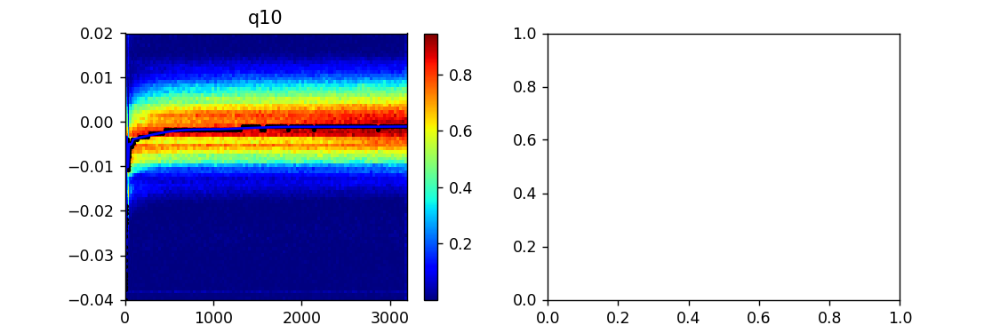

['q10', '0.4'] 2020-11-24 18:46:43.798223


In [383]:
value,num,tags,finished_time = write(title='zPulse_pop',height=3,which=0,peak=1000)
print(tags,finished_time)

In [54]:
def maximum(x, y, w=0.01):
    n = len(x)
    dx = (x[-1] - x[0]) / (n-1)
    f = np.exp(-np.linspace(-n*dx/w, n*dx/w, 2*n-1)**2)
    smooth = np.real(np.convolve(y, f, 'valid')) / np.real(np.convolve(1-np.isnan(y), f, 'valid'))
    #plt.plot(smooth)
    i = np.argmax(smooth)
    if i > 0 and i < n-1:
        yl, yc, yr = smooth[i-1:i+2]
        d = 2.0 * yc - yl - yr
        if d <= 0:
            return 0
        d = 0.5 * (yr - yl) / d
        d = np.clip(d, -1, 1)
    else:
        d = 0
        print('warning: no maximum found')
    return (1-abs(d))*x[i] + d*(d>0)*x[i+1] - d*(d<0)*x[i-1]

In [413]:
resmax = []
for i in range(len(value[0][1][:-13])):
    m = maximum(value[0][0],value[0][2][:,i],0.05)
    resmax.append(m)

IndexError: index 61 is out of bounds for axis 0 with size 61

In [555]:
# x, y  = np.append(value[0][0],x1), np.append(resmax-np.max(resmax),y1)
# x,y

<IPython.core.display.Javascript object>


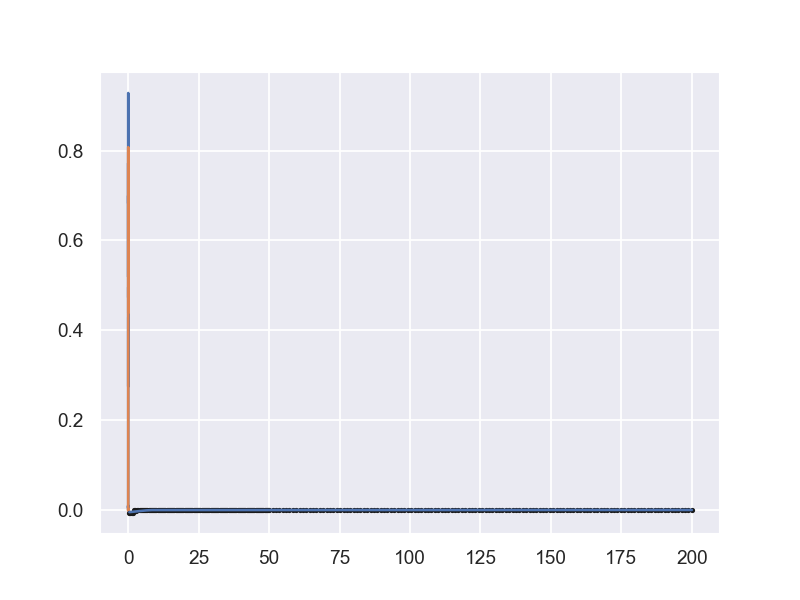

In [1107]:
plt.figure()
plt.plot(value[0][0],np.abs(value[0][2][:,80]))
plt.plot(value[0][0],op.RowToRipe().smooth(np.abs(value[0][2][:,100]),f0=0.1))

In [384]:
x, y, s = value[0][0][:],value[0][1][:-5], np.abs(value[0][2])[0:,:-5]
peak = 0.4
# tstart = 4995 - np.max(x)
# v = v[np.abs(s).max(axis=1)>peak]
# s = s[np.abs(s).max(axis=1)>peak]
# f = f[np.abs(s).argmax(axis=1)]
col, row = np.shape(s)
sm = []
for i in range(row):
    smm = op.RowToRipe().smooth(np.abs(value[0][2][:,i]),f0=0.1)
    sm.append(smm)
axis0, axis1 = np.where(s>peak)

In [50]:
# y

In [385]:
s = np.array(sm).T
index = s>peak
res = []
for i in range(row): 
    sm = x[index[:,i]]
    res.append(np.mean(sm))
# x = x[np.abs(s).max(axis=0)>peak]
# s = s[np.abs(s).max(axis=0)>peak]
# y = y[np.abs(s).argmax(axis=0)]
# x = x[np.abs(s).max(axis=0)>peak]
res = x[np.abs(s).argmax(axis=0)]
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(y,np.array(res),'ko',markersize=2)
ybar = op.RowToRipe().smooth(res,f0=0.05)
ax[0].plot(y,ybar,'b')

<IPython.core.display.Javascript object>


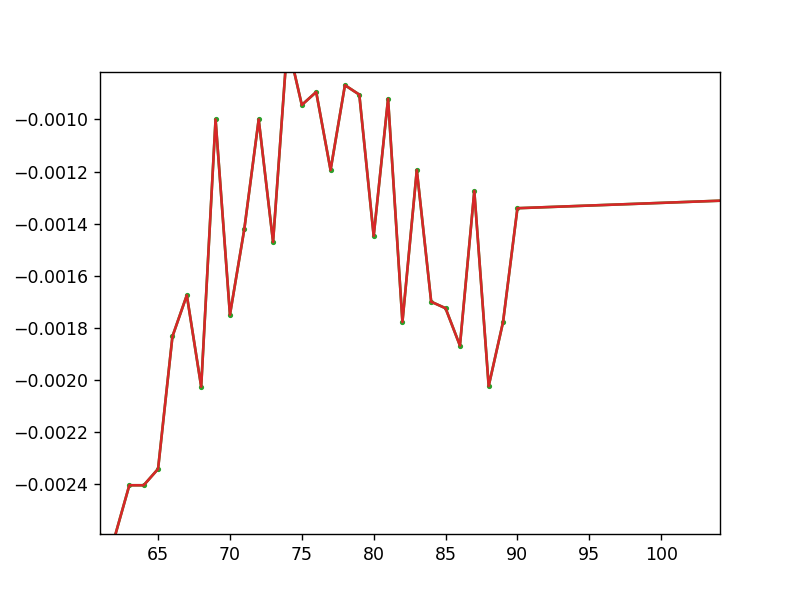

In [544]:
fig = plt.figure('shape')

In [601]:
import scipy

x_new, y_new =y[::-1], np.array(res)[::-1][:]
tstart = np.min(x_new)
xbar = x_new
ybar = y_new
fig = plt.figure('shape')
# x = x[:-95]
# x_new, y_new =abs(x-x.max())[::-1], np.array(res)[:-95][::-1]
# # plt.plot(x_new,y_new,'o')
# # plt.plot(x_new[:-1],np.diff(y_new),'ro')
# ybar = op.RowToRipe().smooth(y_new,f0=0.3)
# ybar = scipy.interpolate.interp1d(x_new,y_new,3)
# xbar = np.linspace(min(x_new),max(x_new),1001)
# xbar = x_new
# ybar = y_new
print(tstart)
# plt.figure()
# xbar, ybar = op.RowToRipe().resample(xbar,ybar,int((max(xbar)-min(xbar))/0.4+1))
plt.plot(x_new, y_new,'-o',markersize=2)
plt.plot(xbar,ybar)
plt.grid()

0.0


<IPython.core.display.Javascript object>


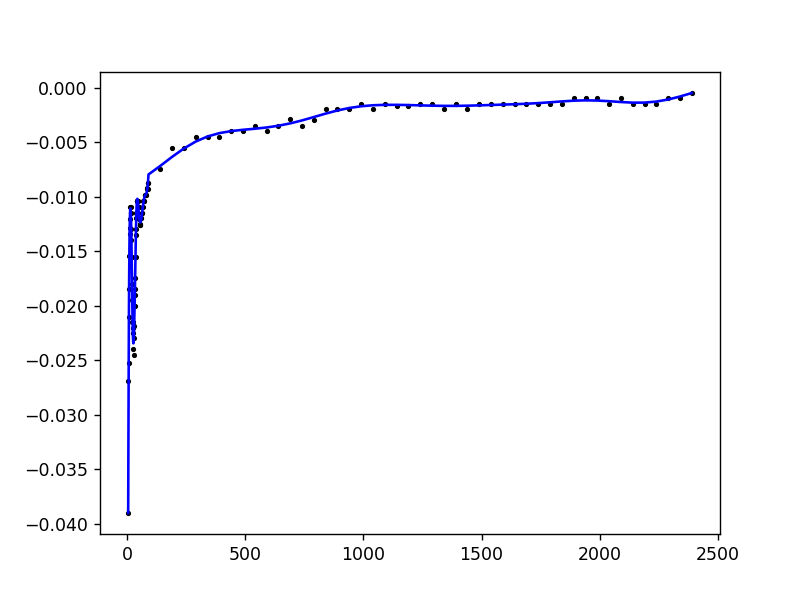

-0.04


ValueError: x and y must have same first dimension, but have shapes (52,) and (86,)

In [337]:
import scipy
x = value[0][0][:-9]
# x = value[0][0][1:]
x_new, y_new =x[::-1], np.array(resmax)[::-1][:]
tstart = np.min(x_new)
xbar = x_new
ybar = y_new
fig = plt.figure('shape')
# x = x[:-95]
# x_new, y_new =abs(x-x.max())[::-1], np.array(res)[:-95][::-1]
# # plt.plot(x_new,y_new,'o')
# # plt.plot(x_new[:-1],np.diff(y_new),'ro')
# ybar = op.RowToRipe().smooth(y_new,f0=0.3)
# ybar = scipy.interpolate.interp1d(x_new,y_new,3)
# xbar = np.linspace(min(x_new),max(x_new),1001)
# xbar = x_new
# ybar = y_new
print(tstart)
# plt.figure()
# xbar, ybar = op.RowToRipe().resample(xbar,ybar,int((max(xbar)-min(xbar))/0.4+1))
plt.plot(x_new, y_new,'-o',markersize=2)
plt.plot(xbar,ybar)
plt.grid()

In [1230]:
tt0 = xbar
allkk = ybar
import scipy.signal
timeconstants=15
xx=tt0
yy=np.array(allkk)
def fitfunc(t, p):
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))
def errfunc(p):
    return (fitfunc(xx, p) - yy)
def errfunc1(p,xx,yy):
    return np.sum((fitfunc(xx, p) - yy)**2)
p0 = np.zeros(2*timeconstants+1)
p0[1::2] = np.linspace(0, 0.5, timeconstants)
p0[2::2] = np.linspace(0, 0.01, timeconstants)
# pbh = bh(errfunc1,p0,niter=30,minimizer_kwargs={"method":"Nelder-Mead","args":(xx, yy)}) 
p, _ = scipy.optimize.leastsq(errfunc, p0, maxfev=50000)
x_ = np.linspace(-max(tt0),5*max(tt0),5001)
plt.plot(x_,fitfunc(x_,p),'k-')

In [960]:
fitfunc(x_,p)

array([-0.        , -0.        , -0.        , ...,  0.00068239,
        0.00068239,  0.00068239])

In [1085]:
p[1::2] /= (-0.8)

In [1095]:
q1.zCali = p

In [1174]:
1/p[2::2]

array([75.56475097, 17.60907731, 36.99582218, 55.36739824, 75.49863486,
       75.62430095, 75.28084994, 75.5700784 , 93.65857083, 55.36227888,
       55.3702971 , 36.99478764, 25.46820936, 25.46917696, 13.98124118])

In [901]:
q5.zCali = np.array([ 9.03908719e-05, -1.02857805e-01,  5.52098056e-03,  2.59190503e-01,
        8.61210749e-03,  2.91745212e-01,  8.53948822e-03,  2.54898578e+00,
        2.03637695e-02,  2.03003474e+00,  4.49603071e-02, -8.53328459e-01,
        3.17506121e-02, -8.73745547e-01,  3.17496401e-02, -1.23578909e+00,
        1.23348587e-02, -8.51046195e-01,  3.17482586e-02, -1.10902505e+00,
        3.17483284e-02,  2.97454688e+00,  8.21846946e-02,  2.34202377e+00,
        4.49569780e-02, -6.76275066e+00,  6.50323403e-02, -1.86010020e+00,
        3.17480379e-02,  3.20851278e+00,  4.49588674e-02])

## 验证画图

<IPython.core.display.Javascript object>


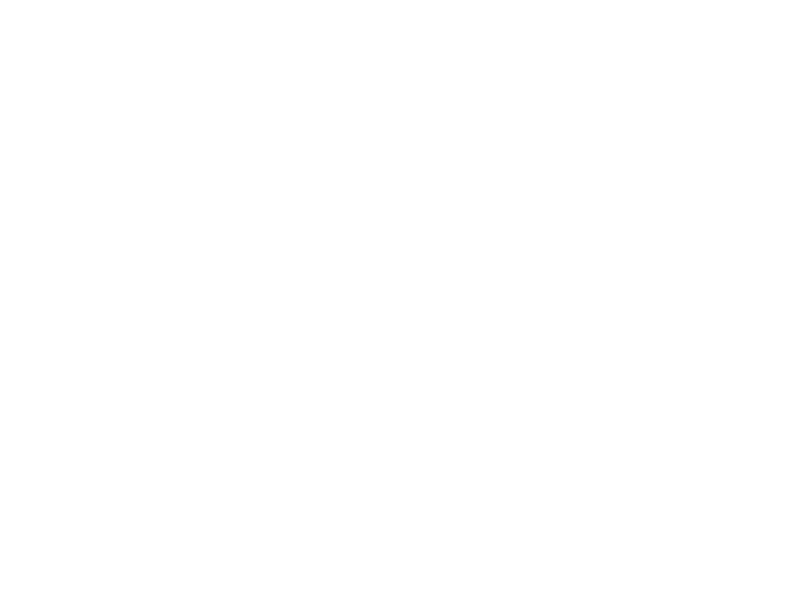

In [1175]:
def fitfunc(t, p):
    #p[2::2] = p[2::2] 
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))

def caliZ(waveform,paras):
    
    paras[0] = 0
    x = np.arange(250000)*0.4
    response = fitfunc(x,paras)
    f_cali = 1/(1+1j*np.pi*np.fft.fftfreq(len(x),0.4)*np.fft.fft(response))
    f_step = np.fft.fft(waveform)
    signal = np.real(np.fft.ifft(f_step*f_cali))
    return signal
wave = wn.square(2000e-9,0e-9) << 1000e-9
# pulse_overshot = ((wn.square(0.8e-9) << (0 + 2000e-9 - 0.4e-9))-(wn.square(0.8e-9) << (0.4e-9 + 0)))
# wave += pulse_overshot
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.8
signal1 = caliZ(wave,p)
plt.figure()
plt.plot(t,signal1,'-o',markersize=1)

In [902]:
def caliZ(p,height):
    x = xbar
    samplerate = (max(x)-min(x))/(len(x)-1)
    response = fitfunc(x,p)/(-0.8)
    c = 1-1j*np.pi*np.fft.fftfreq(len(x),samplerate)*np.fft.fft(response)
    return c

wave = ybar
c = caliZ(p,1)
f_step = np.fft.fft(wave)
signal = np.real(np.fft.ifft(f_step/c))
plt.plot(xbar,signal,'r-')

<IPython.core.display.Javascript object>


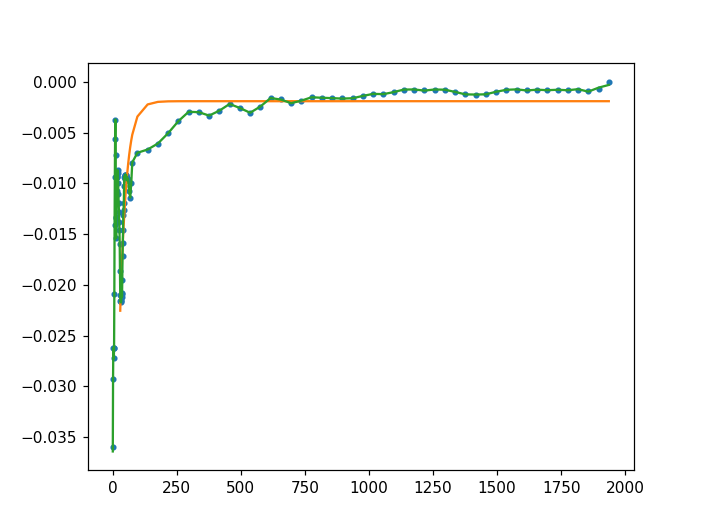

In [870]:
t = np.linspace(0,2000,len(x_new))
def func(t,paras):
    a, b, tau = paras
    return a + b*np.exp(-t/tau)
def err(paras,t,y):
    return y - func(t,paras)
def caliZ(p,height):
    x = t
    response = func(x,p)/(-0.8)
    c = 1-1j*np.pi*np.fft.fftfreq(len(x),1)*np.fft.fft(response)
    return c

x, y = x_new[-80:], signal[-80:]
p0 = [np.mean(y),-(np.max(y)-np.min(y)),20]
p, _ = scipy.optimize.leastsq(err, p0,args=(x,y), maxfev=500000)

wave = ybar
c = caliZ(p0,1)
f_step = np.fft.fft(wave)
signal = np.real(np.fft.ifft(f_step/c))
# signal = np.fft.ifft(np.fft.fft(signal1)/c)
plt.figure()
plt.plot(x_new,wave,'.')
plt.plot(x,func(x,p))
plt.plot(x_new,signal)

In [876]:
# DATA=np.load(r'E:\数据\C楼装样20201005\test3\110227Q1_plusecorr0.85V.npz')
# tt0=DATA['tt0']
# allkk=DATA['allkk']
tt0 = x_new
allkk = y_new
import scipy.signal
timeconstants=10
xx=tt0
yy=np.array(allkk)
def fitfunc(t, p):
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))
def errfunc(p):
    return (fitfunc(xx, p) - yy)*(1.0+0.5*scipy.special.erf(0.4*(xx)))**5
p0 = np.zeros(2*timeconstants+1)
p0[1::2] = np.linspace(0, 1, timeconstants)
p0[2::2] = np.linspace(0, 0.1, timeconstants)
p, _ = scipy.optimize.leastsq(errfunc, p0, maxfev=500000)
x_ = np.linspace(-max(tt0),2*max(tt0),5001)
plt.plot(x_,fitfunc(x_,p),'k-')

In [881]:
p

array([-2.58592000e+00,  2.58155083e+00, -9.36583173e-07, -1.94297409e+01,
        6.82429982e-02,  1.87809040e+01,  6.30331683e-02, -4.82784988e+01,
        6.82434628e-02,  1.29041701e+01,  7.41382518e-02,  1.69530451e+01,
        7.41382649e-02,  2.13326247e+01,  7.41392685e-02,  2.34755055e+01,
        7.41385965e-02,  2.49935813e+01,  7.41321134e-02, -5.07806144e+01,
        7.80372459e-02])

In [880]:
tt0 = x_new
import scipy.signal
timeconstants=10
xx=tt0
wave = y_new
c = caliZ(p,1)
f_step = np.fft.fft(wave)
signal = np.real(np.fft.ifft(f_step/c))
yy=np.array(signal)
def fitfunc(t, p):
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))
def errfunc(p):
    return (fitfunc(xx, p) - yy)*(1.0+0.5*scipy.special.erf(0.4*(xx)))**5
def caliZ(p,height):
    x = x_new
    response = fitfunc(x,p)/(-0.8)
    c = 1-1j*np.pi*np.fft.fftfreq(len(x),1)*np.fft.fft(response)    
    return c

# p0 = np.zeros(2*timeconstants+1)
# p0[1::2] = np.linspace(0, 1, timeconstants)
# p0[2::2] = np.linspace(0, 0.1, timeconstants)
# p, _ = scipy.optimize.leastsq(errfunc, p0, maxfev=500000)

# wave = ybar
# c = caliZ(p0,1)
# f_step = np.fft.fft(wave)
# signal = np.real(np.fft.ifft(f_step/c))
# # signal = np.fft.ifft(np.fft.fft(signal1)/c)
# plt.figure()
# plt.plot(x_new,wave,'.')
# plt.plot(x,func(x,p))
# plt.plot(x_new,signal)

ValueError: too many values to unpack (expected 3)

In [595]:
# t, r = x_new, scipy.signal.detrend(ybar)
# h = np.diff(r)
# # fftfreq = np.fft.fftshift(np.fft.fftfreq(len(h)))
# H = np.fft.rfft(h)
# plt.figure()
# plt.plot(np.real(H))
# plt.plot(np.imag(H))
# plt.plot(np.abs(H))

In [431]:
def fitfunc(x,p):
    return (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*x[None,:]), axis=0))
paras = op.TwoExp_Fit(percent=1).fitTwoexp(x_new,ybar,num=10)
z = fitfunc(x_new,paras)
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x_new,z)
plt.show()

[-1.79987776e-02  1.79993667e-02 -3.87200000e+03  1.79993667e-02
 -3.87200000e+03  1.79993667e-02 -3.87200000e+03  1.79993667e-02
 -3.87200000e+03  1.79993667e-02 -3.87200000e+03  1.79993667e-02
 -3.87200000e+03  1.79993667e-02 -3.87200000e+03  1.79993667e-02
 -3.87200000e+03  1.79993667e-02 -3.87200000e+03  1.79993667e-02
 -3.87200000e+03]


<IPython.core.display.Javascript object>


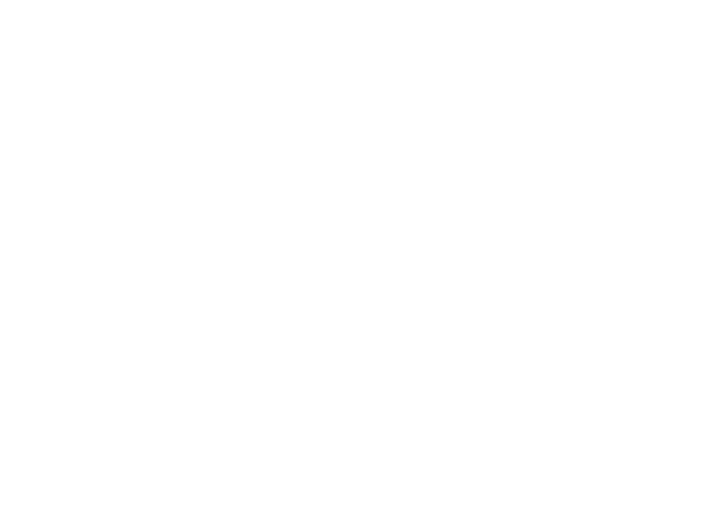

In [1077]:
x = np.linspace(-90,10,250)*1e-9
p = np.array(p)
p[0] = 0
#x_new = np.arange(0,101,((max(x)-min(x))/(len(x)-1)))*1e-3
#x_new = np.linspace(0,100,250)
x_new = np.arange(250)
p[2::2] =p[2::2]
response = fitfunc(x_new,p)/(0.2)*0.2
c = 1-1j*np.pi*np.fft.fftfreq(len(x_new),((max(x_new)-min(x_new))/(len(x_new)-1)))*np.fft.fft(response)
step = wn.square(10e-9) << 5e-9
step = step(x)*0.2
f_step = np.fft.fft(step)
signal = np.fft.ifft(f_step/c)
plt.figure()
plt.plot(x,step)
#plt.plot(x,response/(-0.2))
plt.plot(x,signal)

<IPython.core.display.Javascript object>


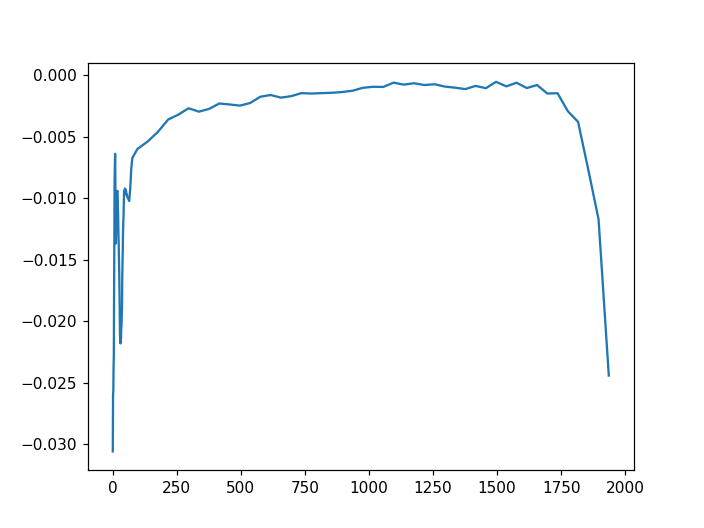

In [857]:
def fitfunc(t, p):
#     p[2::2] = p[2::2] 
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))

def caliZ(p,height):
    
    x = np.arange(len(y_new))
    response = fitfunc(x,p)/(-0.8)
    c = 1-1j*np.pi*np.fft.fftfreq(len(x),1)*np.fft.fft(response)
    
    return c
wave = y_new
t = np.arange(len(y_new))
r = caliZ(p,1)
f_step = np.fft.fft(wave)
signal = np.real(np.fft.ifft(f_step/r))
plt.figure()
plt.plot(x_new,signal)

## 拟合

In [386]:
data = np.array([y[::-1],(ybar[::-1])]).T
data

array([[ 1.20000000e+00, -3.92651039e-02],
       [ 1.60000000e+00, -3.88725177e-02],
       [ 2.00000000e+00, -3.84098408e-02],
       [ 2.40000000e+00, -3.78736478e-02],
       [ 2.80000000e+00, -3.72613650e-02],
       [ 3.20000000e+00, -3.65713178e-02],
       [ 3.60000000e+00, -3.58027726e-02],
       [ 4.00000000e+00, -3.49559738e-02],
       [ 4.40000000e+00, -3.40321770e-02],
       [ 4.80000000e+00, -3.30336726e-02],
       [ 5.20000000e+00, -3.19638010e-02],
       [ 5.60000000e+00, -3.08269506e-02],
       [ 6.00000000e+00, -2.96285355e-02],
       [ 6.40000000e+00, -2.83749474e-02],
       [ 6.80000000e+00, -2.70734833e-02],
       [ 7.20000000e+00, -2.57322515e-02],
       [ 7.60000000e+00, -2.43600618e-02],
       [ 8.00000000e+00, -2.29663051e-02],
       [ 8.40000000e+00, -2.15608258e-02],
       [ 8.80000000e+00, -2.01537905e-02],
       [ 9.20000000e+00, -1.87555463e-02],
       [ 9.60000000e+00, -1.73764619e-02],
       [ 1.00000000e+01, -1.60267449e-02],
       [ 1.

1.2000000000443833 0.4


<IPython.core.display.Javascript object>


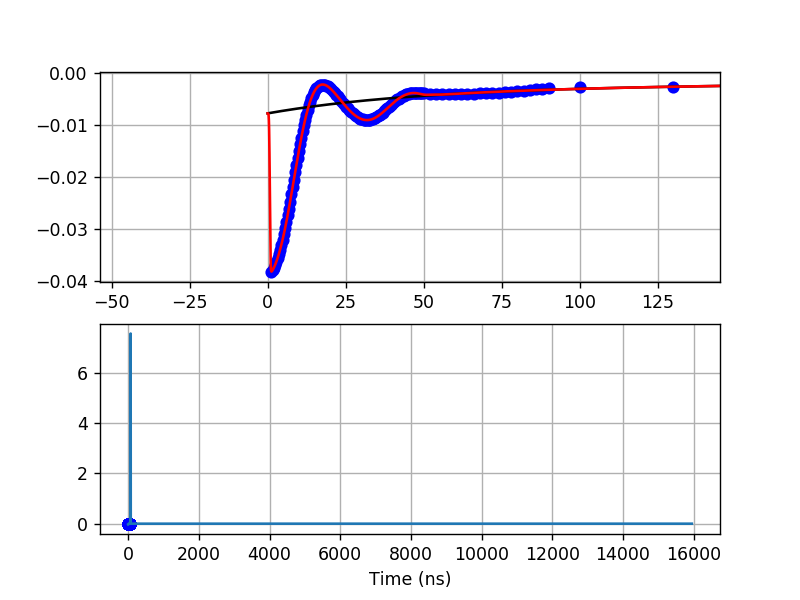

In [387]:
data[:,1] -= data[-1:,1]
updatePara = False
polyNum = 24 #10
timeconstants =2
tCut = 50 #100 ,200
tCut1 = 3
tshift = 0
height = eval(tags[1])

polyRatio = 1
sigma = 0.4
tstart = np.min(data[:,0])
print(tstart,height)
tcuts = [0,10e3]
tcuts1 = None
expNum = 1

def fitfunc(t, p):
    return (t >= 0) *(p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))
def errfunc(p):
    return (fitfunc(data[:,0], p) - data[:,1])*(1.0+0.5*scipy.special.erf(0.4*(data[:,0]-tCut)))**10

p0 = np.zeros(2*timeconstants+1)
p0[1::2] = -np.linspace(0, 0.02, timeconstants)
p0[2::2] = np.linspace(0, 0.5, timeconstants)
# print(p0)
p, _ = scipy.optimize.leastsq(errfunc,p0,maxfev=5000)
ts = np.arange(0,data[-1,0]*5,0.02)
p[0] = 0

plt.plot(data[:,0],data[:,1],'bo')
plt.figure()
plt.subplot(211)
plt.plot(data[:,0],data[:,1],'bo')
plt.plot(ts,fitfunc(ts,p),'k-')

data1 = np.copy(data)
restData = data[:,1]-fitfunc(data[:,0], p)
restData = restData[data1[:,0]<=tCut]
data1 = data1[data1[:,0]<=tCut,:]
def fitfunc1(t, p):
    pExp = p[:expNum*2]
    pPoly = p[expNum*2:]
    if np.iterable(t):
        return np.sum(pExp[0::2,None]*np.exp(-pExp[1::2,None]*t[None,:]), axis=0)*np.polyval(pPoly,t)*(t<=tCut+20)
    else:
        return np.sum(pExp[0::2]*np.exp(-pExp[1::2]*t))*np.polyval(pPoly,t)*(t<=tCut)
def errfunc1(p):
    return (fitfunc1(data1[:,0], p) - restData)*(1.0+0.5*scipy.special.erf(0.4*(data1[:,0]-tCut1)))**0
def smoothFuncATtCut(ts,tCut,tshift):    
    return (0.5-0.5*scipy.special.erf(sigma*(ts-tCut+tshift)))*(0.5+0.5*scipy.special.erf(4.0*(ts-data[0,0]+0.5)))
pExp0 = np.zeros(2*expNum)
pExp0[1::2] = np.linspace(0.001, 0.03, expNum)
pPoly0 = np.zeros(polyNum)
pPoly0[-1] = 1.0
pAll0 = np.hstack([pExp0,pPoly0])
p2, _ = scipy.optimize.leastsq(errfunc1, pAll0)
smoothData = fitfunc1(ts,p2)*smoothFuncATtCut(ts,tCut,tshift)*polyRatio
timeFunData0 = smoothData+fitfunc(ts,p)
paras= {'p':p,'p2':p2,'tCut':tCut,'tshift':tshift,'sigma':sigma}
plt.subplot(212)
plt.plot(data1[:,0],restData,'bo')
# plt.plot(ts,smoothData,'r-')
plt.plot(ts,fitfunc1(ts,p2))
plt.xlabel('Time (ns)')
plt.grid(True)
plt.subplot(211)
plt.plot(ts,timeFunData0,'r-')
plt.grid(True)
p2 = np.asarray(p2)
p = np.asarray(p)
p_uniform = np.copy(p)
p2_uniform = np.copy(p2)
p_uniform[1::2] = p_uniform[1::2]/height
p2_uniform[0] = p2[0]/height*polyRatio
plt.subplot(211)
# plt.plot(ts,timeFunData0,'r-')
# plt.plot(ts,fitfunc(ts,p_uniform*height),'y-')
# plt.plot(ts,fitfunc1(ts,p2_uniform),'r-')
if updatePara==True:  
    len0 = np.int(np.max([len(qubit),len(qubit1)]))
    assert(qubit1[:len0]==qubit[:len0])
    s[qubit]['expAmpRates'] = p_uniform[1:]
    s[qubit]['polyParas'] = p2_uniform
    s[qubit]['delayParas'] = np.array([tCut,tshift,sigma])

In [91]:
tags[1]

'0.8'

0


<IPython.core.display.Javascript object>


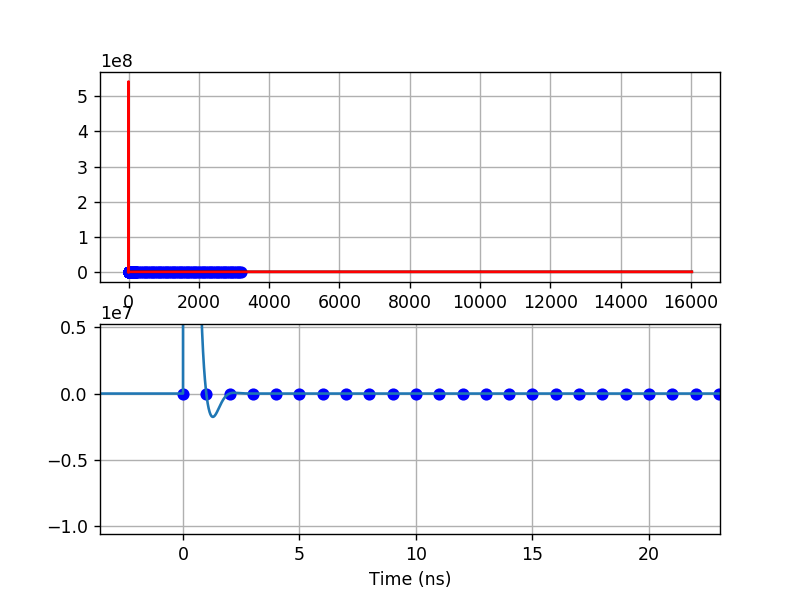

In [202]:
dataset = 82#66#q18:329; q10:332; q13:338; q6:341; q9:370; q14:54; q17:56
updatePara = False
polyNum = 24 #10
timeconstants = 5 #0,2
tCut = 70 #100 ,200
tshift = 0
height = -0.5

polyRatio = 1.0
sigma = 4
tstart = 0
print(tstart)
tcuts = [0,10e3]
tcuts1 = None
expNum = 1

def fitfunc(t, p):
    return (t >= 0) *(p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))
def errfunc(p):
    return (fitfunc(data[:,0], p) - data[:,1])*(1.0+0.5*scipy.special.erf(0.4*(data[:,0]-tCut)))**5
def errfunc_aux(p):
    return np.sum(((fitfunc(data[:,0], p) - data[:,1])*(1.0+0.5*scipy.special.erf(0.4*(data[:,0]-tCut)))**5)**2)

p0 = np.zeros(2*timeconstants+1)
p0[1::2] = np.linspace(0, 1, timeconstants)
p0[2::2] = np.linspace(0, 0.01, timeconstants)
pbh = bh(errfunc_aux,p0,niter=30,minimizer_kwargs={"method":"Nelder-Mead"}) 
p, _ = scipy.optimize.leastsq(errfunc,pbh.x,maxfev=5000)
ts = np.arange(-10,data[-1,0]*5,0.01)

# plt.plot(data[:,0],data[:,1],'bo')
plt.figure()
plt.subplot(211)
plt.plot(data[:,0],data[:,1],'bo')
plt.plot(ts,fitfunc(ts,p),'k-')

data1 = np.copy(data)
restData = data[:,1]-fitfunc(data[:,0], p)
restData = restData[data1[:,0]<=tCut]
data1 = data1[data1[:,0]<=tCut,:]
def fitfunc1(t, p):
    pExp = p[:expNum*2]
    pPoly = p[expNum*2:]
    if np.iterable(t):
        return (t >= 0) *(np.sum(pExp[0::2,None]*np.exp(-pExp[1::2,None]*t[None,:]), axis=0)*np.polyval(pPoly,t)*(t<=tCut+20))
    else:
        return np.sum(pExp[0::2]*np.exp(-pExp[1::2]*t))*np.polyval(pPoly,t)*(t<=tCut)
def errfunc1(p):
    return fitfunc1(data1[:,0], p) - restData
def errfunc1_aux(p):
    return np.sum((fitfunc1(data1[:,0], p) - restData)**2)
def smoothFuncATtCut(ts,tCut,tshift):    
    return (0.5-0.5*scipy.special.erf(sigma*(ts-tCut+tshift)))*(0.5+0.5*scipy.special.erf(4.0*(ts-data[0,0]+0.5)))
pExp0 = np.zeros(2*expNum)
pExp0[1::2] = np.linspace(0, 0.01, expNum)
pPoly0 = np.zeros(polyNum)
pPoly0[-1] = 1.0
pAll0 = np.hstack([pExp0,pPoly0])
pbh1 = bh(errfunc1_aux,pAll0,niter=30,minimizer_kwargs={"method":"Nelder-Mead"}) 
p2, _ = scipy.optimize.leastsq(errfunc1, pbh1.x)
smoothData = fitfunc1(ts,p2)*smoothFuncATtCut(ts,tCut,tshift)*polyRatio
timeFunData0 = smoothData+fitfunc(ts,p)
paras= {'p':p,'p2':p2,'tCut':tCut,'tshift':tshift,'sigma':sigma}
plt.subplot(212)
plt.plot(data1[:,0],restData,'bo')
# plt.plot(ts,smoothData,'r-')
plt.plot(ts,fitfunc1(ts,p2))
plt.xlabel('Time (ns)')
plt.grid(True)
plt.subplot(211)
plt.plot(ts,timeFunData0,'r-')
plt.grid(True)
p2 = np.asarray(p2)
p = np.asarray(p)
p_uniform = np.copy(p)
p2_uniform = np.copy(p2)
p_uniform[1::2] = p_uniform[1::2]/height
# p_uniform[0] = p_uniform[0]/height
p2_uniform[0] = p2[0]/height*polyRatio
plt.subplot(211)
# plt.plot(ts,timeFunData0,'r-')
# plt.plot(ts,fitfunc(ts,p_uniform*height),'y-')
# plt.plot(ts,fitfunc1(ts,p2_uniform),'r-')
if updatePara==True:  
    len0 = np.int(np.max([len(qubit),len(qubit1)]))
    assert(qubit1[:len0]==qubit[:len0])
    s[qubit]['expAmpRates'] = p_uniform[1:]
    s[qubit]['polyParas'] = p2_uniform
    s[qubit]['delayParas'] = np.array([tCut,tshift,sigma])

In [299]:
p_uniform,p2_uniform

(array([ 0.        , -0.01031174,  0.00130231, -0.00958421,  0.02023194]),
 array([-4.43493947e+00,  9.44689507e-02, -4.49380312e-38,  1.59212200e-36,
         1.36135745e-34,  3.30358960e-33, -1.42730346e-31, -1.79564855e-29,
        -8.33226075e-28, -1.02330082e-26,  1.66905273e-24,  1.35075638e-22,
         4.17206415e-21, -1.10222605e-19, -1.74313635e-17, -5.65489440e-16,
         2.35472842e-14,  2.26621042e-12, -2.49053235e-11, -6.02289751e-09,
         2.16399452e-07, -1.42976807e-06, -2.25550521e-05,  4.32178297e-05,
         1.48643953e-03,  1.79444810e-02]))

## 保存矫正参数

In [388]:
zParas = {}

In [296]:
zParas = q9.zCali

In [371]:
q8.zCali

In [389]:
zParas['1st'] = {'pexp':p_uniform,'ppoly':p2_uniform,'time':[tCut,tshift,tstart,sigma]}
# zParas['2nd'] = {}
# zParas['2nd'] = {'pexp':p_uniform,'ppoly':p2_uniform,'time':[tCut,tshift,tstart,sigma]}
q10.zCali = zParas

# 分割线----------------------------------------------------------分割线

<IPython.core.display.Javascript object>


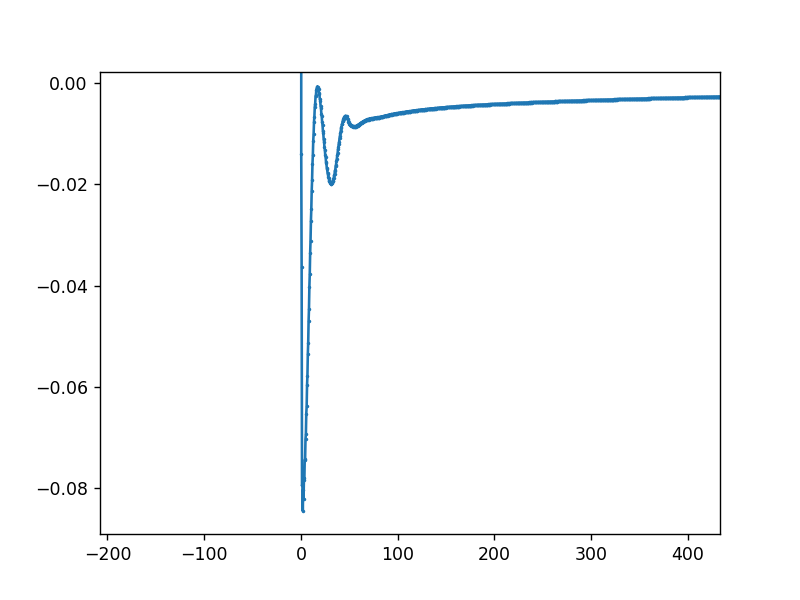

In [390]:
def polycaliZ(waveform,paras):

    def smoothfilt(f,h):
        f0, sigma = 0.05, 0.02
        return 1+0.5*(1/h-1)*(np.tanh((f-f0)/sigma)+1)

    length = len(waveform)
    # height = np.max(waveform)-np.min(waveform)
    samplingRate = 2.5
    nrfft = length/2+1
    nfft = 2*(nrfft-1)
    # freqs = np.linspace(0, nrfft*1.0/nfft*samplingRate,nrfft, endpoint=False)
    freqs = np.fft.rfftfreq(int(nfft),1/samplingRate)
    # freqs = np.fft.fftfreq(length,0.4)
    i_two_pi_freqs = 2j*np.pi*freqs
    
    precalc = 1.0
    for i in paras:
        timeFunData = 0.0
        if paras[i] != {}:
            expAmpRates, polyParas, delayParasAND2nd = np.array(paras[i]['pexp']), np.array(paras[i]['ppoly']),\
                 np.array(paras[i]['time'])
        else:
            continue
        pExp0 = expAmpRates
        pExp1 = polyParas[:2]
        pPoly = polyParas[2:]
        tCut,tShift,tstart,sigma1 = delayParasAND2nd
        # tlist = np.arange(2*(nrfft-1),dtype=float)/samplingRate
        tlist = np.arange(length,dtype=float)/samplingRate
        if len(pExp0) > 1:
            timeFunData += np.sum(pExp0[1::2,None]*np.exp(-pExp0[2::2,None]*tlist[None,:]), axis=0)
        timeFunData += pExp1[0]*np.exp(-pExp1[1]*tlist)*np.polyval(pPoly,tlist)*(tlist<=tCut+20)*\
        (0.5-0.5*scipy.special.erf(sigma1*(tlist-tCut+tShift)))*(0.5+0.5*scipy.special.erf(4.0*(tlist-tstart+0.5)))
        timeFunDataf = np.fft.rfft(timeFunData)
#         timeFunDataf *= smoothfilt(freqs,timeFunDataf)
        precalc /= (1.0+timeFunDataf*i_two_pi_freqs/samplingRate)
    f_cali = precalc
    f_step = np.fft.rfft(waveform)
    signal = np.fft.irfft(f_step*f_cali)
    # signal = op.RowToRipe().smooth(np.fft.irfft(f_step*f_cali),0.4)
    return (np.real(signal),)

wave = wn.square(2000e-9,0e-9) << 1000e-9
# pulse_overshot = ((wn.square(0.8e-9) << (0 + 2000e-9 - 0.4e-9))-(wn.square(0.8e-9) << (0.4e-9 + 0)))
# wave += pulse_overshot
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.8
signal1, = polycaliZ(wave,zParas)
# signal_conv = np.convolve(signal1,timeFunData,"same")
plt.figure()
plt.plot(t*1e9,signal1,'-o',markersize=1)
# plt.plot(t*1e9,op.RowToRipe().smooth(wave,0.4))
# plt.plot(t*1e9,op.RowToRipe().smooth(signal1,0.4),'-o',markersize=1)
# plt.plot(t,pulse_overshot(t))
# plt.plot(xbar*1e-9+500e-9,ybar)
# plt.plot(t,wave)

In [928]:
np.max(wave)

0.0042

In [297]:
1000/330

3.0303030303030303

<IPython.core.display.Javascript object>


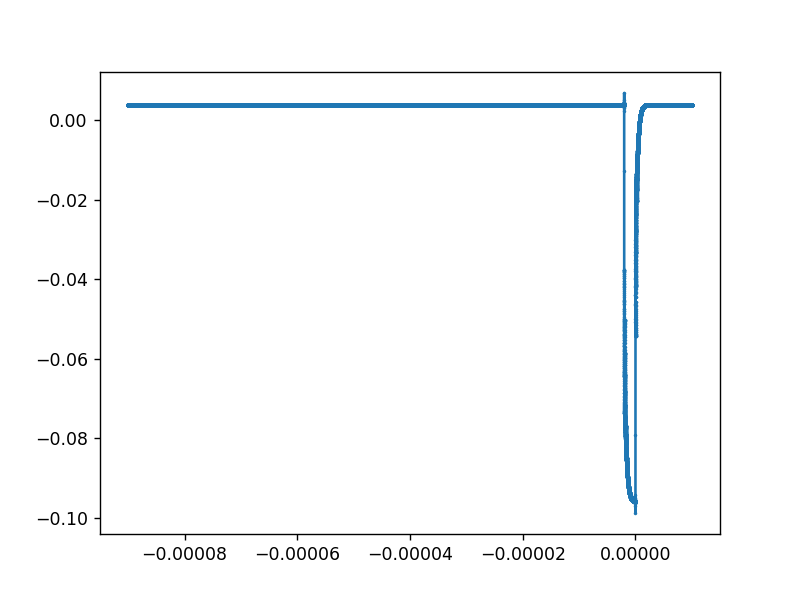

In [306]:
def caliZ(paras):
    samplingRate = 2.5
    nrfft = 125001
    nfft = 2*(nrfft-1)
#     freqs = np.linspace(0, nrfft*1.0/nfft*samplingRate,nrfft, endpoint=False)
    freqs = np.fft.rfftfreq(nfft,1/samplingRate)
#     freqs = np.fft.fftfreq(250000,0.4)
    i_two_pi_freqs = 1j*np.pi*freqs
    
    precalc = 1.0
    for i in paras:
        timeFunData = 0.0
        if paras[i] != {}:
            expAmpRates, polyParas, delayParasAND2nd = np.array(paras[i]['pexp']), np.array(paras[i]['ppoly']),\
                 np.array(paras[i]['time'])
        else:
            continue
        pExp0 = expAmpRates
        pExp1 = polyParas[:2]
        pPoly = polyParas[2:]
        tCut,tShift,tstart,sigma1 = delayParasAND2nd
        tlist = np.arange(2*(nrfft-1),dtype=float)/samplingRate
        # tlist = np.arange(250000,dtype=float)/samplingRate
        if len(pExp0) > 1:
            timeFunData += np.sum(pExp0[1::2,None]*np.exp(-pExp0[2::2,None]*tlist[None,:]), axis=0)
        timeFunData += pExp1[0]*np.exp(-pExp1[1]*tlist)*np.polyval(pPoly,tlist)*(tlist<=tCut+20)*\
        (0.5-0.5*scipy.special.erf(sigma1*(tlist-tCut+tShift)))*(0.5+0.5*scipy.special.erf(4.0*(tlist-tstart+0.5)))
        timeFunDataf = np.fft.rfft(timeFunData)
        precalc /= (1.0+timeFunDataf*i_two_pi_freqs)
    return precalc

wave = wn.square(2000e-9,0e-9) << 1000e-9
# pulse_overshot = ((wn.square(0.8e-9) << (0 + 2000e-9 - 0.4e-9))-(wn.square(0.8e-9) << (0.4e-9 + 0)))
# wave += pulse_overshot
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.1
c1 = caliZ(zParas)
f_step1 = np.fft.rfft(wave)
signal1 = np.real(np.fft.irfft(f_step1*c1))
# signal_conv = np.convolve(signal1,timeFunData)
plt.figure()
plt.plot(t,signal1,'-o',markersize=1)
# plt.plot(t,pulse_overshot(t))
# plt.plot(xbar*1e-9+500e-9,ybar)
# plt.plot(t,timeFunData)

In [2572]:
np.max(signal1)

0.11778085615797834

In [2570]:
np.max(signal1)

0.11817320647745043

<IPython.core.display.Javascript object>


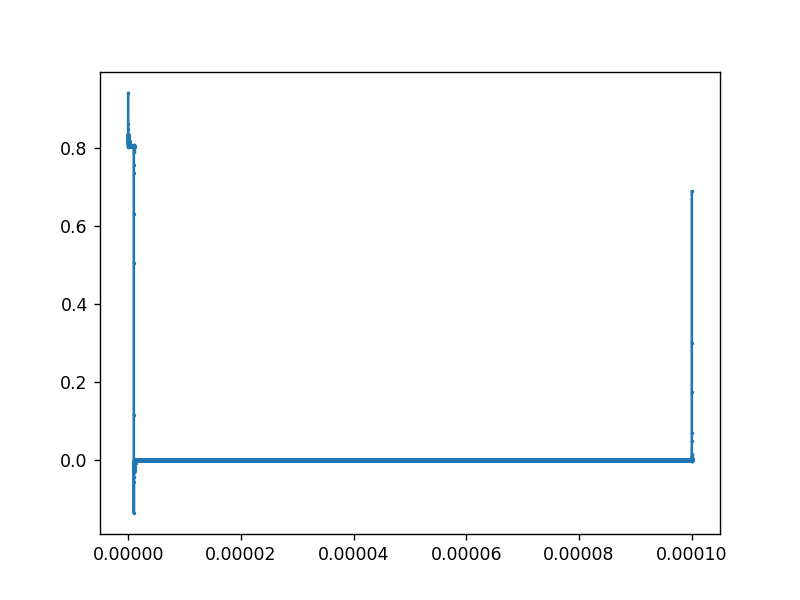

In [2539]:
def caliZ(paras):
    samplingRate = 2.5
    nrfft = 125001
    nfft = 2*(nrfft-1)
#     freqs = np.linspace(0, nrfft*1.0/nfft*samplingRate,nrfft, endpoint=False)
#     freqs = np.fft.rfftfreq(nfft,1/samplingRate)
    freqs = np.fft.fftfreq(250000,0.4)
    i_two_pi_freqs = 1j*np.pi*freqs
    
    precalc = 1.0
    for i in paras:
        timeFunData = 0.0
        if paras[i] != {}:
            expAmpRates, polyParas, delayParasAND2nd = np.array(paras[i]['pexp']), np.array(paras[i]['ppoly']),\
                 np.array(paras[i]['time'])
        else:
            continue
        pExp0 = expAmpRates
        pExp1 = polyParas[:2]
        pPoly = polyParas[2:]
        tCut,tShift,tstart,sigma1 = delayParasAND2nd
        tlist = np.arange(2*(nrfft-1),dtype=float)/samplingRate
        # tlist = np.arange(250000,dtype=float)/samplingRate
        if len(pExp0) > 1:
            timeFunData += np.sum(pExp0[1::2,None]*np.exp(-pExp0[2::2,None]*tlist[None,:]), axis=0)
        timeFunData += pExp1[0]*np.exp(-pExp1[1]*tlist)*np.polyval(pPoly,tlist)*(tlist<=tCut+20)*\
        (0.5-0.5*scipy.special.erf(sigma1*(tlist-tCut+tShift)))*(0.5+0.5*scipy.special.erf(4.0*(tlist-tstart+0.5)))
        timeFunDataf = np.fft.fft(timeFunData)
        precalc /= (1.0+timeFunDataf*i_two_pi_freqs)
    return precalc

wave = wn.square(2000e-9,0e-9) << 1000e-9
# pulse_overshot = ((wn.square(0.8e-9) << (0 + 2000e-9 - 0.4e-9))-(wn.square(0.8e-9) << (0.4e-9 + 0)))
# wave += pulse_overshot
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.8
c1 = caliZ(zParas)
f_step1 = np.fft.fft(wave)
signal1 = np.real(np.fft.ifft(f_step1*c1))
# signal_conv = np.convolve(signal1,timeFunData)
plt.figure()
plt.plot(t,signal1,'-o',markersize=1)
# plt.plot(t,pulse_overshot(t))
# plt.plot(xbar*1e-9+500e-9,ybar)
# plt.plot(t,timeFunData)

In [1035]:
xbar

array([   0,    2,    4,    6,    8,   10,   12,   14,   16,   18,   20,
         22,   24,   26,   28,   30,   32,   34,   36,   38,   40,   42,
         44,   46,   48,   50,   52,   54,   59,   64,   69,   74,   79,
         84,   89,   94,   99,  104,  109,  114,  119,  124,  129,  134,
        139,  144,  149,  154,  159,  164,  169,  174,  224,  274,  324,
        374,  424,  474,  524,  574,  624,  674,  724,  774,  824,  874,
        924,  974, 1024, 1074, 1124, 1174, 1224, 1274, 1324, 1374, 1424,
       1474, 1524, 1574, 1624, 1674, 1724, 1774, 1824, 1874, 1924, 1974,
       2024, 2074, 2124, 2174, 2224, 2274, 2324, 2374, 2424, 2474, 2524,
       2574, 2624, 2674, 2724, 2774, 2824, 2874, 2924])

<IPython.core.display.Javascript object>


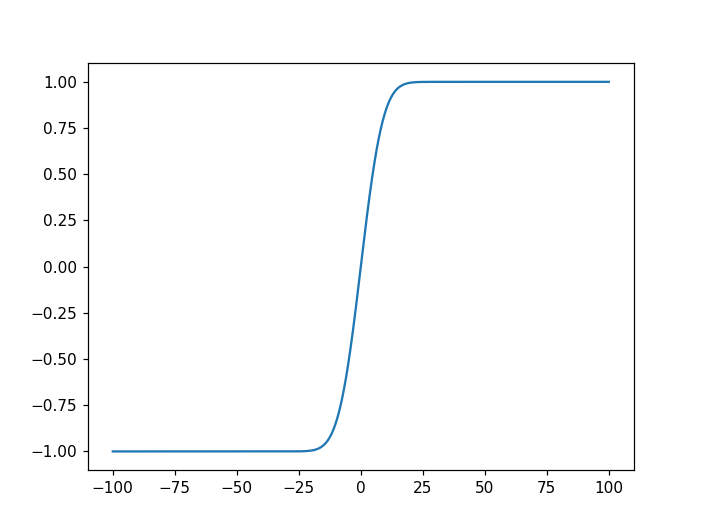

In [21]:
tlist = np.linspace(-100,100,1001)

y = scipy.special.erf(tlist/10)
plt.figure()
plt.plot(tlist,y)

<IPython.core.display.Javascript object>


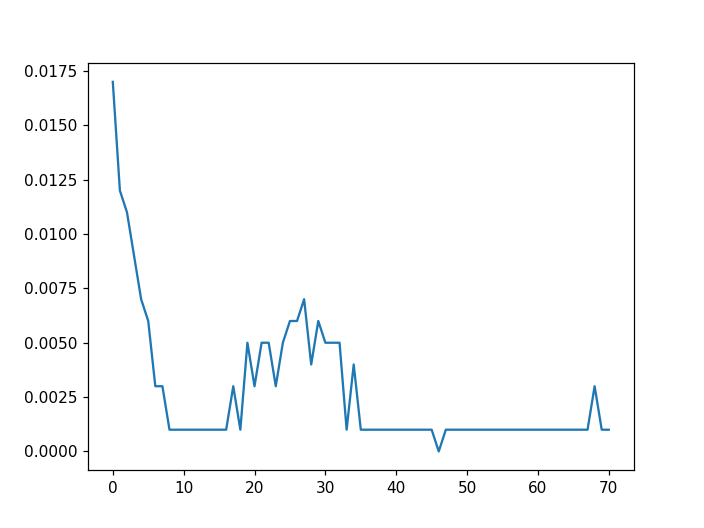

In [170]:
x, y, s = value[0][0][0:],value[0][1][:], np.abs(value[0][2])[0:,:]
peak = (np.max(s) + np.min(s)) / 2
v, f = op.RowToRipe().profile(x,y,s,peak,axis=0)
plt.figure()
plt.plot(np.abs(f-np.max(f)),-v)

<IPython.core.display.Javascript object>


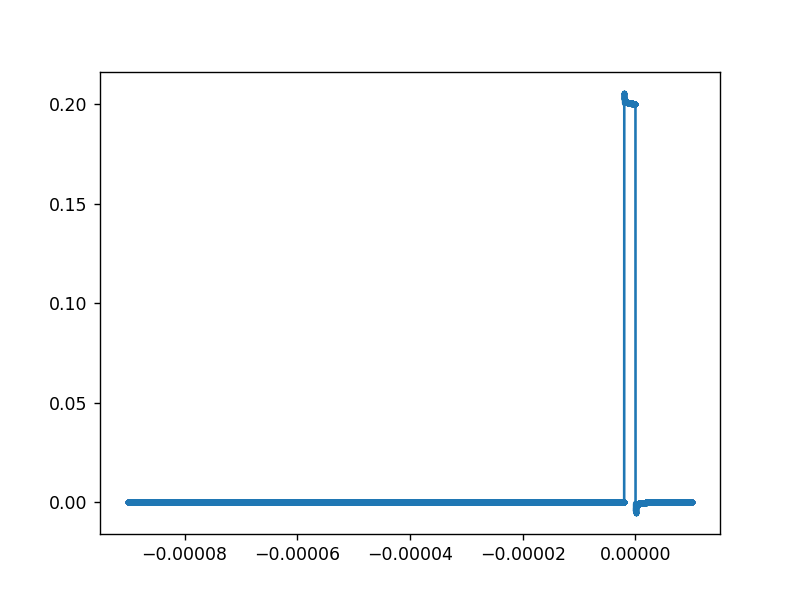

In [2630]:
def fitfunc(t, p):
#     p[2::2] = p[2::2] 
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))

def caliZ(p,height):
    p[0] = 0
    x = np.arange(250000)*0.4
    response = fitfunc(x,p)
    c = 1+1j*np.pi*np.fft.fftfreq(len(x),0.4)*np.fft.fft(response)
    
    return c

wave = wn.square(2000e-9) << 1000e-9
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.2
c = caliZ(p,0)
f_step = np.fft.fft(wave)
signal = np.fft.ifft(f_step/c)
# signal = np.fft.ifft(np.fft.fft(signal1)/c)
plt.figure()
# plt.plot(wave,'.')
plt.plot(t,signal,'-o',markersize=2)
# plt.plot(np.real(signal2))

0.2


<IPython.core.display.Javascript object>


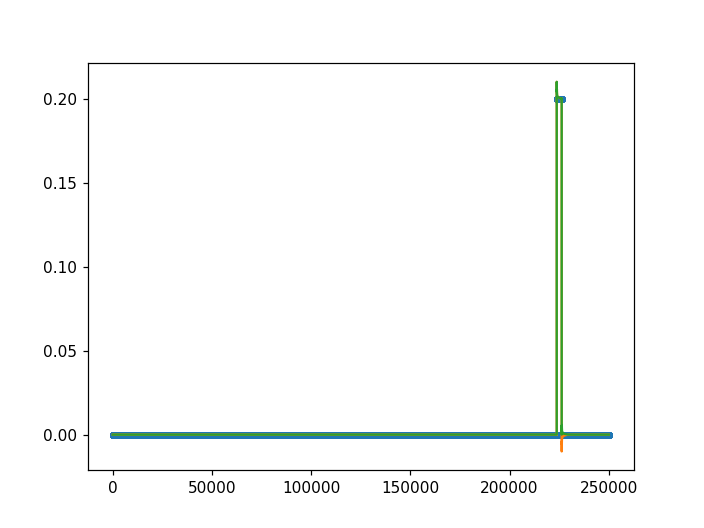

In [474]:
def fitfunc(t, p):
#     p[2::2] = p[2::2] 
    return (t > 0) * (p[0] + np.sum(p[1::2,None]*np.exp(-p[2::2,None]*t[None,:]), axis=0))

def caliZ(p,height):
    p[0] = 0
    x = np.arange(250000)*0.4
    response = fitfunc(x,p)/(-0.8)
    c = 1-1j*np.pi*np.fft.fftfreq(len(x),0.4)*np.fft.fft(response)
    
    return c

p = np.array([-6.93516486e-04, -7.43655210e-03,  2.69638574e-03, -3.18463618e+02,
        1.73974063e-01,  1.12903930e+03,  1.91064258e-01, -9.38886945e+02,
        2.17697980e-01, -1.25323933e+03,  2.17694425e-01,  1.30476266e+03,
        2.45296332e-01,  1.30494480e+03,  2.45309765e-01,  3.42349245e+02,
        2.92975567e-01,  3.51652829e+02,  2.92887689e-01, -1.92213634e+03,
        2.73914450e-01])
wave = wn.square(1000e-9)
t = np.linspace(-90000,10000,250000)*1e-9
wave = wave(t)*0.2
height = wave[np.nonzero(wave)][0]
print(height)
c = caliZ(p,height)
f_step = np.fft.fft(wave)
signal = np.fft.ifft(f_step/c)
plt.figure()
plt.plot(wave,'.')
plt.plot(np.real(signal))
plt.plot(np.abs(signal))

In [472]:
signal

array([-1.02119026e-09-1.13946526e-18j,  1.02108675e-09-3.77259270e-18j,
       -1.02103185e-09+4.59987662e-18j, ...,
        1.02140355e-09-7.68513334e-18j, -1.02134869e-09+8.08271858e-18j,
        1.02124514e-09-5.52466709e-18j])

<IPython.core.display.Javascript object>


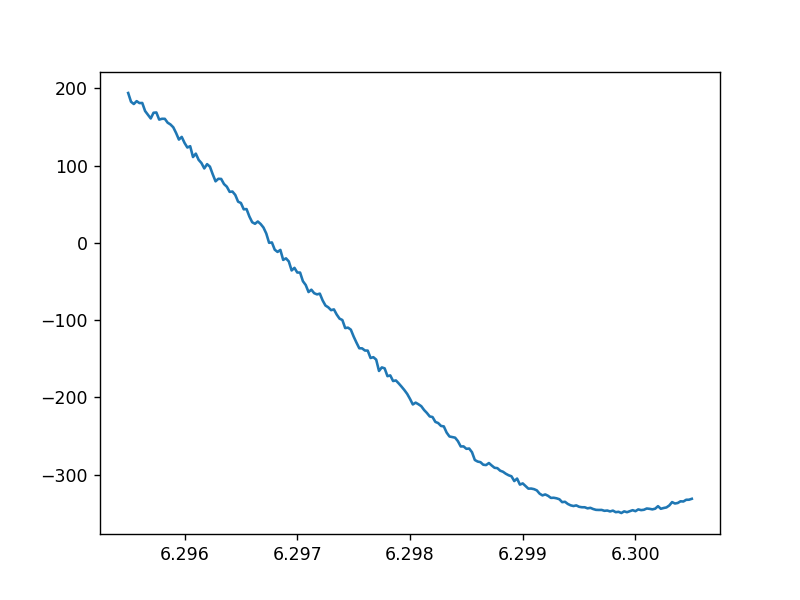

In [238]:
plt.figure()
plt.plot(value[0][1],value[0][2][2])
plt.show()

In [1577]:
0.025/0.15*101

16.833333333333336

In [15]:
v,t,s = value[0][0][:],value[0][1],value[0][2][:,:]
v,f = op.RowToRipe().profile(v,t,s,peak=15,axis=0)
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(f,v,'r-o')
plt.show()

In [17]:
f_new, v_new = np.abs(f-np.max(f)), v[::-1]

<IPython.core.display.Javascript object>


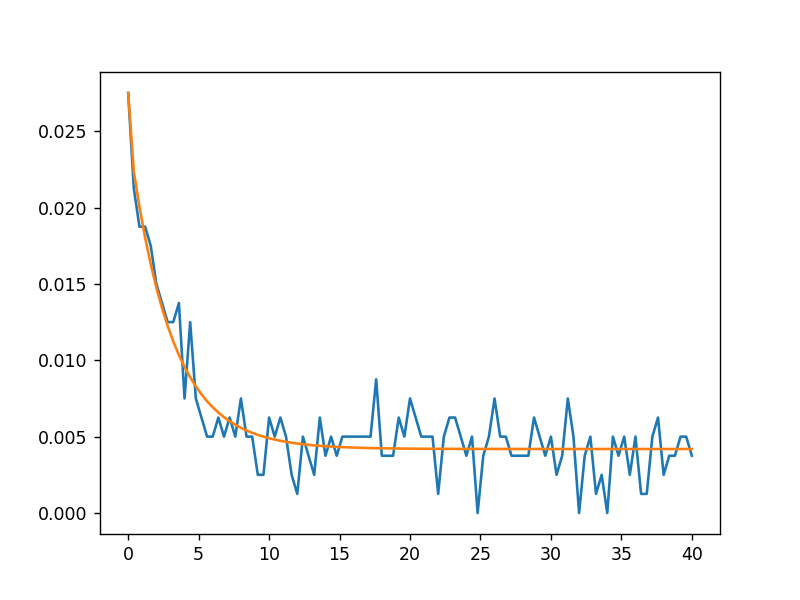

In [18]:
plt.figure()
plt.plot((f_new[:]-np.min(f_new[:])),v[:])
plt.show()

In [19]:
x,y=(f_new[:]-np.min(f_new[:])),v[:]
a, b, c, d, e = op.TwoExp_Fit().fitTwoexp(x,y)
z = a*np.exp(b*x) + c*np.exp(d*x) + e 
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,z)
plt.show()

(0.02181945161130762, -0.3556120421284931, 0.004363890322261524, -0.07112240842569863, 0.0)


d:\qulab\qulab\optimize.py:423: RuntimeWarning: overflow encountered in exp
  return np.sum((a*np.exp(b*x) + c*np.exp(d*x) + e - y)**2)
d:\qulab\qulab\optimize.py:423: RuntimeWarning: overflow encountered in square
  return np.sum((a*np.exp(b*x) + c*np.exp(d*x) + e - y)**2)


In [21]:
1/d

-2.956788087415525

<IPython.core.display.Javascript object>


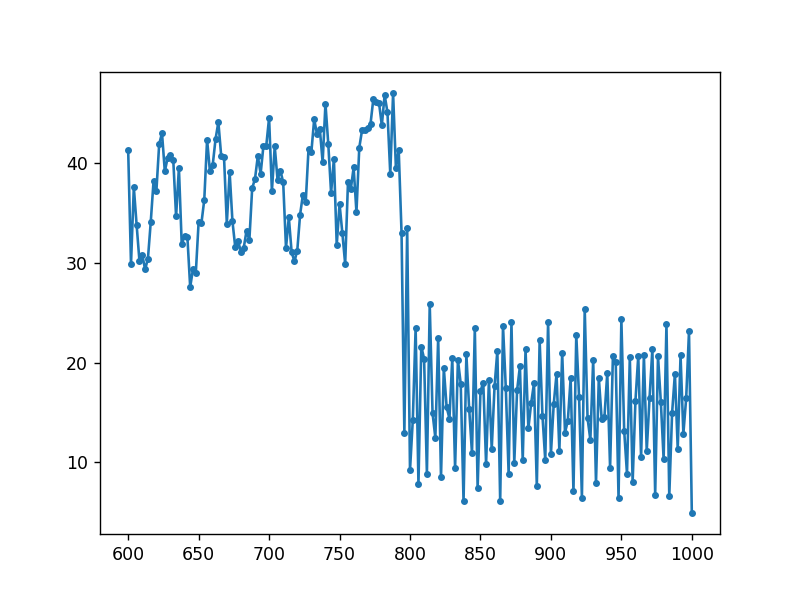

In [996]:
x,y = value[0][1],np.abs(value[0][2][1])
# a,b,c,d,e,f = op.Lorentz_Fit().fitLorentz(x,y)
# z = a/(1.0+c*(x-b)**2)+d
# fig = plt.gcf()
# ax = plt.getp(fig,'axes')
plt.figure()
plt.plot(x,y,'-o',markersize=3)
# plt.plot(x,y,'.')
plt.show()

# RamseyZpulse

In [24]:
data, ID, comment, tags, name, finishtime = read(title='ramseyZpulse',which=2)
t_rz, poplist_rz = data[0][:,0], data[1][:]
print(tags,finishtime)

['q6'] 2020-06-12 14:32:13.036013


In [56]:
def test(theta):
    j = 0
    theta_new = []
    theta_new.append(theta[0])
    for i,j in enumerate(theta[1:],start=1):
        while 1:
            if theta_new[i-1]>j+0.8:
                j += np.pi
            else:
                break
        theta_new.append(j)
    return np.array(theta_new)

<IPython.core.display.Javascript object>


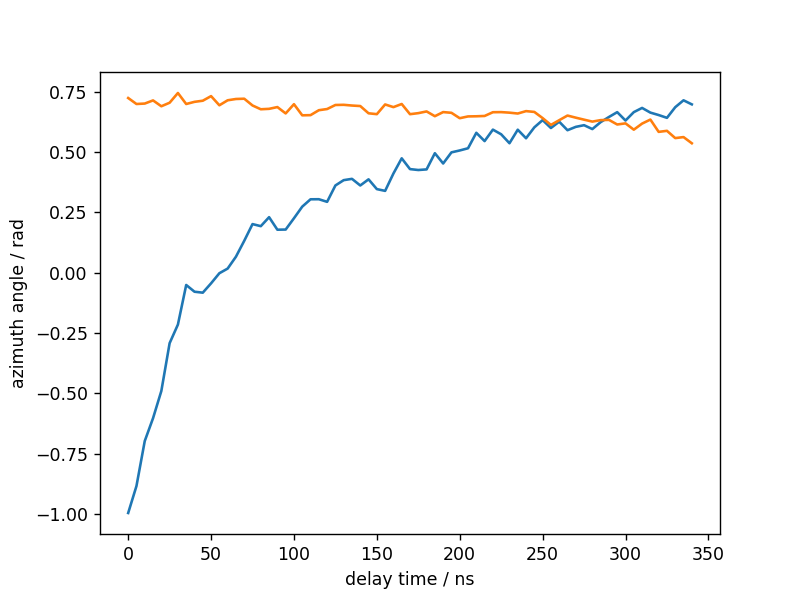

In [23]:
coordinate = [[1-2*j[i] for i in range(2)] for j in poplist_rz]
theta = np.array([np.arctan(i[1]/i[0]) for i in coordinate])
# theta = np.array([theta[i] if i<47 else theta[i]-np.pi for i in range(len(theta))])
# theta = test(theta)
plt.figure()
plt.plot(t_rz,theta)
plt.xlabel('delay time / ns')
plt.ylabel('azimuth angle / rad')
plt.show()

In [25]:
coordinate = [[1-2*j[i] for i in range(2)] for j in poplist_rz]
theta = np.array([np.arctan(i[1]/i[0]) for i in coordinate])
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(t_rz,theta)
plt.show()

In [1017]:
j = 0
theta_new = []
theta_new.append(theta[0])
for i,j in enumerate(theta[1:],start=1):
    if theta_new[i-1]-j>np.pi/2:
        theta_new.append(j+np.pi/2)
    elif theta_new[i-1]-j<-np.pi/2:
        theta_new.append(j-np.pi/2)
    else:
        theta_new.append(j)

<IPython.core.display.Javascript object>


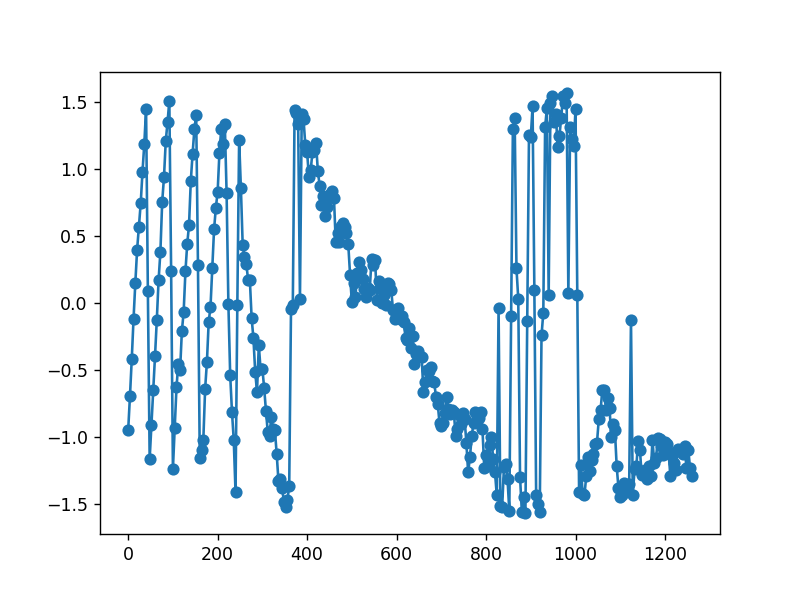

In [1019]:
plt.figure()
plt.plot(t_rz,theta_new,'-o')
plt.show()

In [1016]:
np.shape(theta_new)

(335,)

In [13]:
a, b, c, d, e = op.TwoExp_Fit().fitTwoexp(t_rz,theta)
z = a*np.exp(b*t_rz) + c*np.exp(d*t_rz) + e
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(t_rz,z)
plt.show()

(-1.2305019961822254, -0.019269795441661734, -0.2461003992364451, -0.003853959088332347, 0.7487539570727105)


d:\qulab\qulab\optimize.py:423: RuntimeWarning: overflow encountered in square
  return np.sum((a*np.exp(b*x) + c*np.exp(d*x) + e - y)**2)
d:\qulab\qulab\optimize.py:423: RuntimeWarning: overflow encountered in exp
  return np.sum((a*np.exp(b*x) + c*np.exp(d*x) + e - y)**2)


In [1782]:
print(1/b,1/d)

-35.332317708042 -330.1660583068357


# RB

['q6', 'reference', 'nodrag'] 2020-08-27 20:16:44.037242


<IPython.core.display.Javascript object>


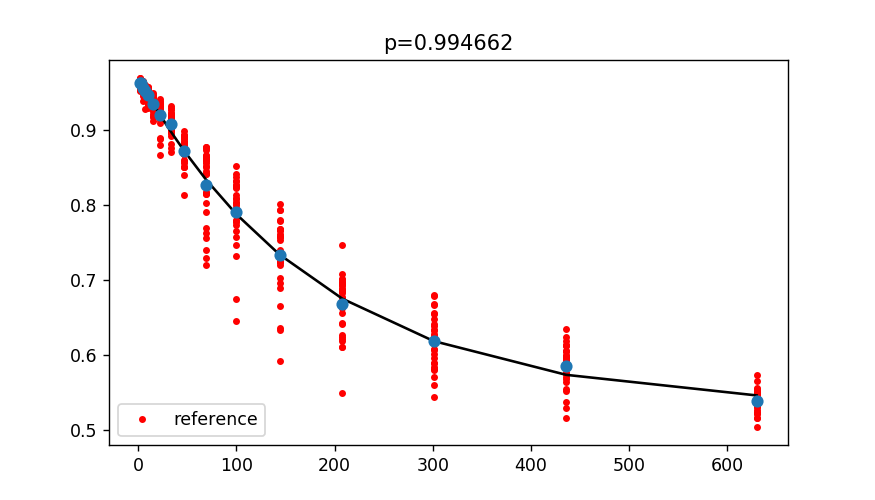

In [173]:
data, ID, comment, tags, name, finishtime = read(title='RB_waveform',which=0)
print(tags,finishtime)
n, pop = data[0][:,0],data[1]
x = np.meshgrid(range(np.shape(pop)[1]),n)[1]
plt.figure(figsize=(7,4))
x = np.meshgrid(range(np.shape(pop)[1]),n)[1]
plt.plot(x.flatten(),pop.flatten(),'r.',label=tags[1])
plt.legend(loc='lower left')
x, y = n, np.mean(pop,axis=1)
A,B,p = op.RB_Fit().fitRB(x,y)
z = A*p**x+B
plt.plot(x,z,'k')
plt.plot(x,y,'o')
plt.title('p=%f'%p)
plt.show()

1593098769.7224395

In [267]:
Pref, Pgate, d = 0.996725, 0.996521, 2**(1)
Rgate = (1-Pgate/Pref)*(1-1/d)
Rgate

0.00010233514760843443

In [268]:
1-0.00010233514760843443

0.9998976648523916

# pi脉冲优化

<IPython.core.display.Javascript object>


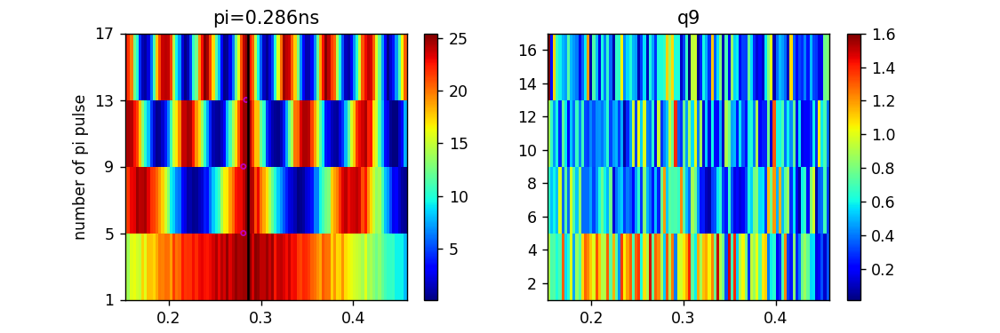

['q9'] 2020-11-07 23:47:24.847316


In [237]:
value,num,tags,finishtime = write(title='pipulseOpt',height=3,which=0,peak=1120)
print(tags,finishtime)

In [238]:
x, y, s = value[0][0],value[0][1], np.abs(value[0][2])
index = y[np.argmax(np.abs(s),axis=1)[0]]
y = np.array([op.RowToRipe().firstMax(y,z,num=0.29,peakpercent=0.9,insitu=True) for z in s])
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].set_xlabel('time / ns')
ax[0].set_yticks(x)
ax[0].set_ylabel('number of pi pulse')
ax[0].scatter(y[1:-1],x[1:-1],marker='.',c='',edgecolors='m')
ax[0].vlines(np.mean(y),np.max(x),np.min(x))
ax[0].set_title('pi=%.3fns'%np.mean(y))
plt.show()

<IPython.core.display.Javascript object>


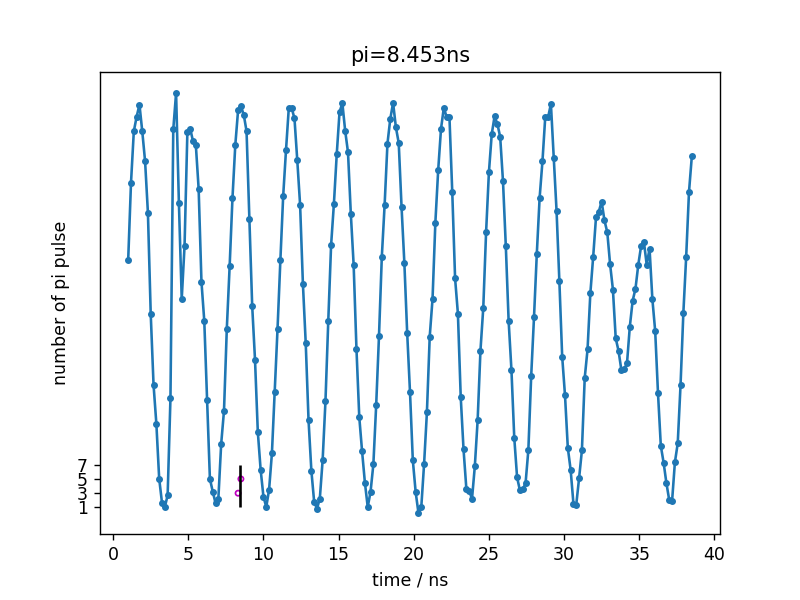

In [383]:
x,y = value[0][1],np.abs(value[0][2][2])
# a,b,c,d,e,f = op.Lorentz_Fit().fitLorentz(x,y)
# z = a/(1.0+c*(x-b)**2)+d
# fig = plt.gcf()
# ax = plt.getp(fig,'axes')
plt.figure()
plt.plot(x,y,'-o',markersize=3)
# plt.plot(x,y,'.')
plt.show()

# IQ-Mixer线性度

<IPython.core.display.Javascript object>


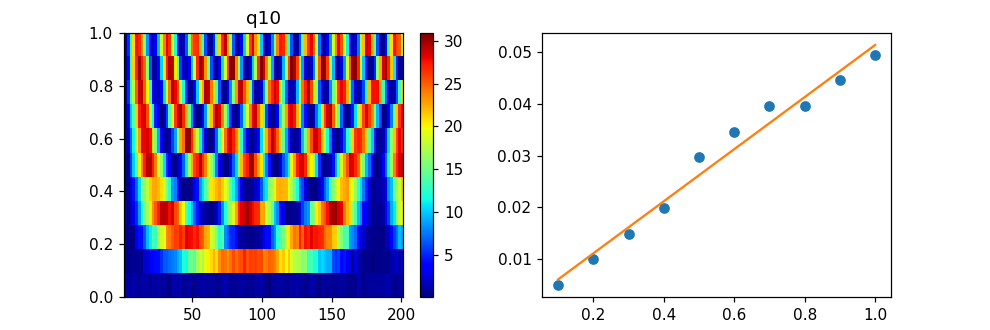

['q10'] 2020-10-14 13:42:31.095382


In [71]:
value,num,tags,finishtime = write(title='lineIQMixer',height=3,which=0,peak=1120)
print(tags,finishtime)

In [72]:
x, y, s = value[0][0][1:],value[0][1][:], np.abs(value[0][2])[1:,:]
w, f, P = op.RowToRipe().spectrum(y,s,axis=1,shift=False)
z, func = op.RowToRipe().poly(x,w,1)
plt.plot(x,np.array(w),'o')
plt.plot(x,func(x))

# AllXY drag

['q2'] 2020-11-04 00:04:10.685967


<IPython.core.display.Javascript object>


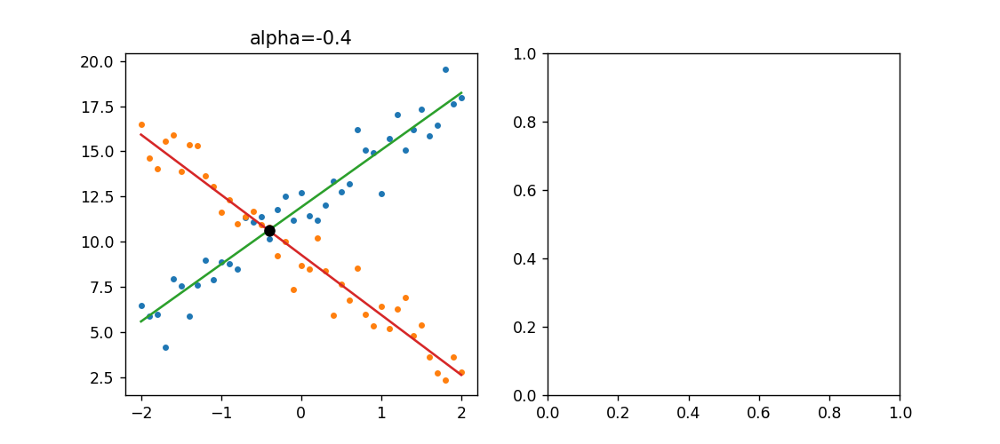

In [533]:
data, ID, comment, tags, name, finishtime = read(title='AllXYdragdetune',which=1)
print(tags,finishtime)
fall, sall = data[0],data[1]
fig, axes = plt.subplots(ncols=2,nrows=1,figsize=(9,4))
l = np.shape(fall)[0]//2
f1, f2, s1, s2 = fall[:l,0], fall[l:,0], np.abs(sall[:l,0]), np.abs(sall[l:,0])
z1 = np.poly1d(np.polyfit(f1,s1,1))(f1)
z2 = np.poly1d(np.polyfit(f2,s2,1))(f2)
index = np.argmin(np.abs(z1-z2))
axes[0].plot(np.array([f1,f2]).T,np.array([s1,s2]).T,'.')
axes[0].plot(np.array([f1,f2]).T,np.array([z1,z2]).T)
# axes[0].plot(fall[l:,:],np.abs(sall[l:,:]))
axes[0].plot([f1[index],f2[index]],[z1[index],z2[index]],'ko')
axes[0].set_title(f'alpha={round(f1[index],3)}')
plt.show()

# HD

In [396]:
data, ID, comment, tags, name, finishtime = read(title='dragcoefHD',which=5)
print(tags,finishtime)

['q3'] 2020-06-25 15:55:51.476244


<IPython.core.display.Javascript object>


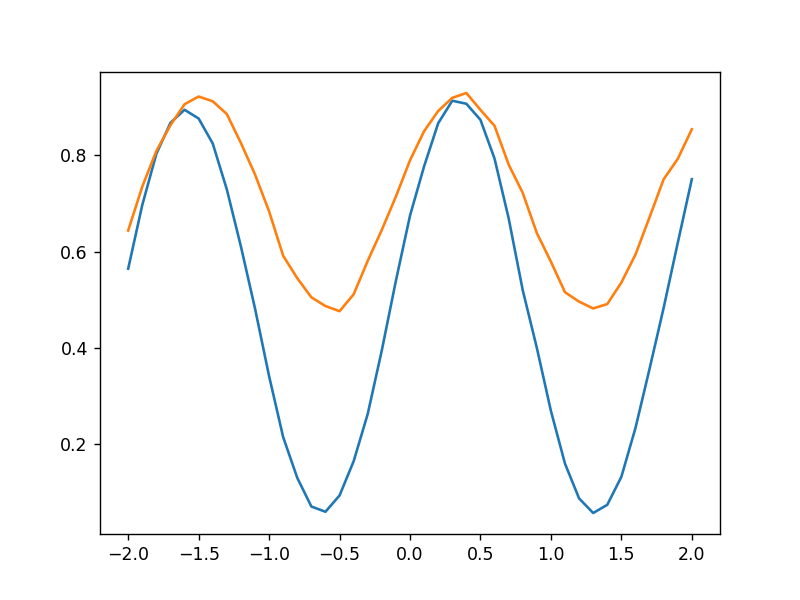

In [395]:
x, y = data[0][:,0], data[1][:,0]
plt.figure()
plt.plot(x,y)
plt.show()

In [397]:
x, y = data[0][:,0], data[1][:,0]
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,y)
plt.show()

# 临界线

In [201]:
data, ID, comment, tags, name, finishtime = read(title='threshHold',which=0)
print(tags,finishtime)

['q5'] 2020-11-23 20:54:27.587083


<IPython.core.display.Javascript object>


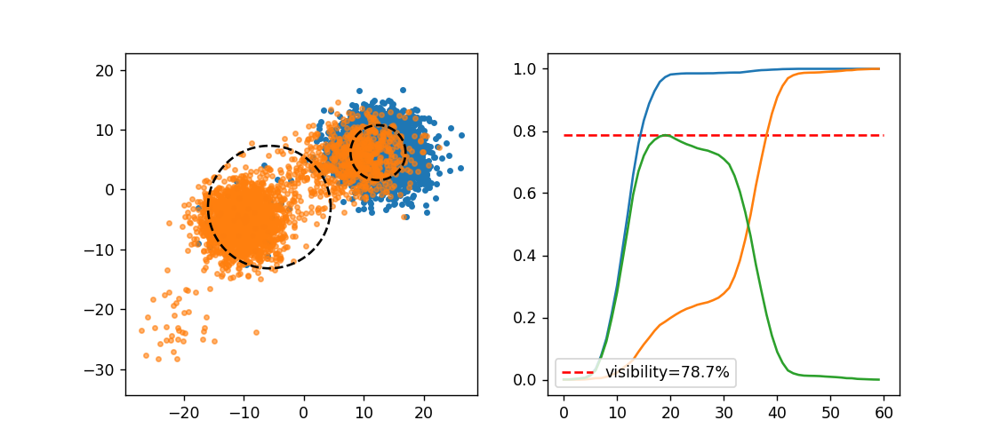

In [203]:
s_st = data[1]
n = np.shape(s_st)[2]
num = n

fig, axes = plt.subplots(ncols=2,nrows=num,figsize=(9,4*num))
for i in range(n):
    s_off, s_on = s_st[0,:,i], s_st[1,:,i]
    res = await mrw.visibility(1,s_off,s_on)
    ax0 = axes[i][0] if num>1 else axes[i]
    ax0.plot(np.real(s_off),np.imag(s_off),'.')
    ax0.plot(np.real(s_on),np.imag(s_on),'.',alpha=0.6)
    ax0.plot(*(res[0][3]),'k--')
    ax0.plot(*(res[0][4]),'k--')
    ax0.axis('equal')
    ax1 = axes[i][1] if num>1 else axes[i+1]
    for j in res[0][:3]:
        ax1.plot(j)
    maxdata = np.max(res[0][2])
    ax1.hlines(maxdata,0,60,'r','--',label=f'visibility={round(maxdata*100,1)}%')
    ax1.legend(loc='lower left')
#     ax.vlines([0],10,-100)
#     ax.hlines([0],-10,100)

plt.show()

In [407]:
tag = ''
for i in tags:
    tag += i
save('threshHold',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=data[1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/threshHold/q6_20200824200935.npz')

# Crosstalk矩阵

In [505]:
z_crosstalk = np.ones((10,10))

<IPython.core.display.Javascript object>


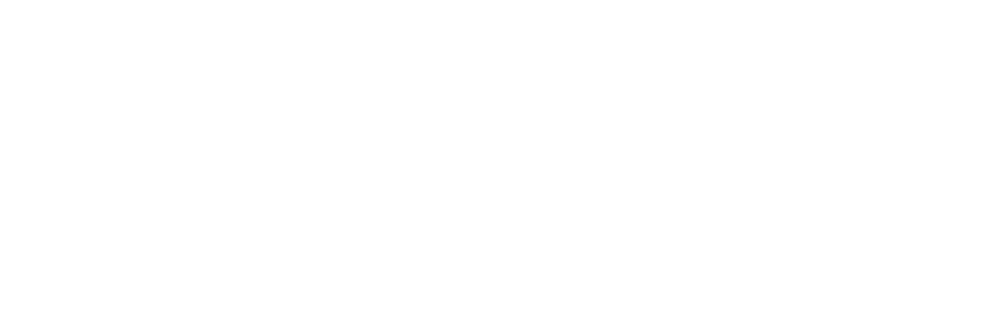

['q5_q1'] 2020-11-12 16:28:39.788361


In [684]:
value,num,tags,finishtime = write(height=3,title='crosstalkSpec',which=62,peak=1000)
print(tags,finishtime)
target = 1
q_target, q_bias = tags[0].split('_')
v, f, s = value[target-1][0][:-1], value[target-1][1][:], np.abs(value[target-1][2])[:-1,:]
peak = (np.max(np.abs(s))+np.min(np.abs(s))) / 2
v, f, res = op.Crosstalk_Fit(peak=peak).fitCrosstalk(v,f,s,classify=False)
z = res[0]*f + res[1]
row, col = eval(q_target[1:])-1, eval(q_bias[1:])-1
z_crosstalk[row,col] = -1/res[0]
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[target-1].scatter(f[:],v[:],marker='o',c='w',edgecolors='m')
ax[target-1].plot(f[:],z[:],'k--')
plt.show()

In [515]:
target = 1
q_target, q_bias = tags[0].split('_')
v, f, s = value[target-1][0][:], value[target-1][1][:], np.abs(value[target-1][2])[:,:]
peak = (np.max(np.abs(s))+np.min(np.abs(s))) / 2
v, f, res = op.Crosstalk_Fit(peak=peak).fitCrosstalk(v,f,s,classify=False)
z = res[0]*f + res[1]
row, col = eval(q_target[1:])-1, eval(q_bias[1:])-1
z_crosstalk[row,col] = -1/res[0]
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[target-1].scatter(f[:],v[:],marker='o',c='w',edgecolors='m')
ax[target-1].plot(f[:],z[:],'k--')
plt.show()

In [323]:
0.9*np.exp(-2/34)

0.8485858294693875

## 异常值拟合

<IPython.core.display.Javascript object>


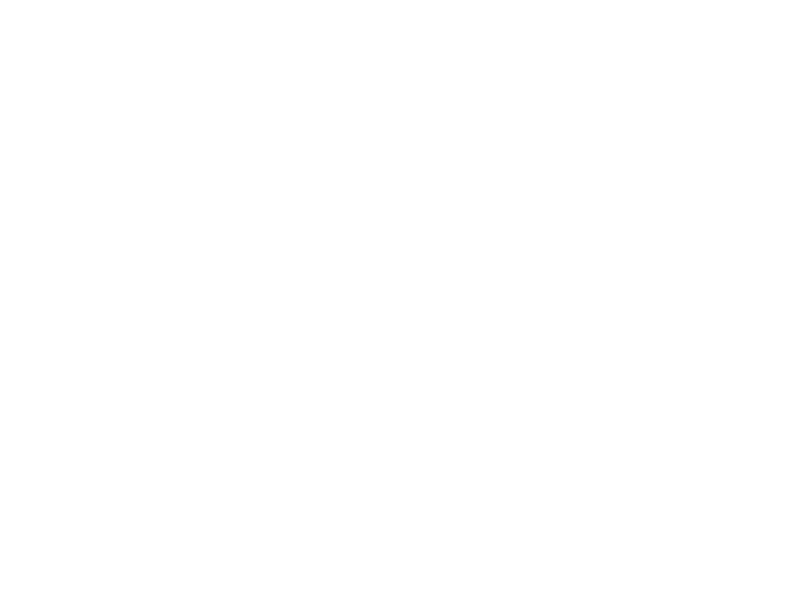

In [675]:
# data, ID, comment, tags, name, finishtime = read(title='crosstalkSpec',which=2)
# print(finishtime)
# x, y, z = data[0][:,0], data[1][0,:,0], data[2][0,:,0]
plt.figure()
plt.subplots_adjust(left=0.25, bottom=0.25)
x,y,z = value[0][0], value[0][1], np.abs(value[0][2])
extent = [min(y),max(y),min(x),max(x)]
plt.imshow(z,extent=extent,aspect='auto',origin='lower',cmap='jet')
fig = plt.gcf()
ax = plt.getp(fig,'axes')
sa, sb = di.slidePlot(fig,ax[0],y)


In [676]:
z_crosstalk[row,col] = -1/sb.val

In [40]:
z_crosstalk = np.array([[ 1.00000000e+00,  2.02383880e-03,  2.35977230e-02,
         5.71947195e-03, -1.33333333e-03, -6.31147541e-03,
        -6.27160494e-03, -4.37220844e-03, -5.70616114e-03,
        -4.28235294e-03],
       [-4.86549118e-03,  1.00000000e+00, -1.82072289e-02,
        -7.30897010e-03, -9.28000000e-04,  6.49887640e-03,
         4.99172749e-03,  4.56042781e-03,  6.27596899e-03,
         4.62887139e-03],
       [-4.39778393e-03, -1.72865169e-02,  1.00000000e+00,
        -6.59090909e-03, -2.00000000e-03,  5.99514170e-03,
         4.00000000e-03,  4.56042781e-03,  6.85946903e-03,
         4.74639175e-03],
       [-4.75191816e-03, -1.06098286e-02, -2.51352785e-02,
         1.00000000e+00, -3.07654321e-03,  6.11428571e-03,
         3.25970149e-03,  5.93442623e-03,  8.56818182e-03,
         5.60000000e-03],
       [-4.55462185e-03, -8.58615997e-03, -1.43624733e-02,
        -2.03423620e-02,  1.00000000e+00,  6.75874328e-03,
         1.28413284e-03,  6.75874328e-03,  1.00120144e-02,
         5.81412250e-03],
       [ 4.38891967e-03,  5.61391304e-03,  8.74867676e-03,
         7.22848892e-03,  7.76843839e-03,  1.00000000e+00,
         1.32117374e-02, -1.49371243e-02, -1.41329888e-02,
        -6.26046512e-03],
       [-5.04548505e-03, -7.64003224e-03, -1.14129194e-02,
        -1.08192323e-02, -1.85300140e-02,  1.31854801e-02,
         1.00000000e+00,  8.39553022e-03,  1.23994098e-02,
         6.15839389e-03],
       [ 4.70190275e-03,  6.09497965e-03,  8.25790949e-03,
         6.89565843e-03,  6.65871833e-03,  3.08181818e-03,
         7.29630469e-03,  1.00000000e+00, -2.73029170e-02,
        -7.53447519e-03],
       [ 4.60123542e-03,  5.45104008e-03,  7.20743034e-03,
         6.20625201e-03,  6.25602968e-03,  4.45948204e-03,
         6.85405405e-03, -3.55051546e-03,  1.00000000e+00,
        -8.24950100e-03],
       [-4.24658603e-03, -4.98401826e-03, -6.25898520e-03,
        -5.55230999e-03, -5.91776224e-03, -6.22647528e-03,
        -7.34923492e-03,  2.70314637e-03,  2.19351852e-02,
         1.00000000e+00]]) - np.eye(10)

In [686]:
qname = [f'q{i+1}' for i in range(10)]
pd.DataFrame(z_crosstalk,columns=qname,index=qname)

,q1,q2,q3,q4,q5,q6,q7,q8,q9,q10
q1,1.000000,0.002024,0.023598,0.005719,-0.001333,-0.006311,-0.006272,-0.004372,-0.005706,-0.004282
q2,-0.004865,1.000000,-0.018207,-0.007309,-0.000928,0.006499,0.004992,0.004560,0.006276,0.004629
q3,-0.004398,-0.017287,1.000000,-0.006591,-0.002000,0.005995,0.004000,0.004560,0.006859,0.004746
q4,-0.004752,-0.010610,-0.025135,1.000000,-0.003077,0.006114,0.003260,0.005934,0.008568,0.005600
q5,-0.004555,-0.008586,-0.014362,-0.020342,1.000000,0.006759,0.001284,0.006759,0.010012,0.005814
q6,0.004389,0.005614,0.008749,0.007228,0.007768,1.000000,0.013212,-0.014937,-0.014133,-0.006260
q7,-0.005045,-0.007640,-0.011413,-0.010819,-0.018530,0.013185,1.000000,0.008396,0.012399,0.006158
q8,0.004702,0.006095,0.008258,0.006896,0.006659,0.003082,0.007296,1.000000,-0.027303,-0.007534
q9,0.004601,0.005451,0.007207,0.006206,0.006256,0.004459,0.006854,-0.003551,1.000000,-0.008250
q10,-0.004247,-0.004984,-0.006259,-0.005552,-0.005918,-0.006226,-0.007349,0.002703,0.021935,1.000000


<IPython.core.display.Javascript object>


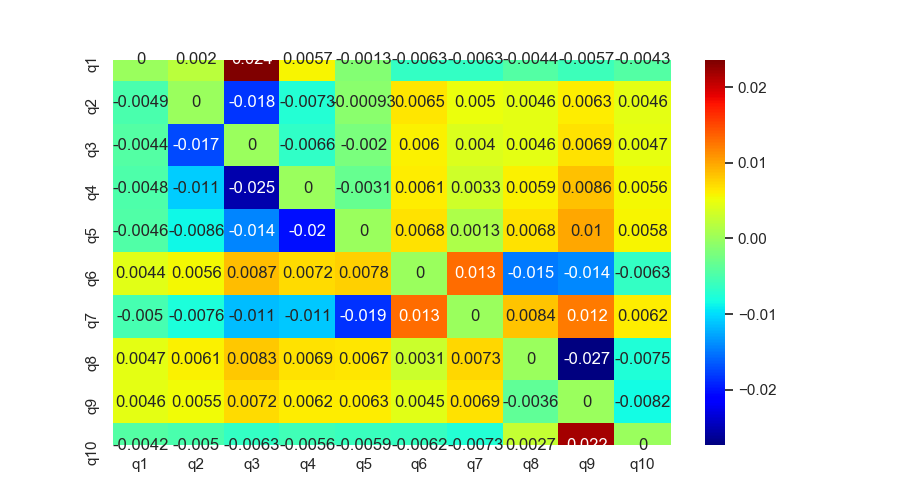

In [45]:
# plt.figure()
# plt.imshow(z_crosstalk-z_crosstalk_old,cmap='coolwarm')
# plt.title('crosstalk_diff')
# plt.colorbar()
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")

# Load the example flights dataset and convert to long-form
qname = [f'q{i+1}' for i in range(10)]
d = pd.DataFrame(z_crosstalk,columns=qname,index=qname)

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 5))
sns.heatmap(d, annot=True,cmap='jet', ax=ax)

In [44]:
import seaborn as sns
sns.set_theme(style="whitegrid")

# Load the brain networks dataset, select subset, and collapse the multi-index
qname = [f'q{i+1}' for i in range(10)]
df = pd.DataFrame(z_crosstalk,columns=qname,index=qname)

# used_networks = [1, 5, 6, 7, 8, 12, 13, 17]
# used_columns = (df.columns
#                   .get_level_values("network")
#                   .astype(int)
#                   .isin(used_networks))
# df = df.loc[:, used_columns]

df.columns = df.columns.map("-".join)

# Compute a correlation matrix and convert to long-form
corr_mat = df.corr().stack().reset_index(name="correlation")

# Draw each cell as a scatter point with varying size and color
g = sns.relplot(
    data=df,
    x="level_0", y="level_1", hue="correlation", size="correlation",
    palette="vlag", hue_norm=(-1, 1), edgecolor=".7",
    height=5, sizes=(50, 250), size_norm=(-.2, .8),
)

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
for artist in g.legend.legendHandles:
    artist.set_edgecolor(".7")

ValueError: Could not interpret value `level_0` for parameter `x`

In [42]:
help(sns.relplot)

Help on function relplot in module seaborn.relational:

relplot(*, x=None, y=None, hue=None, size=None, style=None, data=None, row=None, col=None, col_wrap=None, row_order=None, col_order=None, palette=None, hue_order=None, hue_norm=None, sizes=None, size_order=None, size_norm=None, markers=None, dashes=None, style_order=None, legend='auto', kind='scatter', height=5, aspect=1, facet_kws=None, units=None, **kwargs)
    Figure-level interface for drawing relational plots onto a FacetGrid.
    
    This function provides access to several different axes-level functions
    that show the relationship between two variables with semantic mappings
    of subsets. The ``kind`` parameter selects the underlying axes-level
    function to use:
    
    - :func:`scatterplot` (with ``kind="scatter"``; the default)
    - :func:`lineplot` (with ``kind="line"``)
    
    Extra keyword arguments are passed to the underlying function, so you
    should refer to the documentation for each to see kind-spe

In [189]:
z = z_crosstalk.T[1:5,1:5] - old[1:5,1:5]
qname = ['q2','q3','q4','q5']
pd.DataFrame(z,columns=qname,index=qname)

,q2,q3,q4,q5
q2,0.000000,-0.001474,-0.000817,-0.001812
q3,-0.001776,0.000000,-0.000304,-0.000442
q4,-0.001909,-0.004526,0.000000,-0.003282
q5,-0.000948,-0.000164,-0.001641,0.000000


In [688]:
save('crosstalk_cali','zheng2_crosstalk_q1-10',mat=z_crosstalk)

WindowsPath('D:/QuLabData/2020/1114/crosstalk_cali/zheng2_crosstalk_q1-10_20201114104601.npz')

In [689]:
data = np.load(r'D:/QuLabData/2020/1008/crosstalk_cali/zheng_crosstalk_q1-10_20201008222347.npz')
z_crosstalk_old = data['mat']
# z_crosstalk = z_crosstalk.T

# 拟合二维谱

In [807]:
specfunc = {}
specinterp = {}
x = sy.Symbol('x',real=True)

<IPython.core.display.Javascript object>


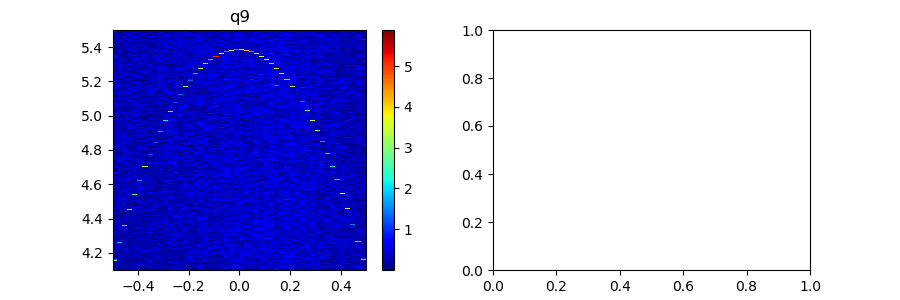

['q9'] 2020-11-07 03:22:14.055657


In [35]:
value,num,tags,finishtime = write(height=3,title='spec2d_awg',which=15,peak=300,transposition=True)
print(tags,finishtime)

In [36]:
np.savez(r'q9.npz',rows=value[0][0],cols=value[0][1],s=value[0][2])

In [33]:
data, ID, comment, tags, name, finishtime = read(title='spec2d',which=5)
print(finishtime)
data[1][:]

2020-11-05 15:00:46.936593


array([array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array([[4.600e+09],
       [4.601e+09],
       [4.602e+09],
       ...,
       [5.948e+09],
       [5.949e+09],
       [5.950e+09]]),
       array(

In [34]:
target = eval(tags[0][1:])
target = 1
v, f, s = value[target-1][0][:], value[target-1][1][:], value[target-1][2][:,:]
# s = s[1:,:]
peak = (np.max(np.abs(s))+np.min(np.abs(s))) / 2
# f,v,A, C, W, phi = op.Spec2d_Fit(peak=peak).fitSpec2d(v,f,s,classify=False)
f, v, voffset, vperiod, ejs, ec, d = op.Spec2d_Fit(peak=peak).fitSpec2d(v,f,np.abs(s),classify=False)
v1 = np.linspace((min(v)-np.abs((max(v)-min(v))/2)),(max(v)+np.abs((max(v)-min(v))/2)),1001)
# z = np.sqrt(A*np.abs(np.cos(W*v1+phi))) + C
tmp = np.pi*(v1-voffset)/vperiod
z = np.sqrt(8*ejs*ec*np.abs(np.cos(tmp))*np.sqrt(1+d**2*np.tan(tmp)**2))-ec
tmp_s = np.pi*(x-voffset)/vperiod
y = sy.sqrt(8*ejs*ec*sy.Abs(sy.cos(tmp_s))*sy.sqrt(1+d**2*sy.tan(tmp_s)**2))-ec
specfunc[tags[0]] = [y,voffset, vperiod, ejs, ec, d]
print(specfunc)
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[target-1].scatter(v,f,marker='.',c='',edgecolors='m')
ax[target-1].plot(v1,z,'y--')
ax[target-1].hlines(np.max(z),np.max(v),np.min(v),'w',label=f'w_max={round(np.max(z),3)}GHz')
ax[target-1].legend(loc='best',fontsize='xx-small')
plt.show()

NameError: name 'x' is not defined

In [ ]:
func = specfunc[tags[0]][0]
y = sy.lambdify(x,func,'numpy')
v_new = np.linspace(min(v[v<voffset]),max(v[v<voffset]),250000)
func = scipy.interpolate.interp1d(y(v_new),v_new )
specinterp[tags[0]] = [y(v_new),func(y(v_new))]
plt.figure()
plt.plot(f,v)
plt.plot(y(v_new),func(y(v_new)))

In [ ]:
bit = [q5,q6]
for i, j in enumerate(bit):
    j.specfuncz=specfunc[j.q_name]
    j.specinterp=specinterp[j.q_name]

In [ ]:
specfunc

In [ ]:
voffset, vperiod, ejs, ec, d

In [ ]:
z = np.abs(value[0][2][:36,:])
s = [i if (i.mean()>10) else (i+8) for i in z]
extent = [min(value[0][1]),max(value[0][1]),min(value[0][0][:36]),250*max(value[0][0][:36])]
plt.figure()
plt.imshow(s,aspect='auto',origin='lower',extent=extent)
plt.xlabel('Ex Freq/GHz')
plt.ylabel('modulation Amp/mV')
plt.title('drive freq = 120MHz')

In [ ]:
plt.figure()
plt.plot(value[0][1],np.abs(value[0][2][20]))
plt.show()

In [ ]:
voffset, vperiod, ejs, ec, d

<IPython.core.display.Javascript object>


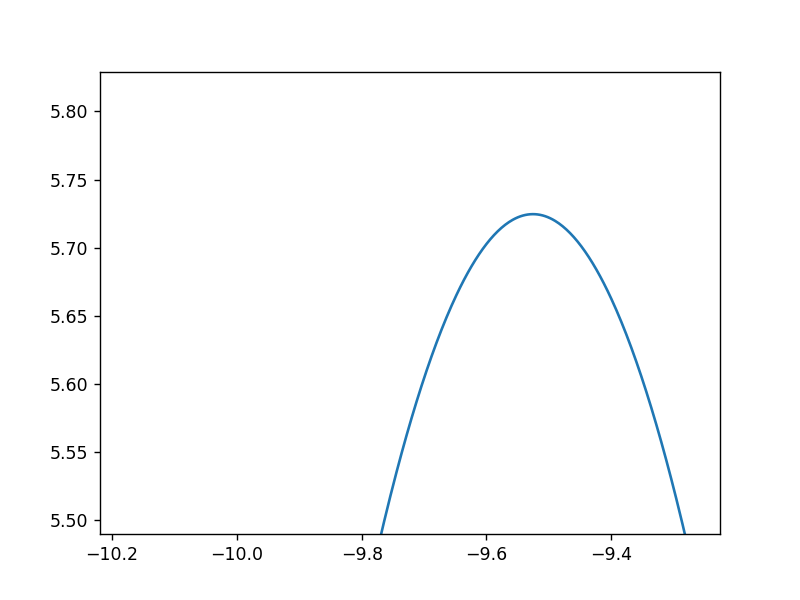

In [139]:
plt.figure()
v1 = np.linspace(-10,10,10001)
tmp = np.pi*(v1-voffset)/vperiod
z = np.sqrt(8*ejs*ec*np.abs(np.cos(tmp))*np.sqrt(1+d**2*np.tan(tmp)**2))-ec
plt.plot(v1,z)

In [306]:
np.shape(value[0][1])

(201,)

In [303]:
bit = [q1,q2,q3,q4,q5,q6,q7]
for i, j in enumerate(bit):
    globals()['q%d'%(i+1)] = j._replace(specfunc=specfunc['q%d'%(i+1)])

<IPython.core.display.Javascript object>


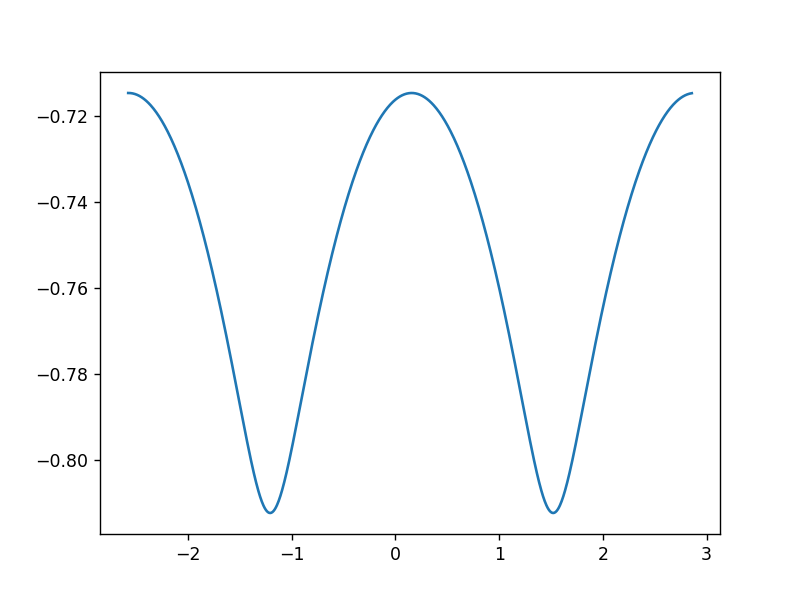

In [361]:
q = q2
func = q.specfunc
y = sy.lambdify(x,func,'numpy')
current = np.linspace(-q.T_bias[0],q.T_bias[0],1001) + q.T_bias[1] 
plt.figure()
plt.plot(current,y(current))
plt.show()

## 能级分布

In [459]:

alpha, f01 = [], []
for i in range(10):
    alpha.append(round(globals()['q%d'%(i+1)].alpha/1e9,3))
    f01.append(round(globals()['q%d'%(i+1)].f_ex/1e9,3))
alpha,f01

([0.204, 0.246, 0.201, 0.26, 0.216, 0.202, 0.256, 0.246, 0.206, 0.252],
 [4.865, 5.649, 5.283, 4.781, 5.123, 5.395, 4.93, 5.711, 4.738, 5.491])

<IPython.core.display.Javascript object>


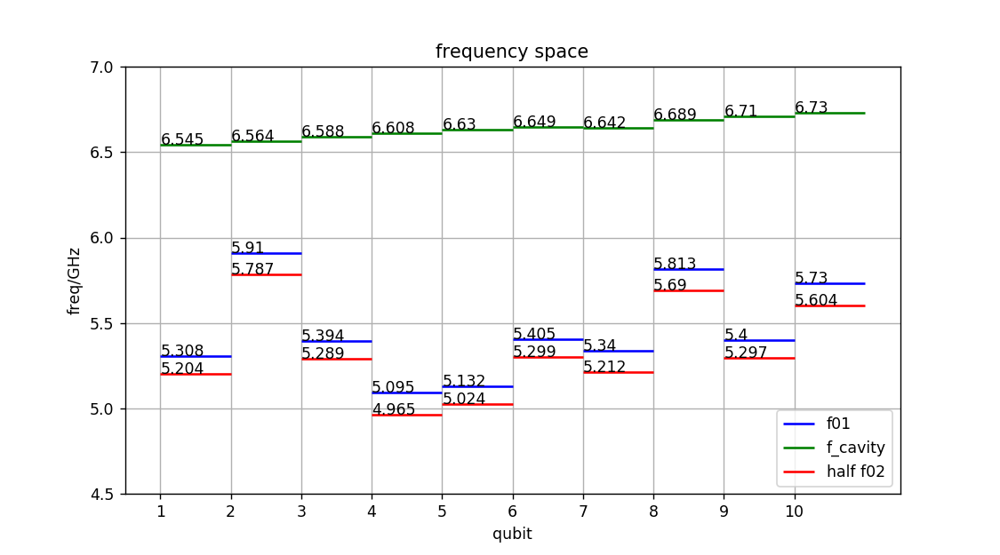

In [889]:
freqall = np.array([6.545, 6.564, 6.588, 6.608, 6.63, 6.649, 6.642, 6.689, 6.71, 6.73])
w01 = np.array([5.308,5.91,5.394,5.095,5.132,5.405,5.34,5.813,5.4,5.73])
# w01_diff = np.diff(w01)
qnum = np.linspace(1,10,10)
plt.figure(figsize=(9,5))
plt.hlines(w01,qnum,(qnum+1),'b',label='f01')
plt.hlines(freqall,qnum,(qnum+1),'g',label='f_cavity')
plt.hlines(np.round(w01-np.array(alpha)/2,3),qnum,(qnum+1),'r',label='half f02')
# plt.vlines(qnum[1:],w01[:-1],w01[1:],color='y',alpha=0.5)
plt.ylim(4.5,7)
for i, j in zip(qnum,w01):
    plt.text(i,j,str(j))
for i, j in zip(qnum,np.round(w01-np.array(alpha)/2,3)):
    plt.text(i,j,str(j))
for i, j in zip(qnum,freqall):
    plt.text(i,j,str(j))
plt.grid(which='both')
plt.ylabel('freq/GHz')
plt.xlabel('qubit')
plt.xticks(qnum)
plt.title('frequency space')
plt.legend(loc='lower right')
plt.show()

<IPython.core.display.Javascript object>


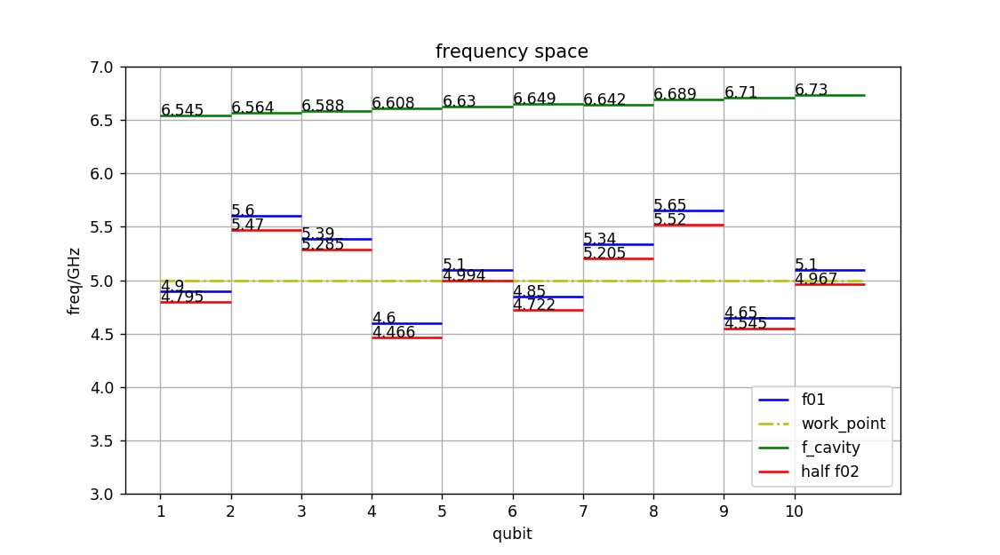

In [1531]:
freqall = np.array([6.545, 6.564, 6.588, 6.608, 6.63, 6.649, 6.642, 6.689, 6.71, 6.73])
w01 = np.array([4.9,5.6,5.39,4.6,5.1,4.85,5.34,5.65,4.65,5.1])
# w01_diff = np.diff(w01)
qnum = np.linspace(1,10,10)
plt.figure(figsize=(9,5))
plt.hlines(w01,qnum,(qnum+1),'b',label='f01')
plt.hlines(5,min(qnum),max(qnum+1),'y',label='work_point',linestyles='dashdot')
plt.hlines(freqall,qnum,(qnum+1),'g',label='f_cavity')
plt.hlines(np.round(w01-np.array(ec)/2,3),qnum,(qnum+1),'r',label='half f02')
# plt.vlines(qnum[1:],w01[:-1],w01[1:],color='y',alpha=0.5)
plt.ylim(3,7)
for i, j in zip(qnum,w01):
    plt.text(i,j,str(j))
for i, j in zip(qnum,np.round(w01-np.array(ec)/2,3)):
    plt.text(i,j,str(j))
for i, j in zip(qnum,freqall):
    plt.text(i,j,str(j))
plt.grid(which='both')
plt.ylabel('freq/GHz')
plt.xlabel('qubit')
plt.xticks(qnum)
plt.title('frequency space')
plt.legend(loc='lower right')
plt.show()

<IPython.core.display.Javascript object>


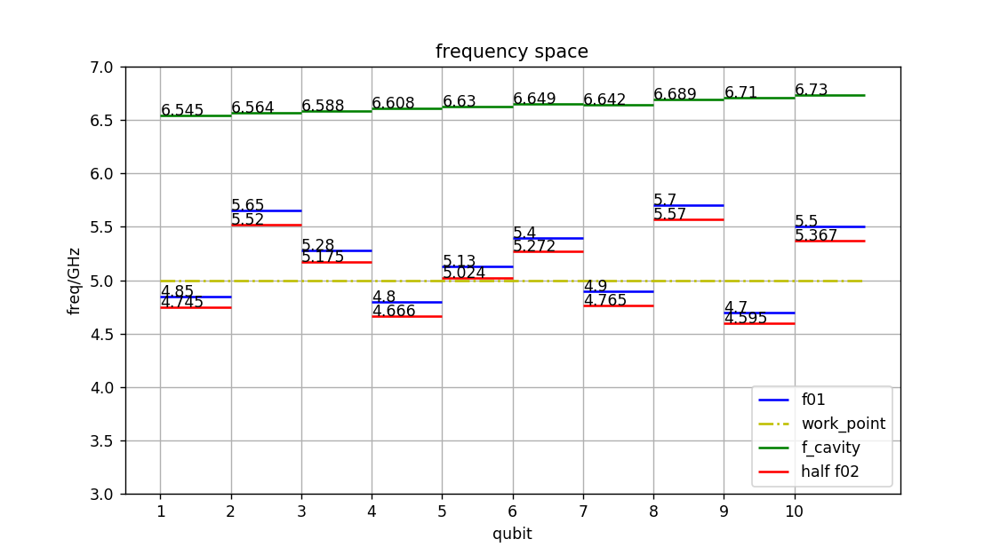

In [1529]:
freqall = np.array([6.545, 6.564, 6.588, 6.608, 6.63, 6.649, 6.642, 6.689, 6.71, 6.73])
w01 = np.array([4.85,5.65,5.28,4.8,5.13,5.4,4.9,5.7,4.7,5.5])
# w01_diff = np.diff(w01)
qnum = np.linspace(1,10,10)
plt.figure(figsize=(9,5))
plt.hlines(w01,qnum,(qnum+1),'b',label='f01')
plt.hlines(5,min(qnum),max(qnum+1),'y',label='work_point',linestyles='dashdot')
plt.hlines(freqall,qnum,(qnum+1),'g',label='f_cavity')
plt.hlines(np.round(w01-np.array(ec)/2,3),qnum,(qnum+1),'r',label='half f02')
# plt.vlines(qnum[1:],w01[:-1],w01[1:],color='y',alpha=0.5)
plt.ylim(3,7)
for i, j in zip(qnum,w01):
    plt.text(i,j,str(j))
for i, j in zip(qnum,np.round(w01-np.array(ec)/2,3)):
    plt.text(i,j,str(j))
for i, j in zip(qnum,freqall):
    plt.text(i,j,str(j))
plt.grid(which='both')
plt.ylabel('freq/GHz')
plt.xlabel('qubit')
plt.xticks(qnum)
plt.title('frequency space')
plt.legend(loc='lower right')
plt.show()

<IPython.core.display.Javascript object>


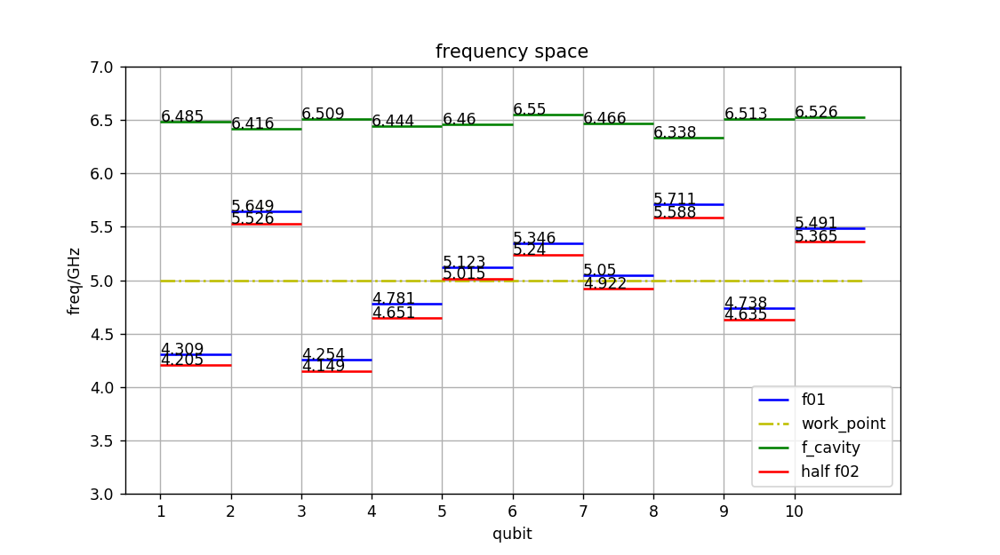

In [887]:
alpha, w01, fread = [], [], []
for i in range(10):
    alpha.append(round(globals()['q%d'%(i+1)].alpha/1e9,3))
    w01.append(round(globals()['q%d'%(i+1)].f_ex/1e9,3))
    fread.append(round((globals()['q%d'%(i+1)].f_lo[0]-50e6)/1e9,3))
qnum = np.linspace(1,10,10)
plt.figure(figsize=(9,5))
plt.hlines(w01,qnum,(qnum+1),'b',label='f01')
plt.hlines(5,min(qnum),max(qnum+1),'y',label='work_point',linestyles='dashdot')
plt.hlines(fread,qnum,(qnum+1),'g',label='f_cavity')
plt.hlines(np.round(w01-np.array(alpha)/2,3),qnum,(qnum+1),'r',label='half f02')
# plt.vlines(qnum[1:],w01[:-1],w01[1:],color='y',alpha=0.5)
plt.ylim(3,7)
for i, j in zip(qnum,w01):
    plt.text(i,j,str(j))
for i, j in zip(qnum,np.round(w01-np.array(alpha)/2,3)):
    plt.text(i,j,str(j))
for i, j in zip(qnum,fread):
    plt.text(i,j,str(j))
plt.grid(which='both')
plt.ylabel('freq/GHz')
plt.xlabel('qubit')
plt.xticks(qnum)
plt.title('frequency space')
plt.legend(loc='lower right')
plt.show()

In [463]:
alpha, w01, fread

([0.204, 0.246, 0.201, 0.26, 0.216, 0.202, 0.256, 0.246, 0.206, 0.252],
 [],
 [6.485, 6.416, 6.509, 6.444, 6.46, 6.55, 6.466, 6.338, 6.513, 6.526])

# 拟合调制曲线找周期

In [161]:
n = 10
Tlist = {}
matrix_cross = np.eye(n) #收集crosstalk矩阵元
matrix_phi = np.eye(n)
specfunc = {}
x = sy.Symbol('x',real=True)

<IPython.core.display.Javascript object>


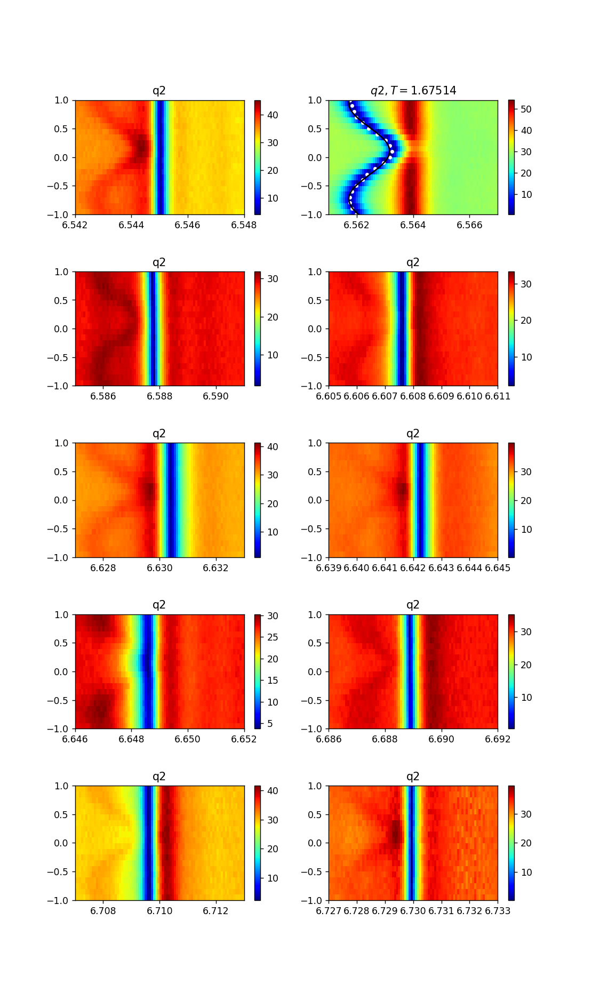

['q2'] 2020-11-23 20:10:50.100079


In [195]:
value,num,tags,finishtime = write(height=3,title='S21vsFlux_awgoffset',which=0,peak=1000) #S21vsFlux_awgoffset
print(tags,finishtime)

In [566]:
tags = ['q7']

In [81]:
def moving_average(interval, window_size):
    window = np.ones(int(window_size)) / float(window_size)
    return np.convolve(interval, window, 'same')  # numpy的卷积函数

In [196]:
def fit_spec():
    n_target = eval(tags[0][1:])
    volt, freq, s = value[n_target-1]
    volt, s = volt[0:], -np.abs(s[0:,:])
    peak = (np.max(s)+np.min(s)) / 2
    f,v,voffset, vperiod, ejs, ec, d, g, fc = op.Cavitymodulation_Fit(peak=peak).fitCavitymodulation(volt,freq,s,classify=False)
    print('voffset, vperiod, ejs, ec, d, g, fc',voffset, vperiod, ejs, ec, d, g, fc)
    v1 = np.linspace(min(v),max(v),1001)
    tmp = np.pi*(v1-voffset)/vperiod
    f01 = np.sqrt(8*ejs*ec*np.abs(np.cos(tmp))*np.sqrt(1+d**2*np.tan(tmp)**2))-ec
    z = (fc+f01+np.sqrt(4*g**2+(f01-fc)**2))/2
    voffset = op.RowToRipe().firstMax(v1,z,num=0,peakpercent=0.9,insitu=True)
    print(voffset)
#     globals()[f'q{n_target}'].T_bias.append((vperiod, voffset))
    tmp_s = np.pi*(x-voffset)/vperiod
    y01 = sy.sqrt(8*ejs*ec*sy.Abs(sy.cos(tmp_s))*sy.sqrt(1+d**2*sy.tan(tmp_s)**2))-ec
    y = (fc+y01+sy.sqrt(4*g**2+(y01-fc)**2))/2
    specfunc[tags[0]] = y
    globals()[f'q{n_target}'].specfunc = y01
    globals()[f'q{n_target}'].specfunc_cavity = y
    fig = plt.gcf() 
    axes = plt.getp(fig,'axes')
    axes[n_target-1].plot(f,v,'w.')
    axes[n_target-1].plot(z,v1,'-k')
#     Tlist[tags[0]] = [round(np.abs(vperiod),3),voffset]
    axes[n_target-1].set_title(r'$ q%d,T = %g$' %(n_target,vperiod))
fit_spec()
print(specfunc)

[0.1, 1.6753278203223403, 9.926915625, 0.656325, 0, 0.656325, 6.562317857142856]
voffset, vperiod, ejs, ec, d, g, fc 0.10674322844844047 1.6751371175201517 2.95702983645208 0.9153033647368868 0.9801246637769534 0.5109388195092825 6.470761935733298
0.106
{'q10': sqrt((1.51344959922872*(0.938575005349587*tan(1.69561542080395*x - 0.176344003763611)**2 + 1)**(1/4)*sqrt(Abs(cos(1.69561542080395*x - 0.176344003763611))) - 7.08850686704601)**2 + 6.70590991566766)/2 + 0.756724799614359*(0.938575005349587*tan(1.69561542080395*x - 0.176344003763611)**2 + 1)**(1/4)*sqrt(Abs(cos(1.69561542080395*x - 0.176344003763611))) + 2.89954631998389, 'q9': sqrt((1.62423012061593*(0.849564564589337*tan(1.88780281178441*x + 0.226536337414129)**2 + 1)**(1/4)*sqrt(Abs(cos(1.88780281178441*x + 0.226536337414129))) - 6.80476916446452)**2 + 1.74871447894034)/2 + 0.812115060307967*(0.849564564589337*tan(1.88780281178441*x + 0.226536337414129)**2 + 1)**(1/4)*sqrt(Abs(cos(1.88780281178441*x + 0.226536337414129))) + 3.

In [197]:
q2.specfuncz[1] = 0.10674322844844047

<IPython.core.display.Javascript object>


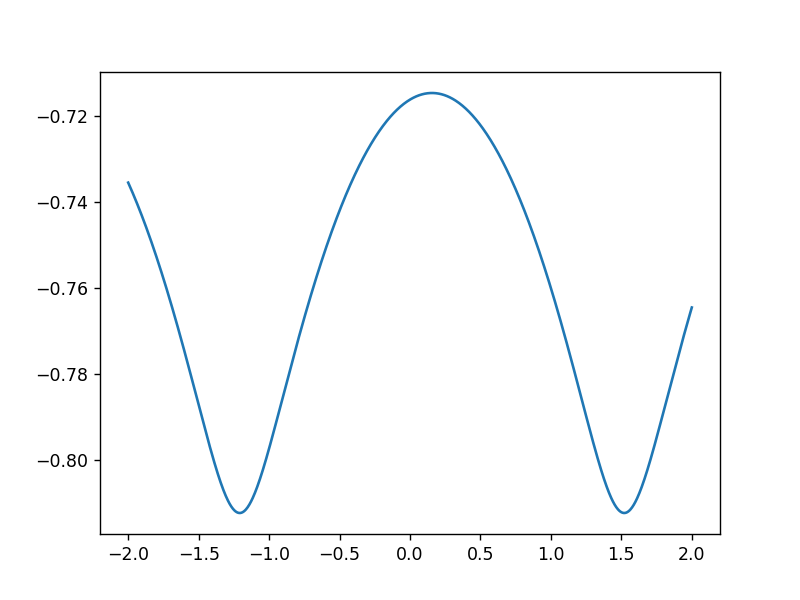

In [177]:
x = sy.Symbol('x')
f = q2.specfunc
y = sy.lambdify(x,f,'numpy')
t = np.linspace(-2,2,1001)
plt.figure()
plt.plot(t,y(t))

In [85]:
@jit
def fit_cos(tag):
    mat = []
    At = 0
    for i in range(len(value)):
        volt, freq, s = value[i]
        volt, s = volt[:], s[:,:]
        x, y = op.RowToRipe().manipulation(volt,freq,s)
#         y = moving_average(y,5)
#         x, y = x[3:-3], y[3:-3]
        A, C, W, phi = op.Cos_Fit().fitCos(x,y)
        T = 1 / W
        fig = plt.gcf() 
        axes = plt.getp(fig,'axes')
        axes[i].plot(y,x,'ro')
        x1 = np.linspace(min(volt),max(volt),1001)
        y1 = A*np.cos(2*np.pi/T*x1+phi)
        axes[i].plot(y1+C,x1,'b-')
        #if i != int(tag[2:]) - 1:
        t = symbols("t")
        z = A*sy.cos(2*np.pi/T*t+phi)+C
        z_diff = diff(z,t)
        if z_diff.evalf(subs = {t:0}) < 0:
            T *= -1
            if phi<0:
                phi *= -1
        phi = phi % (2*np.pi)
        mat.append((1/T,phi))
        if i == int(tag[2:]) - 1:
            bias0 = op.RowToRipe().firstMax(x1,y1,num=0)
            Tlist[tags[0]] = [round(np.abs(T),3),bias0]
        axes[i].set_title(r'$ q%d,T = %g,phi=%g $' %(i+1,T,phi))
    return mat
        

In [95]:
n_target = eval(tags[0][1:])
mat = fit_cos(tag='q_%d'%n_target)
# matrix_cross[:7,n_target-1] = np.array(mat)[:,0]
# matrix_phi[:7,n_target-1] = np.array(mat)[:,1]
Tlist

{'q10': [1.787, 0.056]}

In [97]:
q10.T_z = [1.787, 0.056]

In [96]:
q2.T_z

[1.663, 0.108]

In [778]:
Tlist = {'q10': [2.966, 0.068],
 'q9': [2.631, -0.184],
 'q8': [3.088, -0.412],
 'q7': [2.659, 0.216],
 'q6': [3.021, -0.068],
 'q5': [2.656, 0.164],
 'q4': [2.674, 0.19],
 'q3': [2.703, 0.16],
 'q2': [2.692, 0.164],
 'q1': [3.345, -0.284]}

{}

In [280]:
Tlist = {'q10': [3.029, 0.281],
 'q9': [2.639, -0.151],
 'q8': [3.104, -0.317],
 'q7': [2.643, 0.166],
 'q6': [3.045, -0.036],
 'q5': [2.666, 0.156],
 'q4': [2.706, 0.146],
 'q3': [2.704, 0.125],
 'q2': [2.717, 0.14],
 'q1': [3.364, -0.229]}

In [450]:
for i in range(10):
    globals()[f'q{i+1}'].T_bias = Tlist[f'q{i+1}']

In [139]:
q1.T_bias 

[3.319, -0.284]

In [187]:
matrix_cross[3,n_target-1] = -1/60
# matrix_phi[0,n_target-1] = 0
matrix_cross

array([[ 0.        ,  0.        ,  0.        ,  0.        , -0.01886792,
        -0.04048476, -0.04381544,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , -0.01646792,
        -0.04206386, -0.04478635,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , -0.01666667,
        -0.03207076, -0.04327996,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , -0.01666667,
        -0.03083636, -0.04220373,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.55179184,
        -0.02814003, -0.03893577,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.02317556,
        -0.56072143, -0.04623969,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.01855807,
         0.01428571, -0.55296654,  0.        

In [229]:
# I0 = -np.mat(matrix_cross).I*np.mat(matrix_phi).mean(axis=1)/2/const.pi
# mat_crosstalk = np.mat([matrix_cross[:,i]/matrix_cross[i,i] if matrix_cross[i][i]!=0 else matrix_cross[i,i]\
#                  for i in range(len(matrix_cross))])
#最终加在qubits上的电流为I = mat_crosstalk.I*[0,0,0,0,1]+I0
save('crosstalk_cali','q1-q7',mat=mat_crosstalk)

In [240]:
for i in range(10):
    if matrix_cross[i][i]!=0:
        mat_crosstalk[:,i] = matrix_cross[:,i]/matrix_cross[i,i] 
    mat_crosstalk[i,i] = 1
    
save('crosstalk_cali','q1-q7',mat=mat_crosstalk)

WindowsPath('D:/QuLabData/2020/0624/crosstalk_cali/q1-q7_20200624171927.npz')

In [241]:
mat_crosstalk

array([[ 1.        ,  0.        ,  0.02081242, -0.00556228, -0.03419392,
         0.0722012 ,  0.07923705,  0.        ,  0.        ,  0.        ],
       [-0.11087751,  1.        ,  0.00911005, -0.03760278, -0.02984445,
         0.07501739,  0.08099287,  0.        ,  0.        ,  0.        ],
       [-0.09237872,  0.        ,  1.        , -0.02808258, -0.03020463,
         0.05719553,  0.07826868,  0.        ,  0.        ,  0.        ],
       [-0.09966487,  0.        ,  0.08454681,  1.        , -0.03020463,
         0.05499408,  0.0763224 ,  0.        ,  0.        ,  0.        ],
       [-0.07804834,  0.        ,  0.07193357, -0.06137783,  1.        ,
         0.0501854 ,  0.07041253,  0.        ,  0.        ,  0.        ],
       [-0.08190848,  0.        ,  0.10309907, -0.06923761,  0.04200055,
         1.        ,  0.08362114,  0.        ,  0.        ,  0.        ],
       [-0.06118311,  0.        ,  0.07212722, -0.06237858,  0.03363237,
        -0.02547738,  1.        ,  0.        

In [100]:
bit = [q1,q3,q6,q8,q10]
for i, j in enumerate(bit,start=0):
    globals()['q%d'%(i+1)] = j._replace(T_bias=Tlist['q%d'%(i+1)])

KeyError: 'q2'

In [849]:
voffset = -0.049585349572415706

In [850]:
q6.specfuncz[1] = voffset

In [456]:
dt.specshift(q3.specfuncz,4.254,bias=0.4,side='lower')

(5.358082419340422, -0.07852106527056152)

In [105]:
q8 = q8._replace(T_bias=[1.844, 0.556])

# 拟合T1

<IPython.core.display.Javascript object>


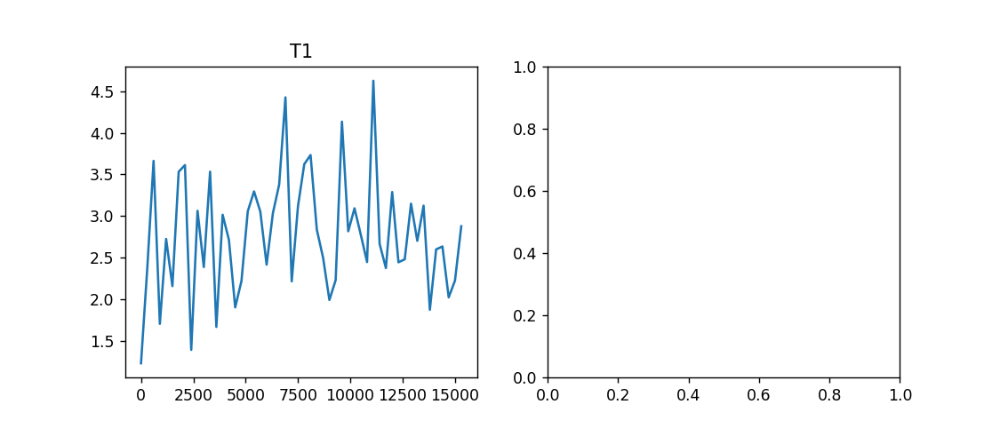

['q1'] 2020-09-14 23:31:31.704727


In [28]:
value,num,tags, finishtime = write(height=4,title='T1',which=0)
print(tags,finishtime)

In [357]:
tag = ''
for i in tags:
    tag += i
save('T1',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=value[0][0],col=value[0][1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/T1/q6_20200824172031.npz')

In [75]:
x, y = value[0][0], value[0][1]
A, B, T1 = op.Exp_Fit().fitExp(x,np.abs(y))
z = A * np.exp(-x*T1) + B
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,z)
ax[0].set_title('$T_{1}=%.2fus$'%(1/T1/1e3))
ax[i].set_xlabel('time / ns')
ax[i].set_ylabel('Voltage / a.u.')
plt.show()

In [218]:
10**4.6

39810.71705534969

# 二维T1

In [1165]:
value,num,tags, finishtime = write(height=4,title='vRabi',which=0)
print(tags,finishtime)

In [1064]:
# x, y, s = value[0][0],value[0][1], value[0][2]
# t1 = []
# for i in range(len(x)):
#     A, B, T1 = op.Exp_Fit().fitExp(y,np.abs(s[i]))
#     t1.append(round(1/T1/1e3,2))
# fig = plt.gcf()
# ax = plt.getp(fig,'axes')
# ax[1].plot(x,t1,'ro')
# ax[1].hlines(np.mean(t1),np.max(x),np.min(x),'k','--')
# ax[1].set_title('T1_mean=%.2f us'%np.mean(t1))
# plt.show()

In [2362]:
t = np.linspace(-10,10,1001)
np.fi
# plt.figure()
# plt.plot(t,(scipy.special.erf((t-50)/1)-1)/2*0.8)

AttributeError: module 'numpy' has no attribute 'find_nearest'

In [1982]:
scipy.special.jv(0,1.94),scipy.special.jv(0,2.85)

(0.25859585990111394, -0.20510239059047372)

In [2361]:
y = lambda t: (-1-scipy.special.erf((t-4990)/2))/2*0.8
y(4990)

-0.4

# 真空拉比

<IPython.core.display.Javascript object>


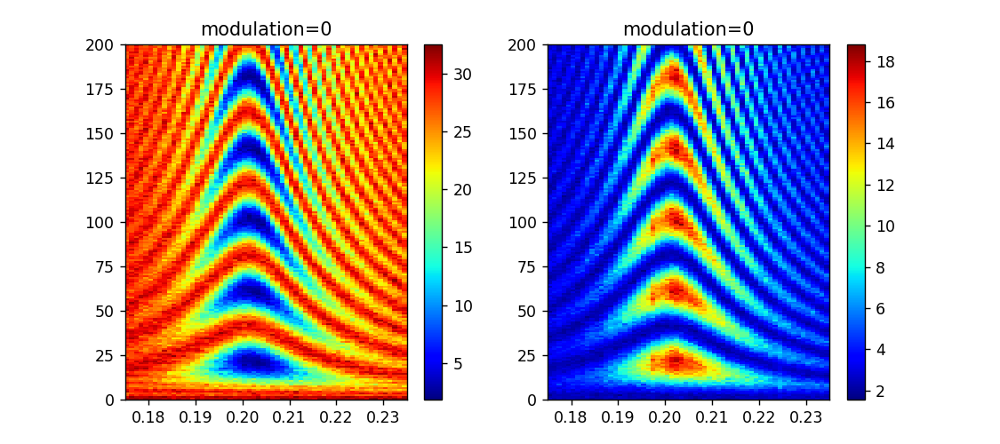

['modulation=0', 'dc-q6', 'ex-q6'] 2020-11-21 17:54:07.565630


In [897]:
value,num,tags, finishtime = write(height=4,title='vRabi',which=0,transposition=True)
print(tags,finishtime)

In [1138]:
np.shape(s)

(55, 1200)

<IPython.core.display.Javascript object>


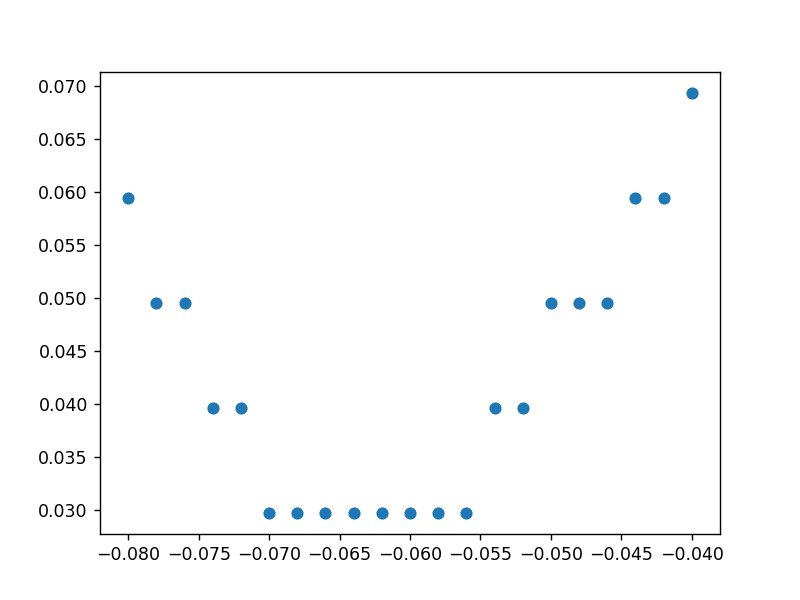

In [68]:
x, y, s = value[0][0][0:],value[0][1][:], np.abs(value[0][2])[0:,:]
w, f, P = op.RowToRipe().spectrum(y,s,axis=1,shift=False)
plt.figure()
plt.plot(x,np.array(w),'o')
# plt.plot(x,op.RowToRipe().smooth(w,0.3))

<IPython.core.display.Javascript object>


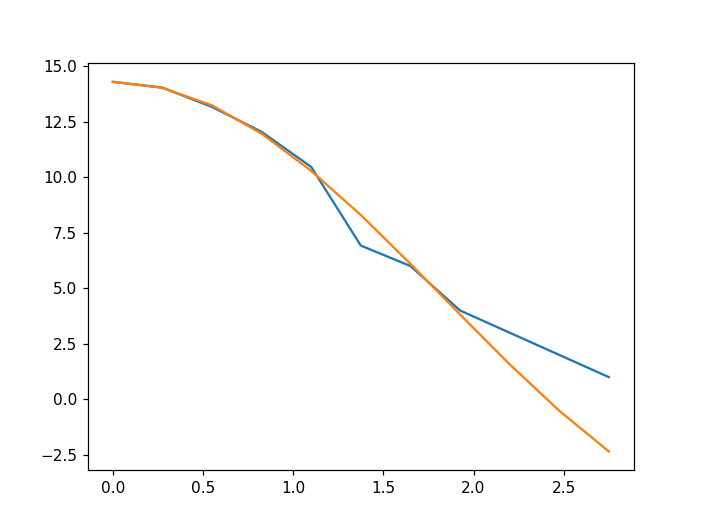

In [9]:
from scipy import special
plt.figure()
x = np.array(v)*5.5
plt.plot(x,g)
plt.plot(x,special.jv(0,x)*np.max(g))

In [1596]:
np.array(v)*5.5

array([0.   , 0.275, 0.55 , 0.825, 1.1  , 1.375, 1.65 , 1.925, 2.2  ,
       2.475, 2.75 ])

In [1598]:
v

[0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

In [8]:
g, v = [14.29,14.03,13.16,12.04,10.46,6.92,6,4,3,2,1], [0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [2711]:
x, y = x,np.array(w)
g, A0, Z0 = op.Vcrabi_fit().fitVcrabi(x,y)
print(g, A0, Z0)
z = np.sqrt(4*(g)**2+A0**2*(x-Z0)**2)
# res, func = op.Exp_Fit().poly(x,y,2)
# z = func(x)
fig = plt.gcf()
ax = plt.getp(fig,'axes')
ax[0].plot(x,z,'r-.',markersize=2)
ax[0].set_title('%s,$g=%.2fMHz$'%(tags[0],g*1e3))
ax[0].set_xlabel('V/a.u.')
ax[0].set_ylabel('Freq / GHz')
plt.show()

0.013921315270384425 -2.764224091570992 -0.06251208456151668


<IPython.core.display.Javascript object>


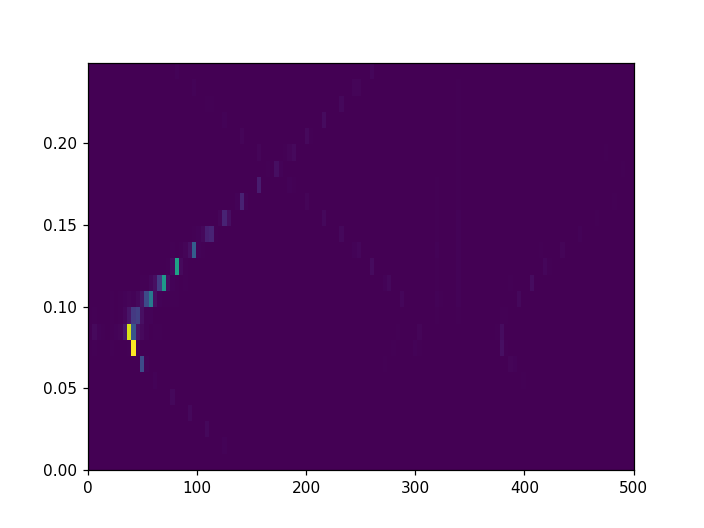

In [1469]:
# x, y, s = value[1][0],value[1][1], value[1][2]
x, y, s = f, y, P
plt.figure()
extent = [min(y),max(y),min(x),max(x)]
plt.imshow(np.abs(P),aspect='auto',origin='lower',extent=extent)
plt.show()

In [1243]:
g, A0, Z0

(0.014690901026867983, 3.024436291178022, 0.040463763699795124)

# 纵场调制

<IPython.core.display.Javascript object>


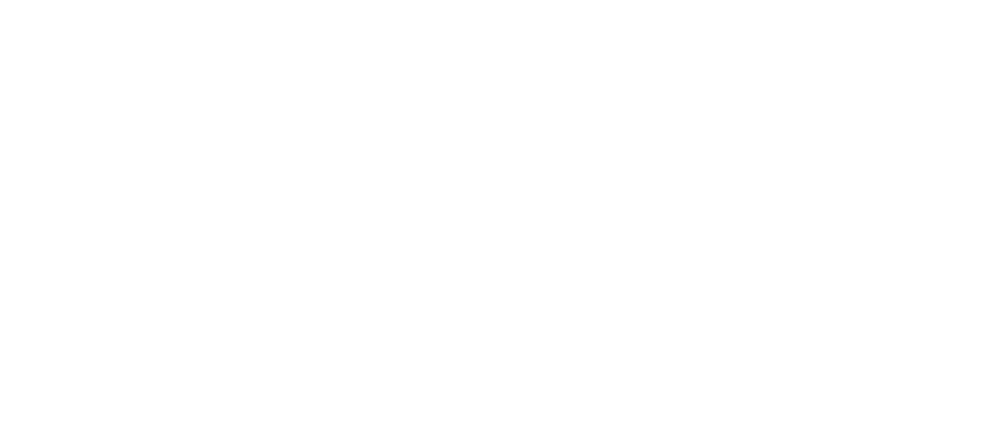

['dc-q10', 'ex-q9'] 2020-11-08 09:35:51.790311


In [1147]:
value,num,tags, finishtime = write(height=4,title='vModulation_pop',which=7,transposition=False)
print(tags,finishtime)

<IPython.core.display.Javascript object>


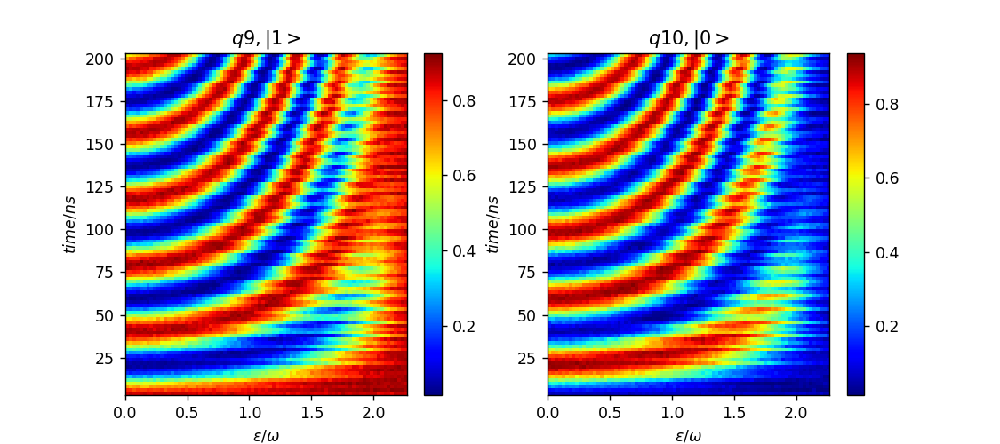

In [754]:
fig, axes = plt.subplots(ncols=2,nrows=1,figsize=(9,4))
im = []
for i in range(2):
    x, y, s = value[i][0],value[i][1],np.abs(value[i][2])
    extent = [min(y)*0.68/0.12,max(y)*0.68/0.12,min(x),max(x)]
    im0 = axes[i].imshow(s,extent=extent,aspect='auto',origin='lower',cmap='jet',label=f'modulation freq={120}MHz')
    im.append(im0)
    axes[i].set_xlabel('$\epsilon/\omega$')
    axes[i].set_ylabel('$time/ns$')
    axes[i].set_title(f'$q{i+9},|{1-i}>$')
plt.colorbar(im[0],ax=axes[0])
plt.colorbar(im[1],ax=axes[1])
#     axes[i].legend(loc='best')
plt.show()

In [718]:
x, y, s = value[0][0],value[0][1],np.abs(value[0][2][:,:-20])
w = []
for i in range(len(y)):
    ybar_m = op.RowToRipe().smooth(s[:,i],f0=0.1)
    xnew, ynew = op.RowToRipe().resample(x,ybar_m,1001)
    A, C, W, phi = op.Cos_Fit().fitCos(xnew,ynew)
    w.append(W)
# plt.figure()
# ybar = np.array(ybar).T
# plt.imshow(ybar,origin='lower',aspect='auto')

IndexError: index 61 is out of bounds for axis 1 with size 61

<IPython.core.display.Javascript object>


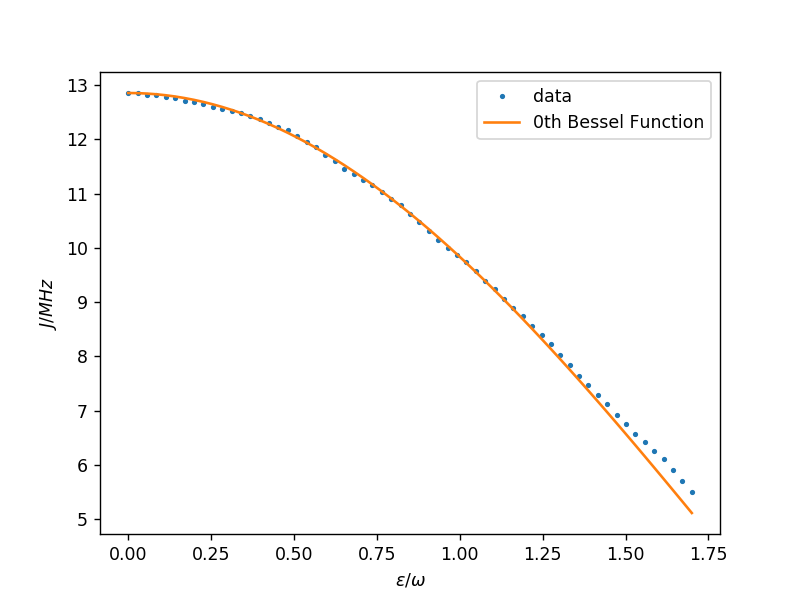

In [753]:
from scipy import special
w = np.array(w)
ynew = y[:-20]*0.68/0.12
plt.figure()
plt.plot(ynew,w*1e3/2,'o',markersize=2,label='data')
plt.plot(ynew,w[0]*1e3/2*np.abs(special.jv(0,ynew)),label='0th Bessel Function')
plt.xlabel('$\epsilon/\omega$')
plt.ylabel('$J/MHz$')
plt.legend(loc='best')

<IPython.core.display.Javascript object>


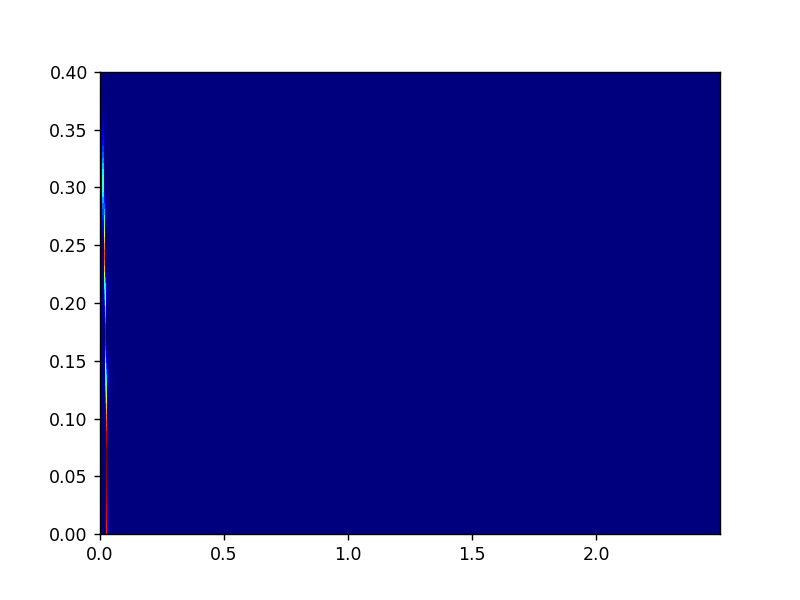

In [678]:
w,f,Pxx = op.RowToRipe().spectrum(xnew,ybar,axis=0,shift=False)
plt.figure()
extent = [min(f),max(f),min(y),max(y)]
plt.imshow(np.abs(Pxx).T,aspect='auto',extent=extent,origin='lower',cmap='jet')

In [618]:
np.max(Pxx),np.mean(Pxx)

(17.72216957428018, 0.0025766969748642833)

<IPython.core.display.Javascript object>


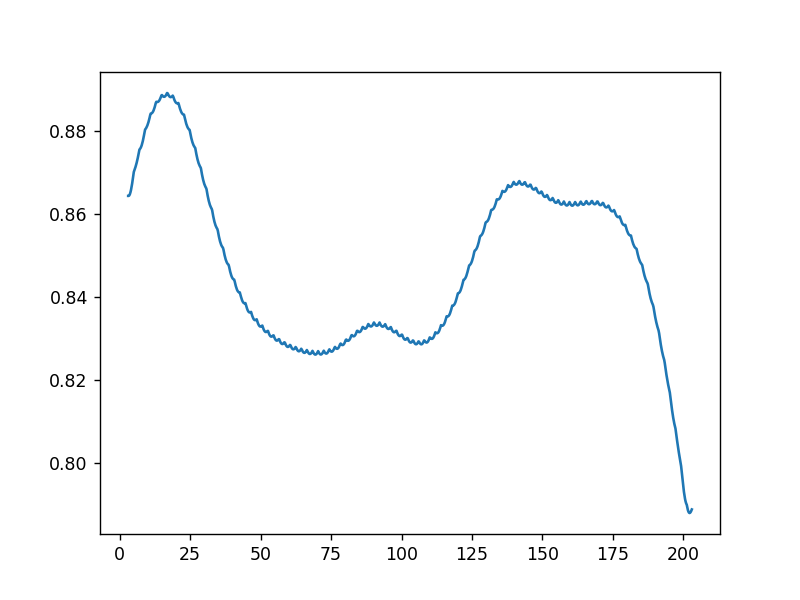

In [716]:
plt.figure()
# x, y = value[0][0],np.abs(value[0][2][:,-20])
# xnew, ynew = op.RowToRipe().resample(x,y,1001)
# ybar = op.RowToRipe().smooth(y,f0=0.1)
plt.plot(xnew,ynew)
# plt.plot(xnew,ynew)
# plt.plot(x,ybar)

<IPython.core.display.Javascript object>


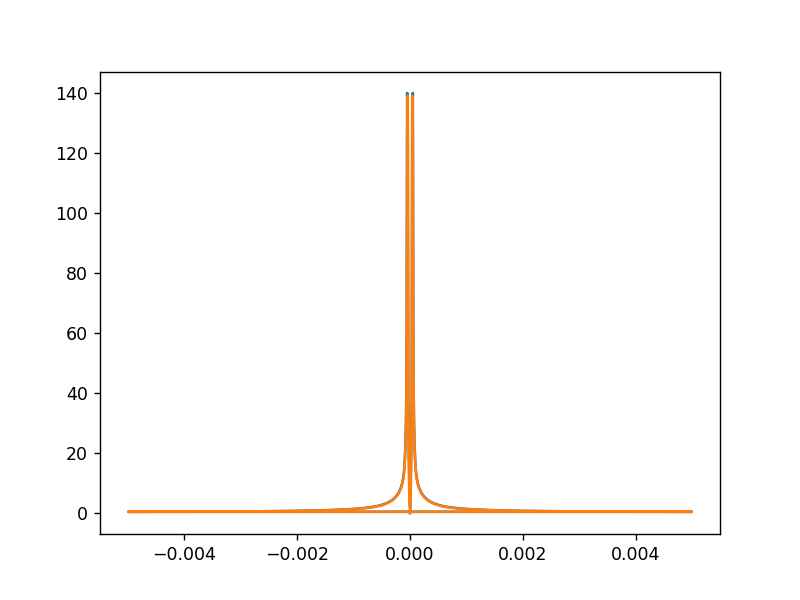

In [688]:
# x, y ,s = value[0][0],value[0][1], np.abs(value[1][2])
w,f1,Pxx1 = op.RowToRipe().fourier(xnew,ybar[:,26],axis=0,shift=False)
w2,f2,Pxx2 = op.RowToRipe().fourier(xnew,ybar[:,27],axis=0,shift=False)
plt.figure()
# plt.plot(y,w*1e3/2,'-o')
plt.plot(f1,np.abs(Pxx1))
plt.plot(f2,np.abs(Pxx2))

<IPython.core.display.Javascript object>


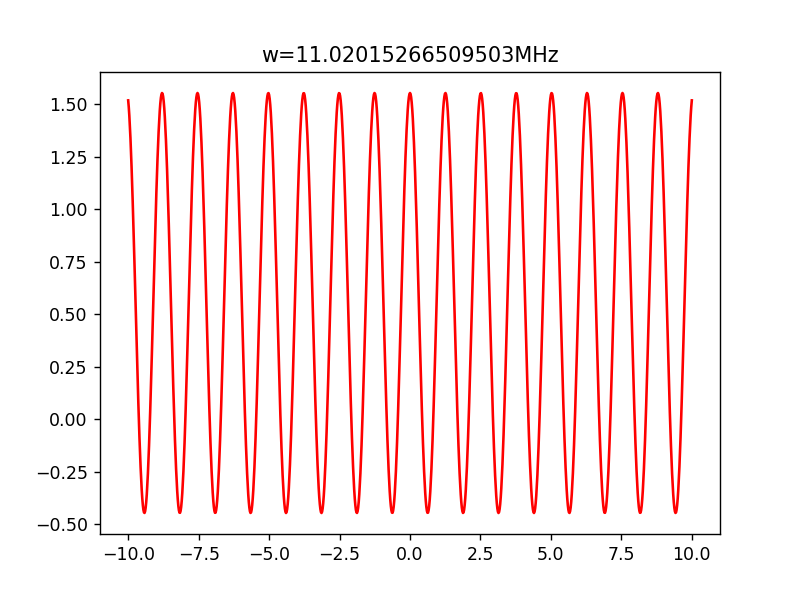

Text(0.5, 1.0, 'w=11.02015266509503MHz')

In [797]:
# x, y = xnew,ybar[:,0]
# A, C, W, phi = op.Cos_Fit().fitCos(x,y)
# y1 = A*np.cos(2*np.pi*W*x+phi)
x = np.linspace(-10,10,1001)
y1 = np.cos(5*x)
plt.figure()
plt.plot(x,y1+C,'r-')
# plt.plot(x,y)
plt.title(f'w={W*1e3}MHz')

<IPython.core.display.Javascript object>


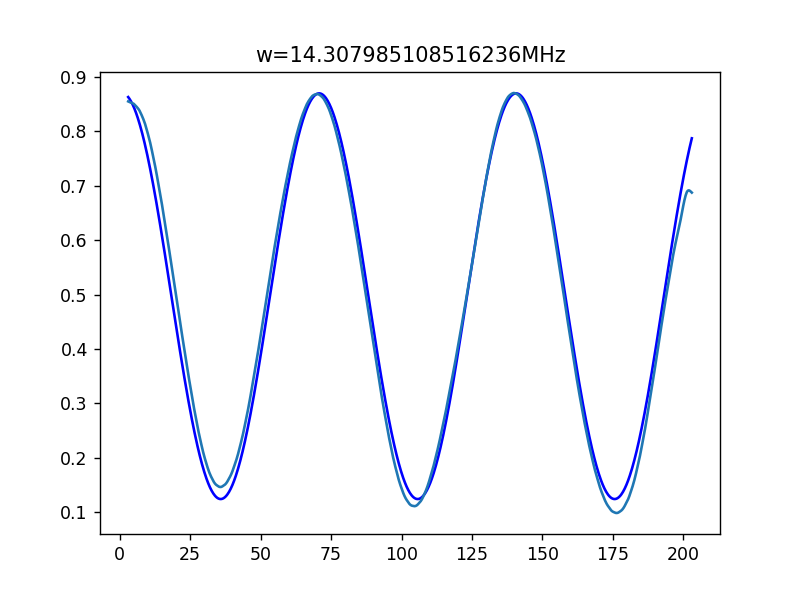

Text(0.5, 1.0, 'w=14.307985108516236MHz')

In [654]:
x, y = xnew,ybar[:,-30]
A, C, W, phi = op.Cos_Fit().fitCos(x,y)
y1 = A*np.cos(2*np.pi*W*x+phi)
plt.figure()
plt.plot(x,y1+C,'b-')
plt.plot(x,y)
plt.title(f'w={W*1e3}MHz')

In [684]:
w

0.003996003996003996

In [641]:
help(np.fft.fftfreq)

Help on function fftfreq in module numpy.fft:

fftfreq(n, d=1.0)
    Return the Discrete Fourier Transform sample frequencies.
    
    The returned float array `f` contains the frequency bin centers in cycles
    per unit of the sample spacing (with zero at the start).  For instance, if
    the sample spacing is in seconds, then the frequency unit is cycles/second.
    
    Given a window length `n` and a sample spacing `d`::
    
      f = [0, 1, ...,   n/2-1,     -n/2, ..., -1] / (d*n)   if n is even
      f = [0, 1, ..., (n-1)/2, -(n-1)/2, ..., -1] / (d*n)   if n is odd
    
    Parameters
    ----------
    n : int
        Window length.
    d : scalar, optional
        Sample spacing (inverse of the sampling rate). Defaults to 1.
    
    Returns
    -------
    f : ndarray
        Array of length `n` containing the sample frequencies.
    
    Examples
    --------
    >>> signal = np.array([-2, 8, 6, 4, 1, 0, 3, 5], dtype=float)
    >>> fourier = np.fft.fft(signal)
    >>> n = 

<IPython.core.display.Javascript object>


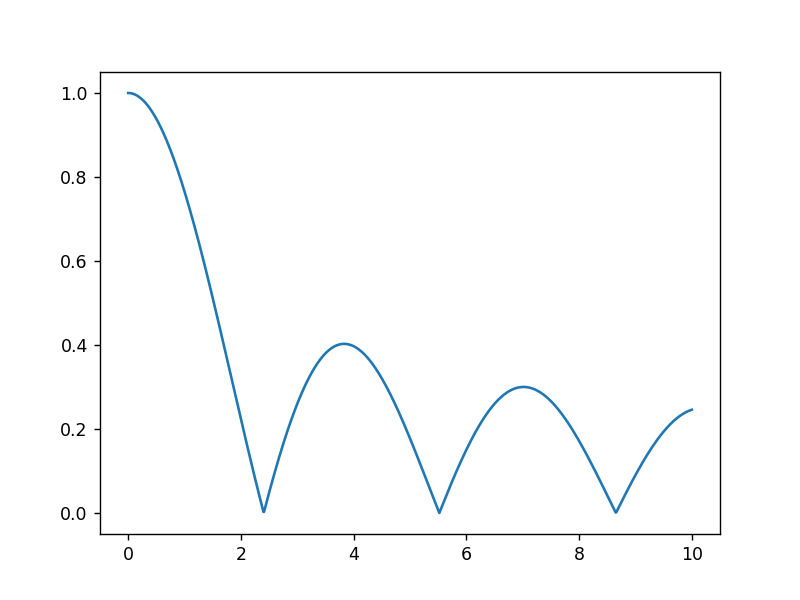

In [2781]:
from scipy import special
plt.figure()
x = np.linspace(0,10,1001)
plt.plot(x,np.abs(special.jv(0,x)))

In [2732]:
np.shape(x)

(101,)

# 拟合Rabi

<IPython.core.display.Javascript object>


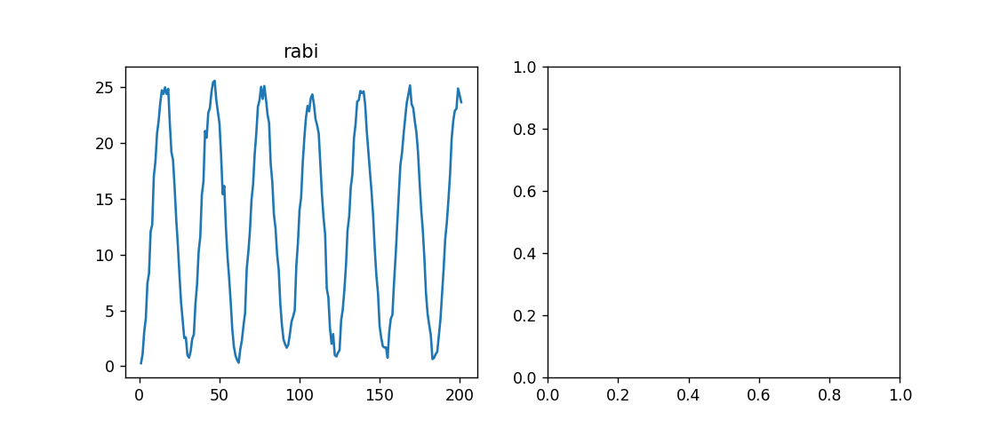

['q1'] 2020-08-17 16:02:03.090880


In [264]:
value,num,tags,finishtime = write(height=4,title='rabi',which=120)
print(tags,finishtime)

In [267]:
np.savez(r'rabi.npz',rows=value[0][0],s=value[0][1])

In [774]:
fig = plt.gcf()
ax = plt.getp(fig,'axes')
for i in range(num):
    x, y  = value[i][0], value[i][1]
    A,B,T1,w,phi,out = op.Rabi_Fit(envelopemethod='hilbert',phi=0,T1=60000).fitRabi(np.abs(x),np.abs(y))
    z = A*np.exp(-x/T1)*np.cos(2*np.pi*w*x+phi) + B
#     env = out[0]*np.exp(-x/out[2]) + out[1]
    env = A*np.exp(-x/T1) + B
    sample = (np.max(x) - np.min(x))/(len(x) - 1)
    yt  = np.fft.fftshift(np.fft.fftfreq(len(y))) / sample
    amp = np.fft.fftshift(np.fft.fft(y))
    ax[i].plot(x,z)
#     ax[i].plot(x,out[3])
    ax[i].plot(x,env)
    ax[i].set_title('$T_{1}=%fns,period=%fns$'%(T1,1/w/2))
    ax[i].set_xlabel('time / ns')
    ax[i].set_ylabel('Voltage / a.u.')
    ax[1].plot(yt[yt!=0],np.abs(amp[yt!=0]))
    ax[1].set_title('$W=%.3f$'%(np.abs(yt[yt!=0][np.argmax(np.abs(amp[yt!=0]))])))
plt.show()

(11.609983204322628, 12.625878980025979, 60000, 1.9801980198019802, 0)
(1.8532362564721678, 14.452023796739262, 60000, 1.9801980198019802, 0)
(0.5032659764838676, 0.5211813356445554, 60000, 1.9801980198019802, 0)
(0.5038278841927994, 0.41063629938132473, 60000, 49.504950495049506, 0)
(0.31816557051402894, 0.3778075503191889, 60000, 1.9801980198019802, 0)
(0.6250382121787701, 0.5559551833490668, 60000, 49.504950495049506, 0)
(0.40181317082909285, 0.4201365790313722, 60000, 1.9801980198019802, 0)
(0.4911072459555608, 0.7352107908654045, 60000, 49.504950495049506, 0)
(0.607560490379137, 0.5408191460153239, 60000, 1.9801980198019802, 0)
(0.8294820660776243, 0.9668870909210471, 60000, 1.9801980198019802, 0)


In [347]:
tag = ''
for i in tags:
    tag += i
save('Rabi',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=value[0][0],col=value[0][1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/Rabi/q6_20200824171712.npz')

# 拟合Ramsey及SpinEcho

<IPython.core.display.Javascript object>


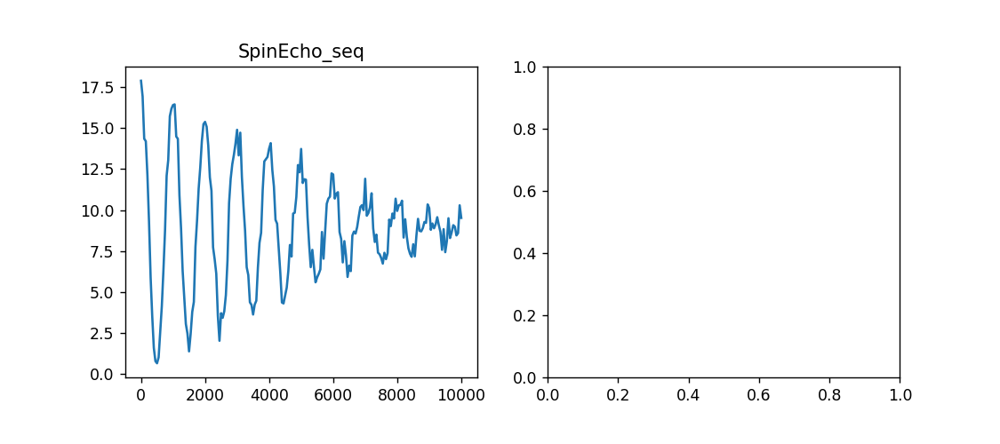

['q10'] 2020-10-15 21:22:23.248408


In [281]:
value,num,tags,finishtime = write(height=4,title='SpinEcho_seq',which=0)
print(tags,finishtime)

In [282]:
np.savez(r'spinecho.npz',rows=value[0][0],s=value[0][1])

<IPython.core.display.Javascript object>


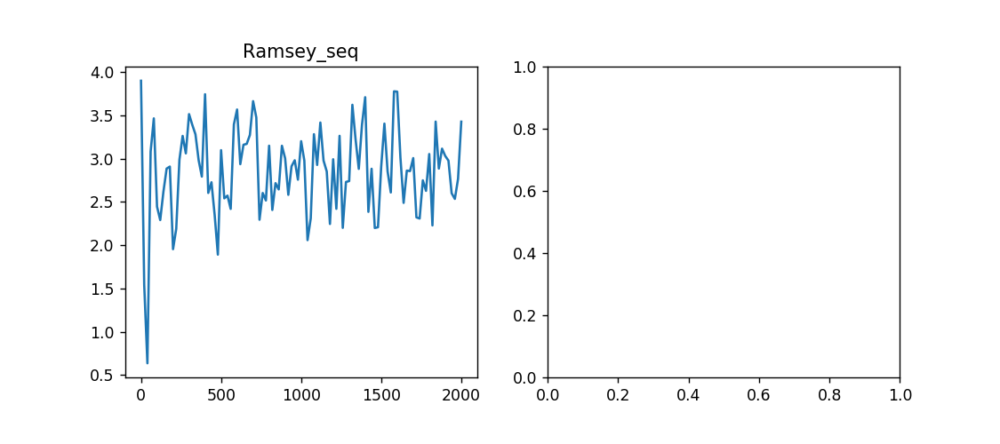

['q1'] 2020-09-14 23:28:49.560710


In [274]:
value,num,tags,finishtime = write(height=4,title='Ramsey_seq',which=7)
print(tags,finishtime)

In [351]:
tag = ''
for i in tags:
    tag += i
save('SpinEcho',tag,base_path=r'D:\skzhao\data\ffsu\Nb10bits_2_cuqiang',row=value[0][0],col=value[0][1])

WindowsPath('D:/skzhao/data/ffsu/Nb10bits_2_cuqiang/2020/0824/SpinEcho/q6_20200824171804.npz')

In [195]:
fig = plt.gcf()
ax = plt.getp(fig,'axes')
for i in range(num):
    x, y  = value[i][0], value[i][1]
    sample = (np.max(x) - np.min(x))/(len(x) - 1)
    yt  = np.fft.fftshift(np.fft.fftfreq(len(y))) / sample
    amp = np.fft.fftshift(np.fft.fft(y))
    A,B,T1,T2,w,phi,out = op.T2_Fit(T1=10000,funcname='gauss',envelopemethod='hilbert').fitT2(x,np.abs(y))
    z = A*np.exp(-(x/T2)**2-x/T1/2)*np.cos(2*np.pi*w*x+phi) + B
    z_env = A*np.exp(-(x/T2)**2-x/T1/2) + B
    env = out[0]*np.exp(-(x/out[3])**2-x/out[2]/2)+out[1]
    ax[i].plot(x,z)
    ax[i].plot(x,z_env)
#     ax[i].plot(x,out[-1])
    #ax[i].set_title('$T_{1}=%f,T_{2}=%f,w=%f$'%(T1,T2,w*1e3))
    ax[i].set_title('$T_{2}^{*}=%.2fns,\omega=%.2fMHz$'%(T2,w*1e3))
    ax[1].plot(yt[yt!=0],np.abs(amp[yt!=0]))
    ax[i].set_xlabel('time / ns')
    ax[i].set_ylabel('Voltage / a.u.')
plt.show()

(34.91981229548298, -42.55621409044663, 10000, 1387.5, 0.0029702970297029703, 0)


## 指数拟合

In [162]:
fig = plt.gcf()
ax = plt.getp(fig,'axes')
for i in range(num):
    x, y  = value[i][0], value[i][1]
    A,B,T1,w,phi,out = op.Rabi_Fit(envelopemethod='hilbert',phi=0).fitRabi(np.abs(x),np.abs(y))
    z = A*np.exp(-x/T1)*np.cos(2*np.pi*w*x+phi) + B
#     env = out[0]*np.exp(-x/out[2]) + out[1]
    env = A*np.exp(-x/T1) + B
    sample = (np.max(x) - np.min(x))/(len(x) - 1)
    yt  = np.fft.fftshift(np.fft.fftfreq(len(y))) / sample
    amp = np.fft.fftshift(np.fft.fft(y))
    ax[i].plot(x,z)
#     ax[i].plot(x,out[3])
    ax[i].plot(x,env)
    ax[i].set_title('$exp-fit,T_{2}=%.2fns$'%T1)
    ax[i].set_xlabel('time / ns')
    ax[i].set_ylabel('Voltage / a.u.')
    ax[1].plot(yt[yt!=0],np.abs(amp[yt!=0]))
    ax[1].set_title('$W=%.3f$'%(np.abs(yt[yt!=0][np.argmax(np.abs(amp[yt!=0]))])))
plt.show()

(37.30802970231167, 43.44680974096844, 20000, 0.0027722772277227726, 0)


In [248]:
1/(1/4.75-1/16)

6.755555555555556

# ramseyZpulse

<IPython.core.display.Javascript object>


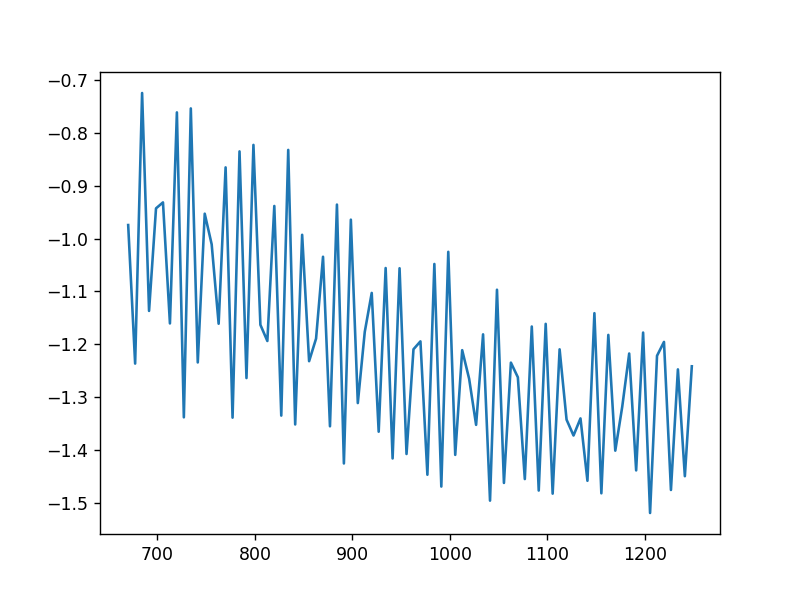

In [94]:
data, ID, comment, tags, name = read(title='ramseyZpulse',which=0)
x, y = data[0], data[1]
coordinate = [[1-2*j[i] for i in range(2)] for j in y]
theta = np.array([np.arctan(i[1]/i[0]) for i in coordinate])
plt.figure()
plt.plot(x[:,0],-theta)
plt.show()

# AC_Stark

<IPython.core.display.Javascript object>


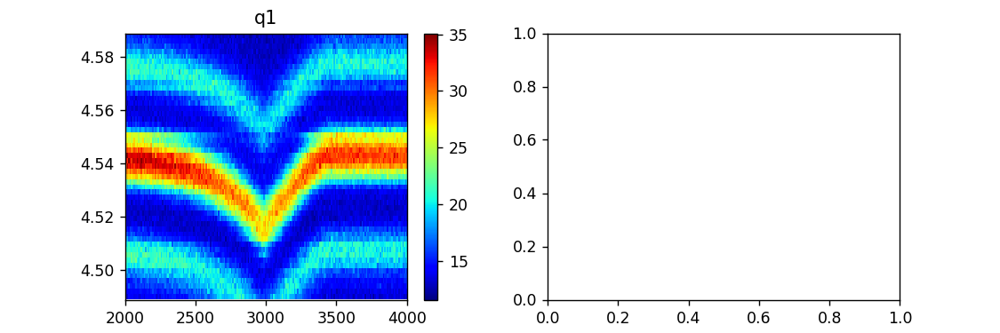

['q1'] 2020-09-13 23:36:25.229126


In [90]:
value,num,tags,finishtime = write(height=3,title='acStark',which=0,peak=300)
print(tags,finishtime)

In [107]:
async def exMixing(f):
    qname = [i for i in f]
    f_ex = np.array([f[i] for i in f])
    ex_lo = f_ex.mean() + 50e6
    delta =  ex_lo - f_ex
    delta_ex = {qname[i]:delta[i] for i in range(len(qname))}
    # n = len(f_ex)
    return ex_lo, delta_ex

In [109]:
f_ex1, f_ex2 = {'f1':4e9},{'f2':3e9}
ex_lo1, delta_ex1 = await exMixing(f_ex1)
ex_lo2, delta_ex2 = await exMixing(f_ex2)

In [113]:
{**delta_ex1,**delta_ex2}

{'f1': 50000000.0, 'f2': 50000000.0}

<IPython.core.display.Javascript object>


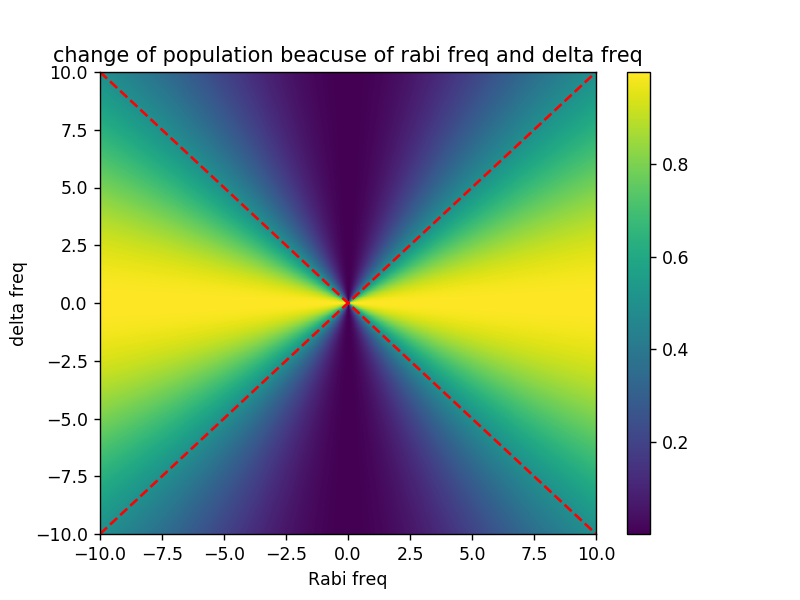

In [722]:
x = np.linspace(-10,10,1000)
z = np.linspace(-10,10,1000)
y = [x**2/(x**2+i**2) for i in z]
plt.figure()
plt.imshow(y,aspect='auto',origin='lower',extent=[min(x),max(x),min(z),max(z)])
plt.plot([-10,10],[-10,10],'r--')
plt.plot([-10,10],[10,-10],'r--')
plt.xlabel('Rabi freq')
plt.ylabel('delta freq')
plt.title('change of population beacuse of rabi freq and delta freq')
plt.colorbar()
plt.show()

In [515]:
def test(y,z=0,l=0):
    return y+z+l

In [516]:
def f(x,func,**kw):
    h = func(**kw)
    print('lala=',kw['l'])
    print(h+1)

In [518]:
f(10,test,y=1,z=2,l=11)

TypeError: f() takes 2 positional arguments but 3 were given

In [489]:
def f(l=[]):
    l.append(1)
    return l

In [490]:
f(l=['qq1'])

['qq1', 1]

In [491]:
f(l=['q2'])

['q2', 1]

In [492]:
f()

[1]

In [519]:
x = np.arange(0,1,0.01)

In [523]:
isinstance(x,np.ndarray)

True

In [533]:
f1, f2 = {}, {}

In [534]:
f2['q1'] = 1

In [535]:
f1

{}

In [25]:
def predistort(waveform, sRate, zCali):
    """Predistort input waveform.
    Parameters
    ----------
        waveform : complex numpy array
            Waveform data to be pre-distorted
        zCali: [2.55e-9, -28e-3, 8.02e-9, -28e-3, 101.5e-9, -14.5e-3,369.7e-9,-6.2e-3]
    Returns
    -------
    waveform : complex numpy array
        Pre-distorted waveform
    """
    dt = 1 / sRate
    wf_size = len(waveform)
    tau1, A1, tau2, A2, tau3, A3, tau4, A4, tau5, A5 = zCali
    print('tau:', tau1, A1, tau2, A2, tau3, A3, tau4, A4, tau5, A5)
    # pad with zeros at end to make sure response has time to go to zero
    # pad_time = 6 * max([tau1, tau2, tau3])
    pad_time = 4e-6  # 这里默认改为增加4us的pad，返回时舍去1us，保留3us拖尾
    pad_size = round(pad_time / dt)
    pad_size_2 = round(3e-6 / dt)  # 保留的点数
    padded_zero = np.zeros(pad_size)
    padded = np.append(waveform,padded_zero)

    Y = np.fft.rfft(padded, norm='ortho')

    omega = 2 * np.pi * np.fft.rfftfreq(wf_size+pad_size, dt)
    H = (1 + (1j * A1 * omega * tau1) / (1j * omega * tau1 + 1) +
         (1j * A2 * omega * tau2) / (1j * omega * tau2 + 1) +
         (1j * A3 * omega * tau3) / (1j * omega * tau3 + 1) +
         (1j * A4 * omega * tau4) / (1j * omega * tau4 + 1)+
         (1j * A5 * omega * tau5) / (1j * omega * tau5 + 1))

    Yc = Y / H
    yc = np.fft.irfft(Yc, norm='ortho')
    # return yc[:wf_size]
    #这里返回增加了3us拖尾的序列
    return yc[:(wf_size+pad_size_2)]

In [1757]:
250000-7500

242500

tau: 2.55e-09 -0.028 8.02e-09 -0.028 1.015e-07 -0.0145 3.697e-07 -0.0062 5e-09 -0.005


<IPython.core.display.Javascript object>


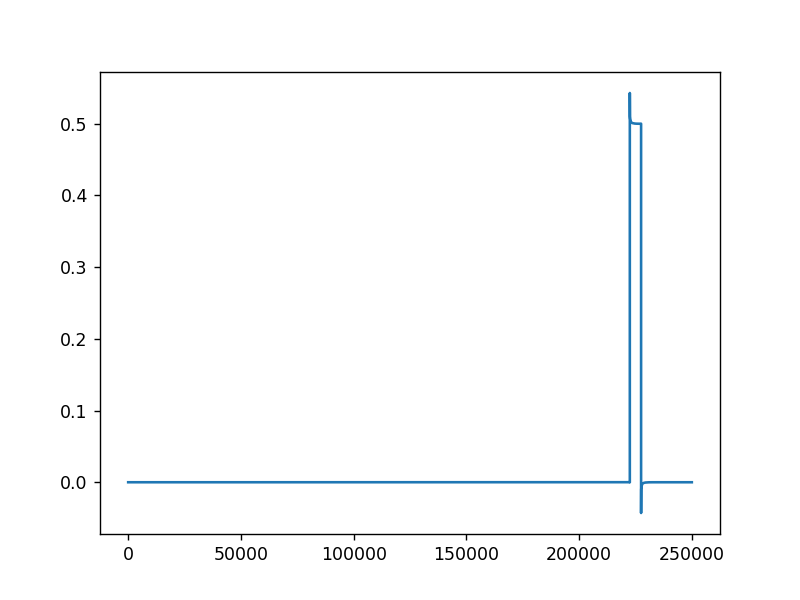

In [39]:
t = np.linspace(-90000,7000,242500)*1e-9
w = wn.square(2000e-9)*0.5
wave = w(t)
I = predistort(wave,2.5e9,[2.55e-9, -28e-3, 8.02e-9, -28e-3, 101.5e-9, -14.5e-3,369.7e-9,-6.2e-3,5e-9,-5e-3])
plt.figure()
plt.plot(I)
plt.show()

In [34]:
len(np.array((np.arange(10),))+np.array((np.arange(10),)))

1

In [16]:
z_new = a*b*np.exp(b*x) + c*d*np.exp(d*x) 
# z_new = z_new/np.max(np.abs(z_new))
# x = Twoexp(para,t)
def hfunc(x):
    global z_new
#     y = (a*b*np.exp(b*x) + c*d*np.exp(d*x))/np.max(np.abs(a*b*np.exp(b*x) + c*d*np.exp(d*x)))
    
    H = np.fft.fft(z_new) + 1/2/np.pi
    h = np.fft.ifft(H)
    return h, H

In [17]:
t = np.linspace(-90000,10000,250000)
w = wn.square(5000)
wave = w(t)
h, H = hfunc(t)
wave_cali = np.convolve(wave,h,'same')

In [1696]:
h, H = hfunc(t)
wave_cali = np.fft.irfft(np.fft.rfft(wave)/H)

C:\WPy64-3740\python-3.7.4.amd64\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


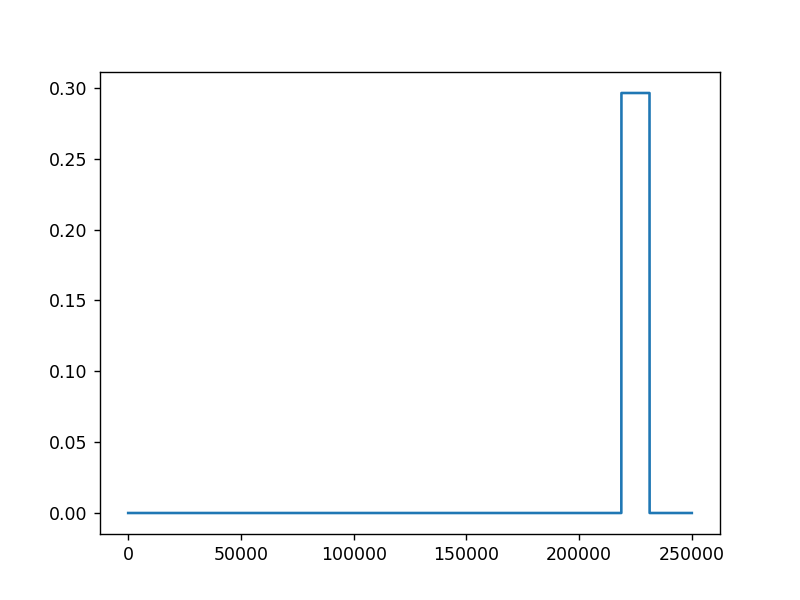

In [19]:
plt.figure()
plt.plot(np.abs(wave_cali))
plt.show()

In [82]:
# help(np.convolve)

# 处理html文件

In [484]:
from qulab import getplotlydat
gpd = imp.reload(getplotlydat)

In [469]:
htmlfile = open(r'D:\step1\14Q1changePwr.html', 'r', encoding='utf-8')
htmlhandle = htmlfile.read()

In [470]:
from bs4 import BeautifulSoup

soup = BeautifulSoup(htmlhandle, 'lxml')

In [485]:
path = r'D:\step1\14Q1changePwr.html'
x, y, z = gpd.gethtmldata(path,flag='x'), gpd.gethtmldata(path,flag='y'), gpd.gethtmldata(path,flag='z')

In [401]:
np.append(np.append(np.arange(1000,2900,40),np.arange(2900,2920,4)),np.arange(2920,2970,1))

array([1000, 1040, 1080, 1120, 1160, 1200, 1240, 1280, 1320, 1360, 1400,
       1440, 1480, 1520, 1560, 1600, 1640, 1680, 1720, 1760, 1800, 1840,
       1880, 1920, 1960, 2000, 2040, 2080, 2120, 2160, 2200, 2240, 2280,
       2320, 2360, 2400, 2440, 2480, 2520, 2560, 2600, 2640, 2680, 2720,
       2760, 2800, 2840, 2880, 2900, 2904, 2908, 2912, 2916, 2920, 2921,
       2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2931, 2932,
       2933, 2934, 2935, 2936, 2937, 2938, 2939, 2940, 2941, 2942, 2943,
       2944, 2945, 2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953, 2954,
       2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965,
       2966, 2967, 2968, 2969])

<IPython.core.display.Javascript object>


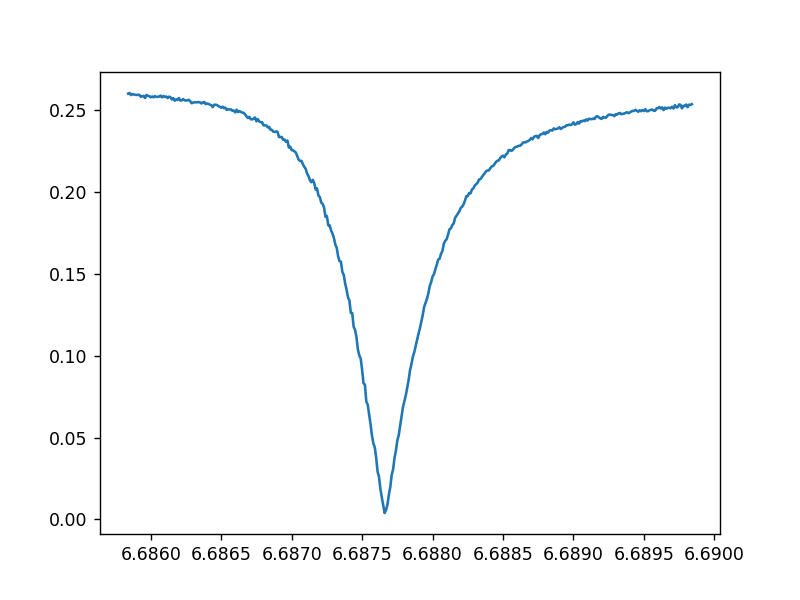

In [492]:
plt.figure()
plt.plot(x[0,:],z[-1])
plt.show()

In [461]:
gpd.initfile(path)[4]-gpd.initfile(path)[3]

422702

In [266]:
data = soup.find('div',{'class':"plotly-graph-div"})
data

<div class="plotly-graph-div" id="9a8d02f7-44bb-4595-8eb9-130b36381b22" style="height:100%; width:100%;"></div>

In [267]:
# help(data)

In [471]:
soup

<html>
<head><meta charset="utf-8"/></head>
<body>
<div>
<script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
<script type="text/javascript">/**
* plotly.js v1.48.1
* Copyright 2012-2019, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
!function(t){if("object"==typeof exports&&"undefined"!=typeof module)module.exports=t();else if("function"==typeof define&&define.amd)define([],t);else{("undefined"!=typeof window?window:"undefined"!=typeof global?global:"undefined"!=typeof self?self:this).Plotly=t()}}(function(){return function(){return function t(e,r,n){function i(o,s){if(!r[o]){if(!e[o]){var l="function"==typeof require&&require;if(!s&&l)return l(o,!0);if(a)return a(o,!0);var c=new Error("Cannot find module '"+o+"'");throw c.code="MODULE_NOT_FOUND",c}var u=r[o]={exports:{}};e[o][0].call(u.exports,function(t){return i(e[o][1][t]||t)},u,u.exports,t,e,r,n)}return r[o].exports}for(var a="function"==typeof require&&require,o=0;o<n.

In [199]:
f0, Qi, Qe, QL, phi, f, s = op.Cavity_fit().fitCavity(f,s21)

0.0003599999999996939


In [191]:
f0, Qi, Qe, QL, phi

(6.391316859672923,
 22621.98170102801,
 9125.835246856113,
 6502.635387493445,
 0.2938967941595496)

<IPython.core.display.Javascript object>


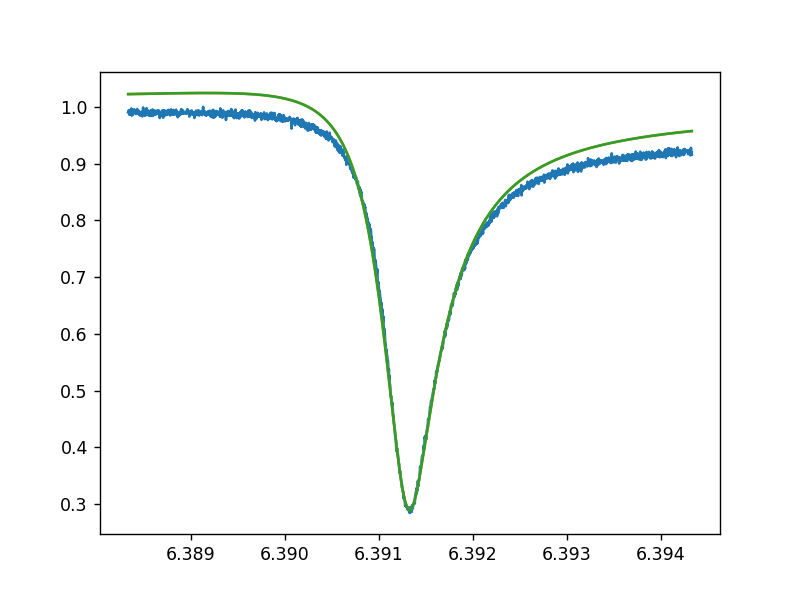

In [201]:
plt.figure()
plt.plot(f,np.abs(s))
plt.plot(f,1/np.abs(op.Cavity_fit().invS21(f, f0, Qi, Qe, phi)))
plt.show()

In [166]:
6.39176-6.39103

0.0007299999999998974

<IPython.core.display.Javascript object>


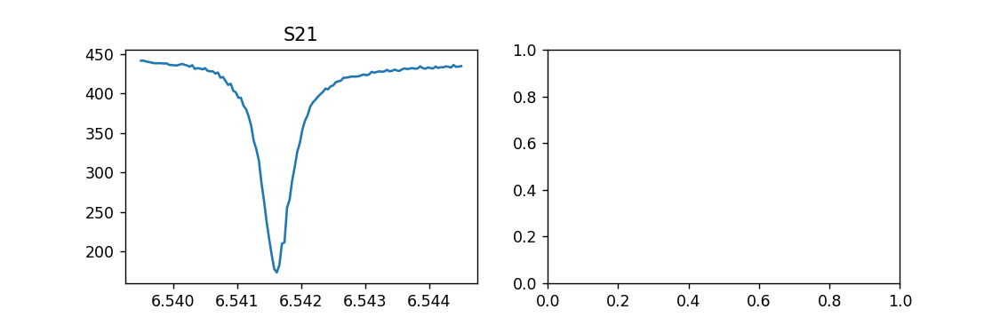

['q4'] 2020-07-12 16:31:13.371257


In [197]:
value,num,tags,finishtime = write(title='S21',height=3,which=1000,peak=11200)
print(tags,finishtime)

In [198]:
x, y = value[0][0], np.abs(value[0][1])

In [273]:
data = np.load(r'C:\Users\23967\Desktop\tozsk\192739Scanfr.npz')
x, y = data['ffrr'], np.abs(data['dataGhz'])

In [122]:
import scipy.signal as signal

In [123]:
x_new = np.linspace(min(x),max(x),1001)
z = signal.resample_poly(y,1001,126,padtype='line')

In [199]:
peaks_index= signal.find_peaks(-y,height=-300,width=0.002)
peaks_index

In [270]:
z= op.RowToRipe().smooth(y,f0=0.015)

In [274]:
index, prominences = op.RowToRipe().findPeaks(y)

<IPython.core.display.Javascript object>


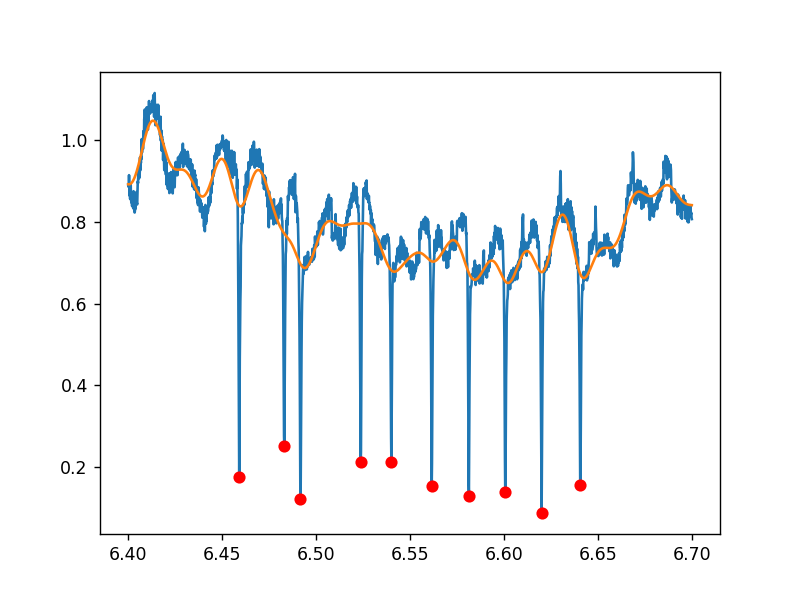

In [275]:
plt.figure()
plt.plot(x,y)
plt.plot(x,z)
plt.plot(x[index],y[index],'ro')
# plt.plot([x[46],x[60]],[y[46],y[60]])
# plt.plot([x[peaks_index[0][0]]]*2,[173.34117099,262.52528213+173.34117099])
# plt.plot(x[peaks_index[0]],y[peaks_index[0]],'ro')

In [338]:
t = np.linspace(-10,10,10001)
y = signal.chirp(t,0,10,100)

<IPython.core.display.Javascript object>


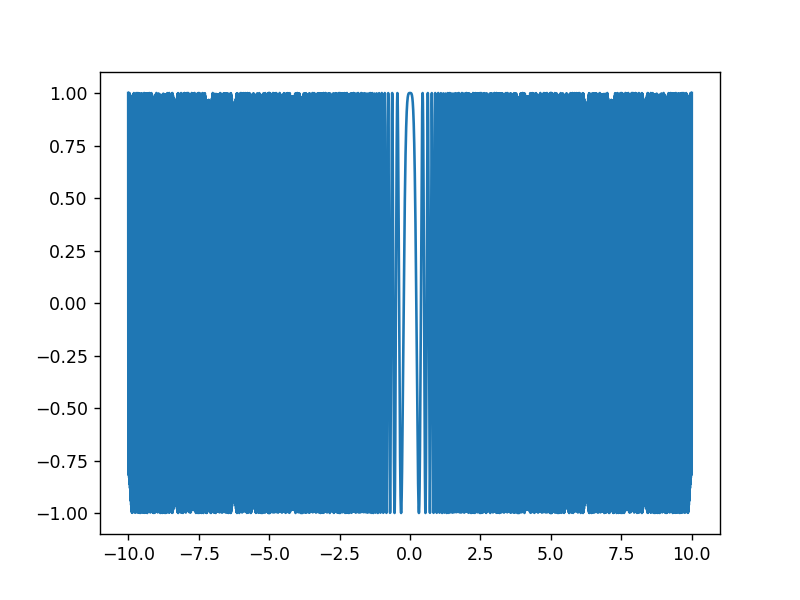

In [339]:
plt.figure()
plt.plot(t,y)
# plt.plot(x,z)

In [638]:
import inspect as insp

In [479]:
x = insp.getfullargspec(f)

In [642]:
functions_list = [o for o in insp.getmembers(op) if insp.isfunction(o[1])]

In [643]:
functions_list

[('bh',
  <function scipy.optimize._basinhopping.basinhopping(func, x0, niter=100, T=1.0, stepsize=0.5, minimizer_kwargs=None, take_step=None, accept_test=None, callback=None, interval=50, disp=False, niter_success=None, seed=None)>),
 ('curve_fit',
  <function scipy.optimize.minpack.curve_fit(f, xdata, ydata, p0=None, sigma=None, absolute_sigma=False, check_finite=True, bounds=(-inf, inf), method=None, jac=None, **kwargs)>),
 ('ls',
  <function scipy.optimize._lsq.least_squares.least_squares(fun, x0, jac='2-point', bounds=(-inf, inf), method='trf', ftol=1e-08, xtol=1e-08, gtol=1e-08, x_scale=1.0, loss='linear', f_scale=1.0, diff_step=None, tr_solver=None, tr_options={}, jac_sparsity=None, max_nfev=None, verbose=0, args=(), kwargs={})>),
 ('pTorho', <function qulab.optimize.pTorho(plist)>)]

FullArgSpec(args=['x', 'y', 'z', 'k'], varargs='args', varkw='kw', defaults=(0, 9), kwonlyargs=[], kwonlydefaults=None, annotations={})

In [485]:
x[3]

(0, 9)

In [483]:
help(insp.getfullargspec)

Help on function getfullargspec in module inspect:

getfullargspec(func)
    Get the names and default values of a callable object's parameters.
    
    A tuple of seven things is returned:
    (args, varargs, varkw, defaults, kwonlyargs, kwonlydefaults, annotations).
    'args' is a list of the parameter names.
    'varargs' and 'varkw' are the names of the * and ** parameters or None.
    'defaults' is an n-tuple of the default values of the last n parameters.
    'kwonlyargs' is a list of keyword-only parameter names.
    'kwonlydefaults' is a dictionary mapping names from kwonlyargs to defaults.
    'annotations' is a dictionary mapping parameter names to annotations.
    
    Notable differences from inspect.signature():
      - the "self" parameter is always reported, even for bound methods
      - wrapper chains defined by __wrapped__ *not* unwrapped automatically



In [468]:
def f(**kws):
    x,y = kws['x'], kws['y']
    print(x,y)

In [572]:
from configparser import ConfigParser

In [573]:
cp = ConfigParser()
cp.read(r'D:\QuLabData\config\status.ini')

['D:\\QuLabData\\config\\status.ini']

In [645]:
cp.set('rabi','nwave','')

In [581]:
cp.add_section('Ramsey')

In [582]:
with open(r'D:\QuLabData\config\status.ini','w') as file:
    cp.write(file)

In [505]:
x = insp.getfullargspec(f)

In [506]:
x

FullArgSpec(args=['x', 'y'], varargs=None, varkw=None, defaults=(1.1,), kwonlyargs=[], kwonlydefaults=None, annotations={'x': <class 'int'>})

In [507]:
x.annotations

{'x': int}

In [510]:
type(x.defaults[0])

float

In [511]:
type(None)

NoneType

In [525]:
def f(x,y=1,z=None):
    print(x,y,z)

In [527]:
f(**{'x':1,'y':2,'z':3})

1 2 3


In [564]:
import yaml

In [569]:
with open('D:\QuLabData\config\status.yaml','r',encoding='utf-8') as ym:
    data = ym.read()

In [567]:
data = yaml.load(data,Loader=yaml.Loader)

In [570]:
data

'test: haha\n'

In [553]:
from ruamel import yaml

In [561]:
x = {'test':'haha'}
with open('D:\QuLabData\config\status.yaml','w',encoding='utf-8') as ym:
    yaml.dump(x, ym, Dumper=yaml.RoundTripDumper)

In [583]:
from pathlib import Path

In [594]:
pathnow = Path('D:\QuLabData\config') / time.strftime('%Y') / time.strftime('%m%d')
fname = f"{name}_{time.strftime('%H%M%S')}.ini"
# pathnow = pathnow / fname
pathnow.mkdir(parents=True, exist_ok=True)

In [595]:
with open(pathnow/fname,'w') as file:
    pass

In [596]:
import pymongo

In [599]:
myclient = pymongo.MongoClient('10.122.7.19',27017)
mydb = myclient["test"]
mycol = mydb["test"]

In [600]:
x = ['1','2']

In [630]:
from mongoengine import (BooleanField, ComplexDateTimeField, Document,
                         FileField, IntField, ListField, ReferenceField,
                         StringField, ObjectIdField)

In [604]:
# from qulab.storage.schema import Record

In [631]:
f = ObjectIdField(cp)

TypeError: db_field should be a string.

In [653]:
from qulab import configread
configread.updatefileattr(cw)

In [654]:
configread.updatefileattr(cw)

NameError: name 'cw' is not defined

In [1]:
import asyncio

In [2]:
loop = asyncio.get_event_loop()

In [3]:
async def test():
    for i in range(10):
        print(f'{i}')

In [5]:
loop.run_until_complete(asyncio.wait([test()]))

RuntimeError: This event loop is already running

0
1
2
3
4
5
6
7
8
9


In [4]:
loop.stop()

In [4]:
loop.close()

RuntimeError: Cannot close a running event loop

In [122]:
def namepack(task):
    # task_run1 = []
    for i in task:
        keyname = list(i.keys())
        task1, task2, task3, task4 = [], [], [], []
        for j in keyname:
            if 'awg131' in j:
                task1.append(i[j])
            if 'awg132' in j:
                task2.append(i[j])
            if 'awg133' in j:
                task3.append(i[j])
            if 'awg134' in j:
                task4.append(i[j])
#         print(task1, task2, task3, task4)
        for k in range(8):
            task_run1 = []
            if len(task1) == len(task2) == len(task3) == len(task4) == 0:
                continue
            if len(task1) != 0:
                task_run1.append(task1.pop(0))
            if len(task2) != 0:
                task_run1.append(task2.pop(0))
            if len(task3) != 0:
                task_run1.append(task3.pop(0))
            if len(task4) != 0:
                task_run1.append(task4.pop(0))
#             print(task1, task2, task3, task4)
            yield task_run1

In [125]:
task = [{'awg131_ch1':1,'awg131_ch2':2,'awg133_ch1':3},{}]

In [126]:
f = namepack(task)